## Exercise

#### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import itertools
print(f"TensorFlow Version: {tf.__version__}")
print(f"Keras Version: {tf.keras.__version__}")

TensorFlow Version: 2.8.2
Keras Version: 2.8.0


In [1]:
from google.colab import files
uploaded = files.upload()

Saving bodyfat.csv to bodyfat.csv


In [2]:
df = pd.read_csv('bodyfat.csv')

In [3]:
df.head()

,Density,BodyFat,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
0,1.0708,12.3,23,154.25,67.75,36.2,93.1,85.2,94.5,59.0,37.3,21.9,32.0,27.4,17.1
1,1.0853,6.1,22,173.25,72.25,38.5,93.6,83.0,98.7,58.7,37.3,23.4,30.5,28.9,18.2
2,1.0414,25.3,22,154.00,66.25,34.0,95.8,87.9,99.2,59.6,38.9,24.0,28.8,25.2,16.6
3,1.0751,10.4,26,184.75,72.25,37.4,101.8,86.4,101.2,60.1,37.3,22.8,32.4,29.4,18.2
4,1.0340,28.7,24,184.25,71.25,34.4,97.3,100.0,101.9,63.2,42.2,24.0,32.2,27.7,17.7


#### Question-1: Perform experiments using (70,15,15) split and tabulate the performance in terms of RMSE for the following Hyper parameters :
- a. Number of Hidden Layers and Number of Units per Layer

|Number of Hidden Layers|Number of Units|
|--|---|
|1|128,0,0|
|2|128,64,0|
|3|128,64,32|

- b. Epochs (10,20,30,40)
- c. Activation function (Sigmoid /RELU)
- d. Without Regularization, with Regularization (L1/L2)
- e. Learning rate (1, 0.3, 0.1, 0.01,0.03,0.001,0.0001,0.00001)

In [4]:
X = df
y = X.pop('BodyFat')

In [5]:
X=(X-X.min())/(X.max()-X.min())
X

,Density,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
0,0.665496,0.016949,0.146127,0.792746,0.253731,0.242531,0.200762,0.151515,0.294264,0.267081,0.189189,0.356436,0.460432,0.232143
1,0.792801,0.000000,0.223789,0.886010,0.368159,0.251318,0.172808,0.218501,0.286783,0.267081,0.290541,0.282178,0.568345,0.428571
2,0.407375,0.000000,0.145105,0.761658,0.144279,0.289982,0.235070,0.226475,0.309227,0.366460,0.331081,0.198020,0.302158,0.142857
3,0.703248,0.067797,0.270795,0.886010,0.313433,0.395431,0.216010,0.258373,0.321696,0.267081,0.250000,0.376238,0.604317,0.428571
4,0.342406,0.033898,0.268751,0.865285,0.164179,0.316344,0.388818,0.269537,0.399002,0.571429,0.331081,0.366337,0.482014,0.339286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,0.690079,0.813559,0.064378,0.777202,0.189055,0.173989,0.180432,0.060606,0.059850,0.111801,0.162162,0.039604,0.338129,0.482143
248,0.251097,0.847458,0.337216,0.834197,0.487562,0.513181,0.452351,0.311005,0.309227,0.484472,0.277027,0.514851,0.546763,0.767857
249,0.331870,0.847458,0.278970,0.756477,0.388060,0.558875,0.534943,0.266348,0.326683,0.267081,0.162162,0.321782,0.446043,0.392857
250,0.394205,0.847458,0.295320,0.849741,0.388060,0.509666,0.405337,0.204147,0.219451,0.534161,0.243243,0.282178,0.604317,0.714286


In [6]:
X_train,  X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

In [7]:
layers = [1,2,3]
epochs = [10,20,30,40]
reg = ['l1','l2','no']
act = ['sigmoid','relu']
lr = [1,0.3,0.1,0.01,0.03,0.001,0.0001,0.00001]
a = [epochs, reg, lr,act,layers]
lst = list(itertools.product(*a))

In [8]:
X_train,  X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

In [9]:
def build_models(epochs, reg, lr, act, layers):
  if layers == 1 and reg=='no':
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=14, name='inputLayer'))
    model.add(tf.keras.layers.Dense(128,activation=act, name='hiddenLayer-1'))
    model.add(tf.keras.layers.Dense(1,name='outputLayer'))
    opt = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='mean_squared_error', optimizer=opt, metrics=[tf.keras.metrics.RootMeanSquaredError()])
    history = model.fit(X_train,y_train,epochs=epochs,validation_split=0.15, verbose=0)
    print('MODEL EVALUATION: ', model.evaluate(X_test, y_test))
    sns.set_style("darkgrid")
    #get the details form the history object
    acc = history.history['root_mean_squared_error']
    val_acc = history.history['val_root_mean_squared_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    plt.figure()
    #Train and validation loss
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.xlabel('Epoch #')
    plt.ylabel('loss')
    plt.title('Training and Validation loss')
    plt.legend()
    plt.show()
    return model.evaluate(X_test, y_test)

  if layers == 2 and reg=='no':
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=14, name='inputLayer'))
    model.add(tf.keras.layers.Dense(128,activation=act, name='hiddenLayer-1'))
    model.add(tf.keras.layers.Dense(64,activation=act, name='hiddenLayer-2'))
    model.add(tf.keras.layers.Dense(1,name='outputLayer'))
    opt = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='mean_squared_error', optimizer=opt, metrics=[tf.keras.metrics.RootMeanSquaredError()])
    history = model.fit(X_train,y_train,epochs=epochs,validation_split=0.15, verbose=0)
    print('MODEL EVALUATION: ', model.evaluate(X_test, y_test))
    sns.set_style("darkgrid")
    #get the details form the history object
    acc = history.history['root_mean_squared_error']
    val_acc = history.history['val_root_mean_squared_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    plt.figure()
    #Train and validation loss
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.xlabel('Epoch #')
    plt.ylabel('loss')
    plt.title('Training and Validation loss')
    plt.legend()
    plt.show()
    return model.evaluate(X_test, y_test)
  if layers==3 and reg=='no':
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=14, name='inputLayer'))
    model.add(tf.keras.layers.Dense(128,activation=act, name='hiddenLayer-1'))
    model.add(tf.keras.layers.Dense(64,activation=act, name='hiddenLayer-2'))
    model.add(tf.keras.layers.Dense(32,activation=act, name='hiddenLayer-3'))
    model.add(tf.keras.layers.Dense(1,name='outputLayer'))
    opt = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='mean_squared_error', optimizer=opt, metrics=[tf.keras.metrics.RootMeanSquaredError()])
    history = model.fit(X_train,y_train,epochs=epochs,validation_split=0.15, verbose=0)
    print('MODEL EVALUATION: ', model.evaluate(X_test, y_test))
    sns.set_style("darkgrid")
    #get the details form the history object
    acc = history.history['root_mean_squared_error']
    val_acc = history.history['val_root_mean_squared_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    plt.figure()
    #Train and validation loss
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.xlabel('Epoch #')
    plt.ylabel('loss')
    plt.title('Training and Validation loss')
    plt.legend()
    plt.show()
    return model.evaluate(X_test, y_test)
  if layers == 1 and reg=='l1':
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=14, name='inputLayer'))
    model.add(tf.keras.layers.Dense(128,activation=act, name='hiddenLayer-1',kernel_regularizer=tf.keras.regularizers.l1()))
    model.add(tf.keras.layers.Dense(1,name='outputLayer'))
    opt = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='mean_squared_error', optimizer=opt, metrics=[tf.keras.metrics.RootMeanSquaredError()])
    history = model.fit(X_train,y_train,epochs=epochs,validation_split=0.15, verbose=0)
    print('MODEL EVALUATION: ', model.evaluate(X_test, y_test))
    sns.set_style("darkgrid")
    #get the details form the history object
    acc = history.history['root_mean_squared_error']
    val_acc = history.history['val_root_mean_squared_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    plt.figure()
    #Train and validation loss
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.xlabel('Epoch #')
    plt.ylabel('loss')
    plt.title('Training and Validation loss')
    plt.legend()
    plt.show()
    return model.evaluate(X_test, y_test)
  if layers == 2 and reg=='l1':
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=14, name='inputLayer'))
    model.add(tf.keras.layers.Dense(128,activation=act, name='hiddenLayer-1',kernel_regularizer=tf.keras.regularizers.l1()))
    model.add(tf.keras.layers.Dense(64,activation=act, name='hiddenLayer-2',kernel_regularizer=tf.keras.regularizers.l1()))
    model.add(tf.keras.layers.Dense(1,name='outputLayer'))
    opt = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='mean_squared_error', optimizer=opt, metrics=[tf.keras.metrics.RootMeanSquaredError()])
    history = model.fit(X_train,y_train,epochs=epochs,validation_split=0.15,verbose=0)
    print('MODEL EVALUATION: ', model.evaluate(X_test, y_test))
    sns.set_style("darkgrid")
    #get the details form the history object
    acc = history.history['root_mean_squared_error']
    val_acc = history.history['val_root_mean_squared_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    plt.figure()
    #Train and validation loss
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.xlabel('Epoch #')
    plt.ylabel('loss')
    plt.title('Training and Validation loss')
    plt.legend()
    plt.show()
    return model.evaluate(X_test, y_test)
  if layers==3 and reg=='l1':
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=14, name='inputLayer'))
    model.add(tf.keras.layers.Dense(128,activation=act, name='hiddenLayer-1',kernel_regularizer=tf.keras.regularizers.l1()))
    model.add(tf.keras.layers.Dense(64,activation=act, name='hiddenLayer-2',kernel_regularizer=tf.keras.regularizers.l1()))
    model.add(tf.keras.layers.Dense(32,activation=act, name='hiddenLayer-3',kernel_regularizer=tf.keras.regularizers.l1()))
    model.add(tf.keras.layers.Dense(1,name='outputLayer'))
    opt = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='mean_squared_error', optimizer=opt, metrics=[tf.keras.metrics.RootMeanSquaredError()])
    history = model.fit(X_train,y_train,epochs=epochs,validation_split=0.15, verbose=0)
    print('MODEL EVALUATION: ', model.evaluate(X_test, y_test))
    sns.set_style("darkgrid")
    #get the details form the history object
    acc = history.history['root_mean_squared_error']
    val_acc = history.history['val_root_mean_squared_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    plt.figure()
    #Train and validation loss
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.xlabel('Epoch #')
    plt.ylabel('loss')
    plt.title('Training and Validation loss')
    plt.legend()
    plt.show()
    return model.evaluate(X_test, y_test)

  if layers == 1 and reg=='l2':
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=14, name='inputLayer'))
    model.add(tf.keras.layers.Dense(128,activation=act, name='hiddenLayer-1',kernel_regularizer=tf.keras.regularizers.l2()))
    model.add(tf.keras.layers.Dense(1,name='outputLayer'))
    opt = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='mean_squared_error', optimizer=opt, metrics=[tf.keras.metrics.RootMeanSquaredError()])
    history = model.fit(X_train,y_train,epochs=epochs,validation_split=0.15, verbose=0)
    print('MODEL EVALUATION: ', model.evaluate(X_test, y_test))
    sns.set_style("darkgrid")
    #get the details form the history object
    acc = history.history['root_mean_squared_error']
    val_acc = history.history['val_root_mean_squared_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    plt.figure()
    #Train and validation loss
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.xlabel('Epoch #')
    plt.ylabel('loss')
    plt.title('Training and Validation loss')
    plt.legend()
    plt.show()
    return model.evaluate(X_test, y_test)
  if layers == 2 and reg=='l2':
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=14, name='inputLayer'))
    model.add(tf.keras.layers.Dense(128,activation=act, name='hiddenLayer-1',kernel_regularizer=tf.keras.regularizers.l2()))
    model.add(tf.keras.layers.Dense(64,activation=act, name='hiddenLayer-2',kernel_regularizer=tf.keras.regularizers.l2()))
    model.add(tf.keras.layers.Dense(1,name='outputLayer'))
    opt = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='mean_squared_error', optimizer=opt, metrics=[tf.keras.metrics.RootMeanSquaredError()])
    history = model.fit(X_train,y_train,epochs=epochs,validation_split=0.15, verbose=0)
    print('MODEL EVALUATION: ', model.evaluate(X_test, y_test))
    sns.set_style("darkgrid")
    #get the details form the history object
    acc = history.history['root_mean_squared_error']
    val_acc = history.history['val_root_mean_squared_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    plt.figure()
    #Train and validation loss
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.xlabel('Epoch #')
    plt.ylabel('loss')
    plt.title('Training and Validation loss')
    plt.legend()
    plt.show()
    return model.evaluate(X_test, y_test)
  if layers==3 and reg=='l2':
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=14, name='inputLayer'))
    model.add(tf.keras.layers.Dense(128,activation=act, name='hiddenLayer-1',kernel_regularizer=tf.keras.regularizers.l2()))
    model.add(tf.keras.layers.Dense(64,activation=act, name='hiddenLayer-2',kernel_regularizer=tf.keras.regularizers.l2()))
    model.add(tf.keras.layers.Dense(32,activation=act, name='hiddenLayer-3',kernel_regularizer=tf.keras.regularizers.l2()))
    model.add(tf.keras.layers.Dense(1,name='outputLayer'))
    opt = tf.keras.optimizers.Adam(learning_rate=lr)
    model.compile(loss='mean_squared_error', optimizer=opt, metrics=[tf.keras.metrics.RootMeanSquaredError()])
    history = model.fit(X_train,y_train,epochs=epochs,validation_split=0.15, verbose=0)
    print('MODEL EVALUATION: ', model.evaluate(X_test, y_test))
    sns.set_style("darkgrid")
    #get the details form the history object
    acc = history.history['root_mean_squared_error']
    val_acc = history.history['val_root_mean_squared_error']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    plt.figure()
    #Train and validation loss
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.xlabel('Epoch #')
    plt.ylabel('loss')
    plt.title('Training and Validation loss')
    plt.legend()
    plt.show()
    return model.evaluate(X_test, y_test)

Model: 1
2/2 [==============================] - 0s 6ms/step - loss: 51.3962 - root_mean_squared_error: 4.3516
MODEL EVALUATION:  [51.39619445800781, 4.351586818695068]


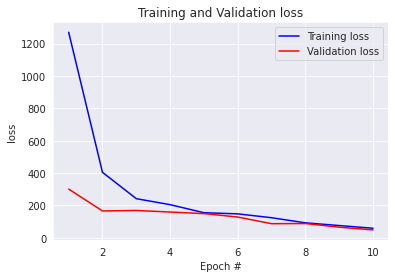

2/2 [==============================] - 0s 6ms/step - loss: 51.3962 - root_mean_squared_error: 4.3516
Model: 2
2/2 [==============================] - 0s 5ms/step - loss: 212.9671 - root_mean_squared_error: 6.8337
MODEL EVALUATION:  [212.9671173095703, 6.833697319030762]


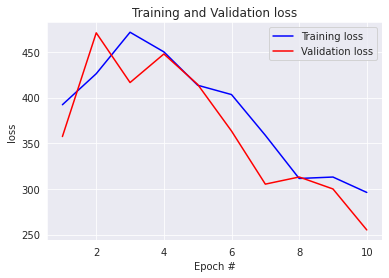

2/2 [==============================] - 0s 6ms/step - loss: 212.9671 - root_mean_squared_error: 6.8337
Model: 3
2/2 [==============================] - 0s 8ms/step - loss: 120.9041 - root_mean_squared_error: 7.4515
MODEL EVALUATION:  [120.90410614013672, 7.451487064361572]


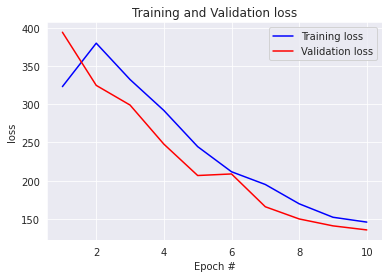

2/2 [==============================] - 0s 7ms/step - loss: 120.9041 - root_mean_squared_error: 7.4515
Model: 4
2/2 [==============================] - 0s 5ms/step - loss: 135.2493 - root_mean_squared_error: 8.2979
MODEL EVALUATION:  [135.24928283691406, 8.297901153564453]


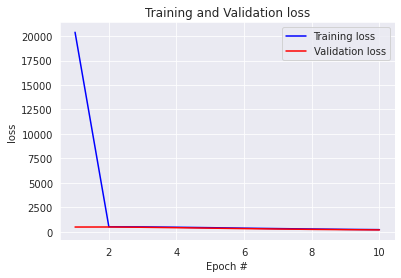

2/2 [==============================] - 0s 7ms/step - loss: 135.2493 - root_mean_squared_error: 8.2979
Model: 5
2/2 [==============================] - 0s 8ms/step - loss: 290.7245 - root_mean_squared_error: 6.5721
MODEL EVALUATION:  [290.72454833984375, 6.57208251953125]


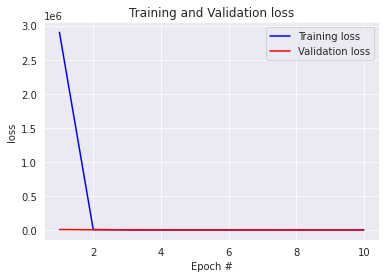

2/2 [==============================] - 0s 7ms/step - loss: 290.7245 - root_mean_squared_error: 6.5721
Model: 6
2/2 [==============================] - 0s 7ms/step - loss: 968.8493 - root_mean_squared_error: 25.8904
MODEL EVALUATION:  [968.8493041992188, 25.89044761657715]


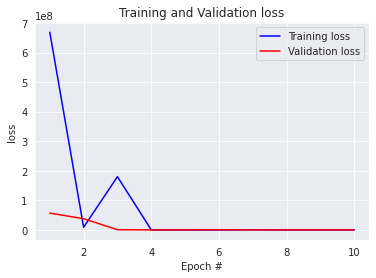

2/2 [==============================] - 0s 9ms/step - loss: 968.8493 - root_mean_squared_error: 25.8904
Model: 7
2/2 [==============================] - 0s 14ms/step - loss: 16.0786 - root_mean_squared_error: 2.4385
MODEL EVALUATION:  [16.078632354736328, 2.4385130405426025]


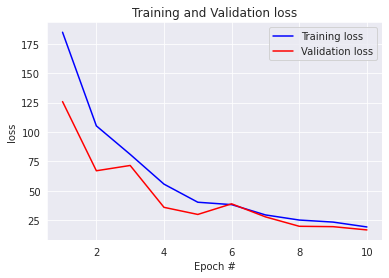

2/2 [==============================] - 0s 12ms/step - loss: 16.0786 - root_mean_squared_error: 2.4385
Model: 8
2/2 [==============================] - 0s 8ms/step - loss: 93.0429 - root_mean_squared_error: 6.6633
MODEL EVALUATION:  [93.04292297363281, 6.66334867477417]


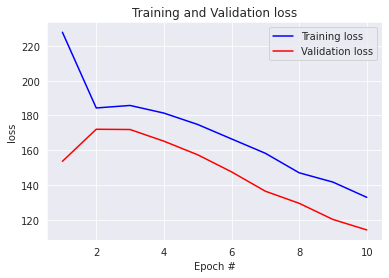

2/2 [==============================] - 0s 8ms/step - loss: 93.0429 - root_mean_squared_error: 6.6633
Model: 9
2/2 [==============================] - 0s 8ms/step - loss: 65.1318 - root_mean_squared_error: 6.7032
MODEL EVALUATION:  [65.13184356689453, 6.703245162963867]


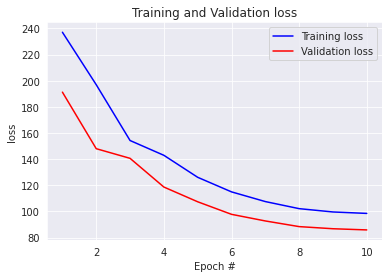

2/2 [==============================] - 0s 7ms/step - loss: 65.1318 - root_mean_squared_error: 6.7032
Model: 10
2/2 [==============================] - 0s 5ms/step - loss: 21.4295 - root_mean_squared_error: 3.0393
MODEL EVALUATION:  [21.429466247558594, 3.039252758026123]


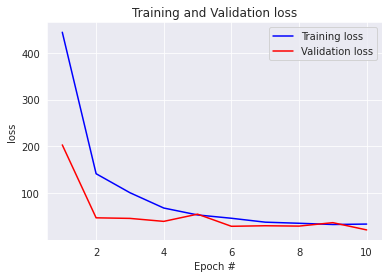

2/2 [==============================] - 0s 7ms/step - loss: 21.4295 - root_mean_squared_error: 3.0393
Model: 11
2/2 [==============================] - 0s 6ms/step - loss: 77.9810 - root_mean_squared_error: 2.9927
MODEL EVALUATION:  [77.98095703125, 2.9926795959472656]


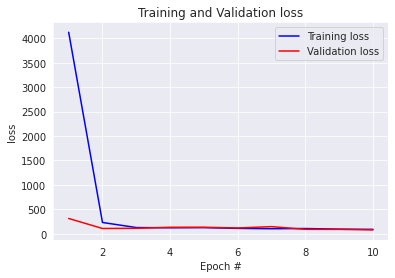

2/2 [==============================] - 0s 8ms/step - loss: 77.9810 - root_mean_squared_error: 2.9927
Model: 12
2/2 [==============================] - 0s 9ms/step - loss: 420.0701 - root_mean_squared_error: 17.9623
MODEL EVALUATION:  [420.0700988769531, 17.962276458740234]


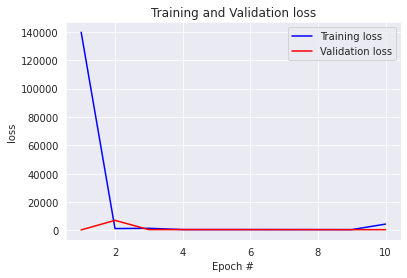

2/2 [==============================] - 0s 8ms/step - loss: 420.0701 - root_mean_squared_error: 17.9623
Model: 13
2/2 [==============================] - 0s 11ms/step - loss: 16.5444 - root_mean_squared_error: 2.8484
MODEL EVALUATION:  [16.544376373291016, 2.84840726852417]


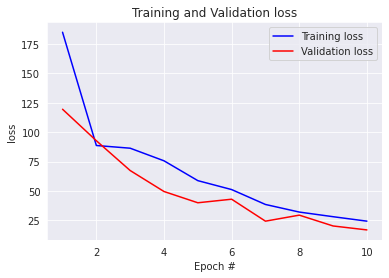

2/2 [==============================] - 0s 6ms/step - loss: 16.5444 - root_mean_squared_error: 2.8484
Model: 14
2/2 [==============================] - 0s 9ms/step - loss: 62.9614 - root_mean_squared_error: 6.5773
MODEL EVALUATION:  [62.96141815185547, 6.577278137207031]


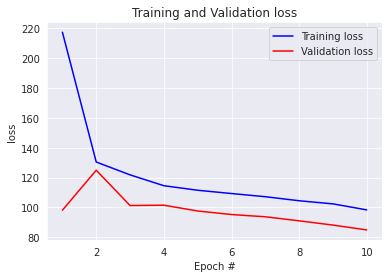

2/2 [==============================] - 0s 10ms/step - loss: 62.9614 - root_mean_squared_error: 6.5773
Model: 15
2/2 [==============================] - 0s 11ms/step - loss: 49.6805 - root_mean_squared_error: 6.4184
MODEL EVALUATION:  [49.68049240112305, 6.41836404800415]


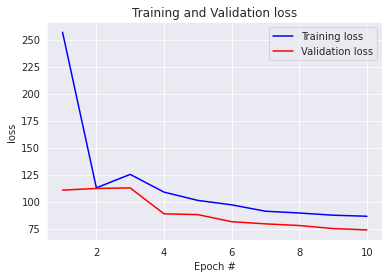

2/2 [==============================] - 0s 10ms/step - loss: 49.6805 - root_mean_squared_error: 6.4184
Model: 16
2/2 [==============================] - 0s 9ms/step - loss: 13.8562 - root_mean_squared_error: 2.9851
MODEL EVALUATION:  [13.856210708618164, 2.9851086139678955]


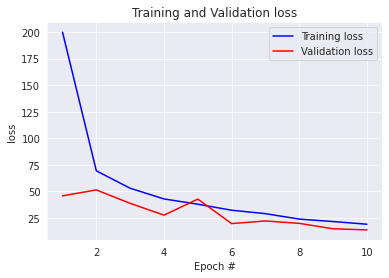

2/2 [==============================] - 0s 9ms/step - loss: 13.8562 - root_mean_squared_error: 2.9851
Model: 17
2/2 [==============================] - 0s 7ms/step - loss: 35.6333 - root_mean_squared_error: 4.7749
MODEL EVALUATION:  [35.63329315185547, 4.774933815002441]


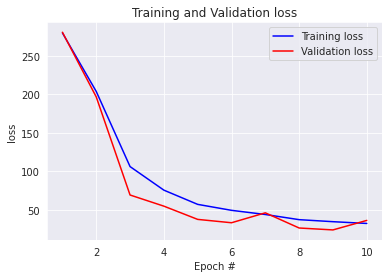

2/2 [==============================] - 0s 9ms/step - loss: 35.6333 - root_mean_squared_error: 4.7749
Model: 18
2/2 [==============================] - 0s 8ms/step - loss: 34.7023 - root_mean_squared_error: 4.2057
MODEL EVALUATION:  [34.70232391357422, 4.205709934234619]


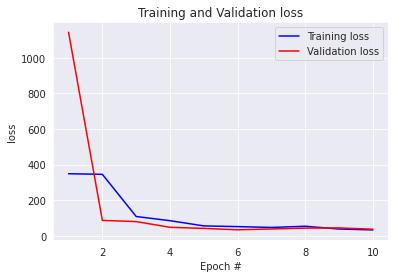

2/2 [==============================] - 0s 8ms/step - loss: 34.7023 - root_mean_squared_error: 4.2057
Model: 19
2/2 [==============================] - 0s 9ms/step - loss: 38.5144 - root_mean_squared_error: 5.9315
MODEL EVALUATION:  [38.51439666748047, 5.931469917297363]


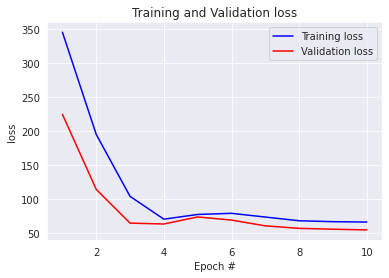

2/2 [==============================] - 0s 9ms/step - loss: 38.5144 - root_mean_squared_error: 5.9315
Model: 20
2/2 [==============================] - 0s 11ms/step - loss: 51.3237 - root_mean_squared_error: 6.5163
MODEL EVALUATION:  [51.32374572753906, 6.516318321228027]


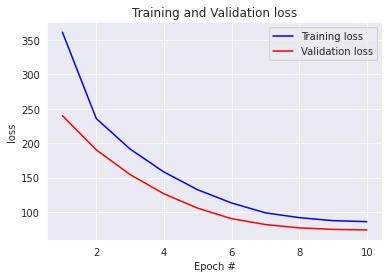

2/2 [==============================] - 0s 12ms/step - loss: 51.3237 - root_mean_squared_error: 6.5163
Model: 21
2/2 [==============================] - 0s 20ms/step - loss: 58.6070 - root_mean_squared_error: 7.2600
MODEL EVALUATION:  [58.607025146484375, 7.260047912597656]


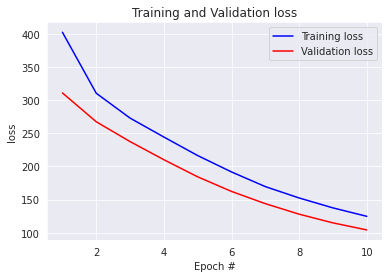

2/2 [==============================] - 0s 10ms/step - loss: 58.6070 - root_mean_squared_error: 7.2600
Model: 22
2/2 [==============================] - 0s 11ms/step - loss: 41.3795 - root_mean_squared_error: 6.2470
MODEL EVALUATION:  [41.37950134277344, 6.247032165527344]


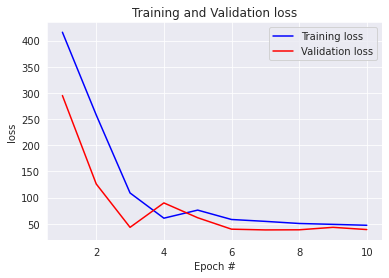

2/2 [==============================] - 0s 11ms/step - loss: 41.3795 - root_mean_squared_error: 6.2470
Model: 23
2/2 [==============================] - 0s 12ms/step - loss: 31.3465 - root_mean_squared_error: 5.1865
MODEL EVALUATION:  [31.346519470214844, 5.186524868011475]


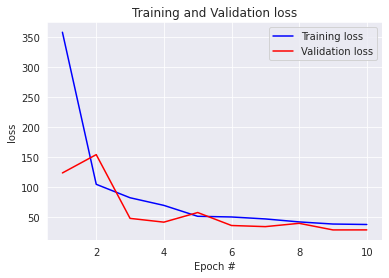

2/2 [==============================] - 0s 7ms/step - loss: 31.3465 - root_mean_squared_error: 5.1865
Model: 24
2/2 [==============================] - 0s 13ms/step - loss: 30.9638 - root_mean_squared_error: 5.0969
MODEL EVALUATION:  [30.96380615234375, 5.096876621246338]


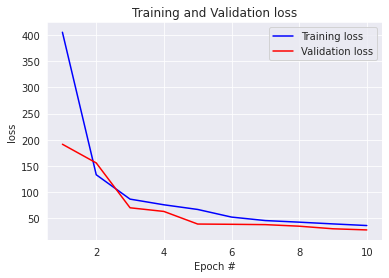

2/2 [==============================] - 0s 7ms/step - loss: 30.9638 - root_mean_squared_error: 5.0969
Model: 25
2/2 [==============================] - 0s 11ms/step - loss: 33.0286 - root_mean_squared_error: 5.2440
MODEL EVALUATION:  [33.0285530090332, 5.244019985198975]


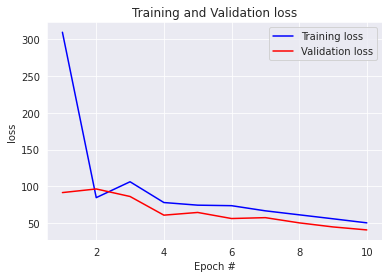

2/2 [==============================] - 0s 8ms/step - loss: 33.0286 - root_mean_squared_error: 5.2440
Model: 26
2/2 [==============================] - 0s 8ms/step - loss: 52.9669 - root_mean_squared_error: 6.5851
MODEL EVALUATION:  [52.96693801879883, 6.585123062133789]


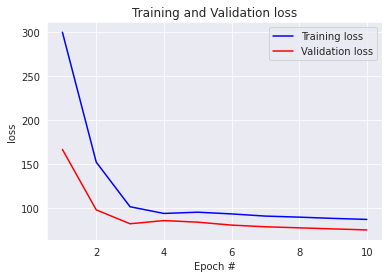

2/2 [==============================] - 0s 11ms/step - loss: 52.9669 - root_mean_squared_error: 6.5851
Model: 27
2/2 [==============================] - 0s 11ms/step - loss: 46.2069 - root_mean_squared_error: 6.4456
MODEL EVALUATION:  [46.20686340332031, 6.445555686950684]


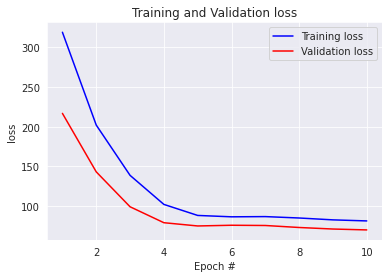

2/2 [==============================] - 0s 12ms/step - loss: 46.2069 - root_mean_squared_error: 6.4456
Model: 28
2/2 [==============================] - 0s 6ms/step - loss: 30.3173 - root_mean_squared_error: 5.2526
MODEL EVALUATION:  [30.317306518554688, 5.252628803253174]


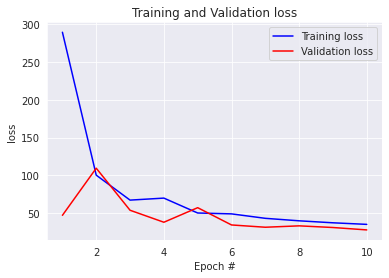

2/2 [==============================] - 0s 6ms/step - loss: 30.3173 - root_mean_squared_error: 5.2526
Model: 29
2/2 [==============================] - 0s 12ms/step - loss: 17.5245 - root_mean_squared_error: 3.4909
MODEL EVALUATION:  [17.5245361328125, 3.4908523559570312]


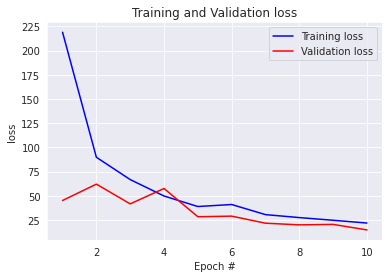

2/2 [==============================] - 0s 11ms/step - loss: 17.5245 - root_mean_squared_error: 3.4909
Model: 30
2/2 [==============================] - 0s 14ms/step - loss: 16.9219 - root_mean_squared_error: 3.3186
MODEL EVALUATION:  [16.92193031311035, 3.3185884952545166]


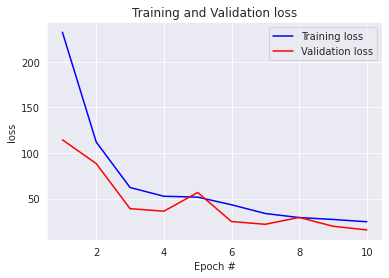

2/2 [==============================] - 0s 7ms/step - loss: 16.9219 - root_mean_squared_error: 3.3186
Model: 31
2/2 [==============================] - 0s 7ms/step - loss: 163.8903 - root_mean_squared_error: 12.7241
MODEL EVALUATION:  [163.8902587890625, 12.724069595336914]


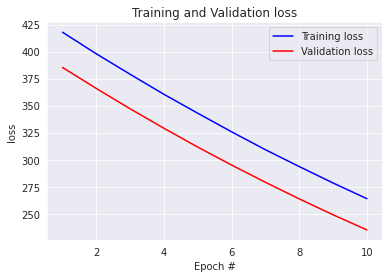

2/2 [==============================] - 0s 8ms/step - loss: 163.8903 - root_mean_squared_error: 12.7241
Model: 32
2/2 [==============================] - 0s 8ms/step - loss: 189.9071 - root_mean_squared_error: 13.4313
MODEL EVALUATION:  [189.90708923339844, 13.431315422058105]


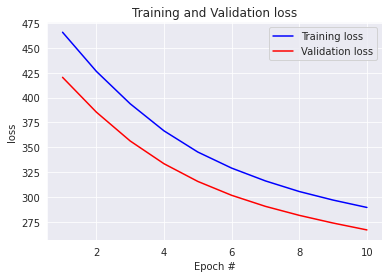

2/2 [==============================] - 0s 12ms/step - loss: 189.9071 - root_mean_squared_error: 13.4313
Model: 33
2/2 [==============================] - 0s 9ms/step - loss: 210.0787 - root_mean_squared_error: 14.0982
MODEL EVALUATION:  [210.0786895751953, 14.098234176635742]


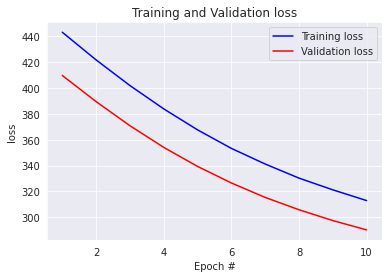

2/2 [==============================] - 0s 11ms/step - loss: 210.0787 - root_mean_squared_error: 14.0982
Model: 34
2/2 [==============================] - 0s 9ms/step - loss: 195.4419 - root_mean_squared_error: 13.9196
MODEL EVALUATION:  [195.4419403076172, 13.919562339782715]


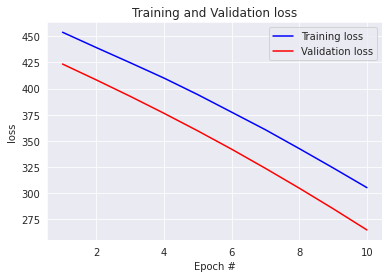

2/2 [==============================] - 0s 7ms/step - loss: 195.4419 - root_mean_squared_error: 13.9196
Model: 35
2/2 [==============================] - 0s 15ms/step - loss: 41.3658 - root_mean_squared_error: 5.8469
MODEL EVALUATION:  [41.365840911865234, 5.846924304962158]


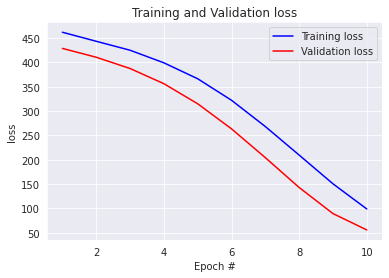

2/2 [==============================] - 0s 12ms/step - loss: 41.3658 - root_mean_squared_error: 5.8469
Model: 36
2/2 [==============================] - 0s 8ms/step - loss: 82.8044 - root_mean_squared_error: 8.5746
MODEL EVALUATION:  [82.80438995361328, 8.574557304382324]


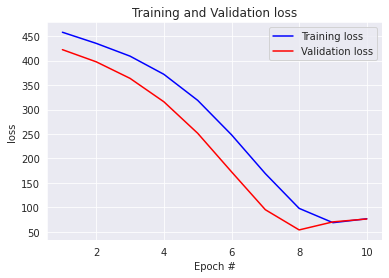

2/2 [==============================] - 0s 8ms/step - loss: 82.8044 - root_mean_squared_error: 8.5746
Model: 37
2/2 [==============================] - 0s 14ms/step - loss: 287.7307 - root_mean_squared_error: 16.9080
MODEL EVALUATION:  [287.7306823730469, 16.907970428466797]


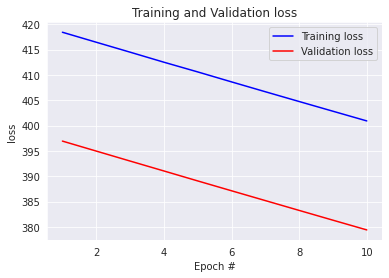

2/2 [==============================] - 0s 6ms/step - loss: 287.7307 - root_mean_squared_error: 16.9080
Model: 38
2/2 [==============================] - 0s 7ms/step - loss: 325.3180 - root_mean_squared_error: 17.7840
MODEL EVALUATION:  [325.3179931640625, 17.784013748168945]


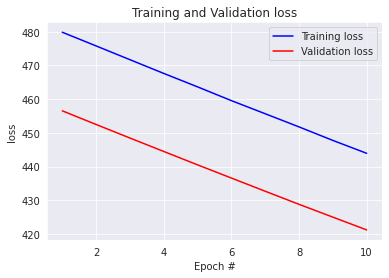

2/2 [==============================] - 0s 10ms/step - loss: 325.3180 - root_mean_squared_error: 17.7840
Model: 39
2/2 [==============================] - 0s 9ms/step - loss: 266.1382 - root_mean_squared_error: 15.9527
MODEL EVALUATION:  [266.13824462890625, 15.95270824432373]


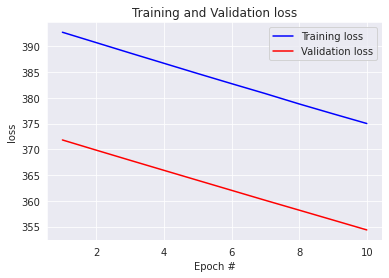

2/2 [==============================] - 0s 10ms/step - loss: 266.1382 - root_mean_squared_error: 15.9527
Model: 40
2/2 [==============================] - 0s 8ms/step - loss: 328.5760 - root_mean_squared_error: 18.0767
MODEL EVALUATION:  [328.5760192871094, 18.076717376708984]


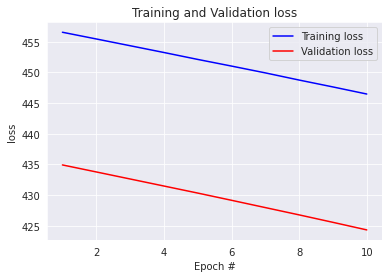

2/2 [==============================] - 0s 8ms/step - loss: 328.5760 - root_mean_squared_error: 18.0767
Model: 41
2/2 [==============================] - 0s 14ms/step - loss: 331.8196 - root_mean_squared_error: 17.9752
MODEL EVALUATION:  [331.819580078125, 17.975181579589844]


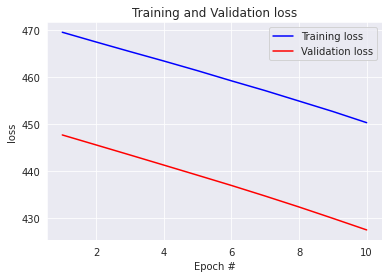

2/2 [==============================] - 0s 10ms/step - loss: 331.8196 - root_mean_squared_error: 17.9752
Model: 42
2/2 [==============================] - 0s 13ms/step - loss: 336.5004 - root_mean_squared_error: 18.0336
MODEL EVALUATION:  [336.5003967285156, 18.03359031677246]


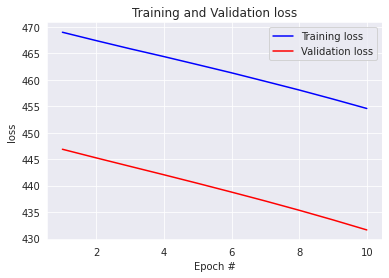

2/2 [==============================] - 0s 14ms/step - loss: 336.5004 - root_mean_squared_error: 18.0336
Model: 43
2/2 [==============================] - 0s 16ms/step - loss: 356.5025 - root_mean_squared_error: 18.8326
MODEL EVALUATION:  [356.5024719238281, 18.83258056640625]


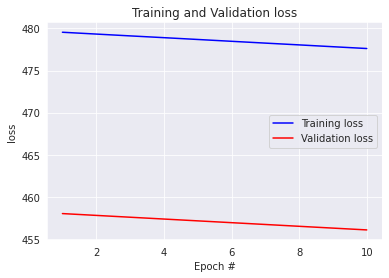

2/2 [==============================] - 0s 7ms/step - loss: 356.5025 - root_mean_squared_error: 18.8326
Model: 44
2/2 [==============================] - 0s 15ms/step - loss: 322.2220 - root_mean_squared_error: 17.6933
MODEL EVALUATION:  [322.2220458984375, 17.693347930908203]


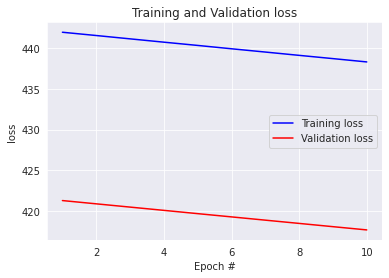

2/2 [==============================] - 0s 10ms/step - loss: 322.2220 - root_mean_squared_error: 17.6933
Model: 45
2/2 [==============================] - 0s 10ms/step - loss: 346.3209 - root_mean_squared_error: 18.2942
MODEL EVALUATION:  [346.3208923339844, 18.294233322143555]


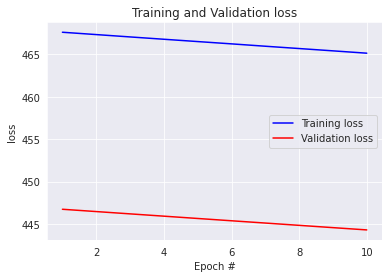

2/2 [==============================] - 0s 15ms/step - loss: 346.3209 - root_mean_squared_error: 18.2942
Model: 46
2/2 [==============================] - 0s 15ms/step - loss: 340.3847 - root_mean_squared_error: 18.3994
MODEL EVALUATION:  [340.3846740722656, 18.39936637878418]


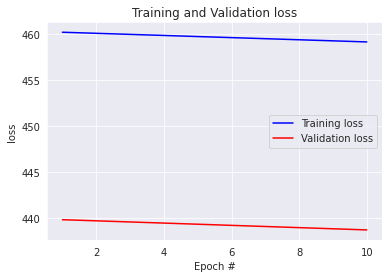

2/2 [==============================] - 0s 10ms/step - loss: 340.3847 - root_mean_squared_error: 18.3994
Model: 47
2/2 [==============================] - 0s 8ms/step - loss: 360.2806 - root_mean_squared_error: 18.7396
MODEL EVALUATION:  [360.2806396484375, 18.739612579345703]


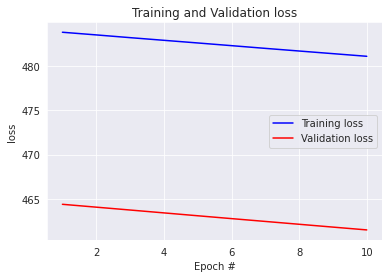

2/2 [==============================] - 0s 8ms/step - loss: 360.2806 - root_mean_squared_error: 18.7396
Model: 48
2/2 [==============================] - 0s 14ms/step - loss: 342.8800 - root_mean_squared_error: 18.2012
MODEL EVALUATION:  [342.8799743652344, 18.201213836669922]


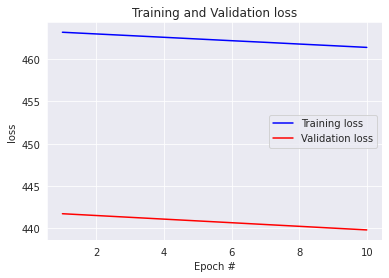

2/2 [==============================] - 0s 9ms/step - loss: 342.8800 - root_mean_squared_error: 18.2012
Model: 49
2/2 [==============================] - 0s 9ms/step - loss: 31.6608 - root_mean_squared_error: 3.3249
MODEL EVALUATION:  [31.660799026489258, 3.324901580810547]


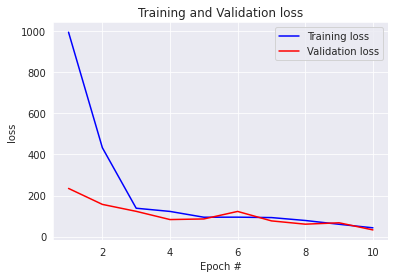

2/2 [==============================] - 0s 7ms/step - loss: 31.6608 - root_mean_squared_error: 3.3249
Model: 50
2/2 [==============================] - 0s 16ms/step - loss: 519.2333 - root_mean_squared_error: 8.8009
MODEL EVALUATION:  [519.2332763671875, 8.8009033203125]


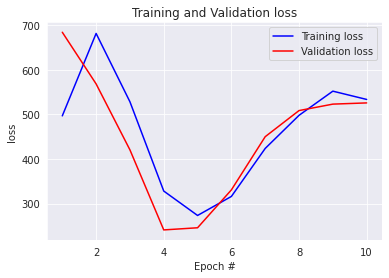

2/2 [==============================] - 0s 13ms/step - loss: 519.2333 - root_mean_squared_error: 8.8009
Model: 51
2/2 [==============================] - 0s 7ms/step - loss: 113.1177 - root_mean_squared_error: 6.2181
MODEL EVALUATION:  [113.11767578125, 6.218090534210205]


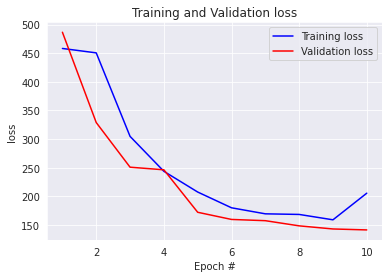

2/2 [==============================] - 0s 6ms/step - loss: 113.1177 - root_mean_squared_error: 6.2181
Model: 52
2/2 [==============================] - 0s 20ms/step - loss: 248.3702 - root_mean_squared_error: 4.6522
MODEL EVALUATION:  [248.3701629638672, 4.652224063873291]


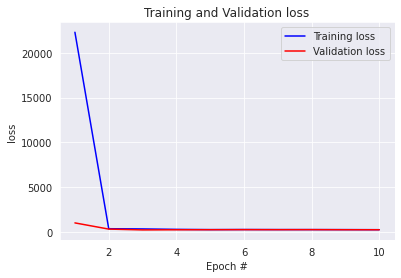

2/2 [==============================] - 0s 4ms/step - loss: 248.3702 - root_mean_squared_error: 4.6522
Model: 53
2/2 [==============================] - 0s 10ms/step - loss: 1602.9763 - root_mean_squared_error: 19.9486
MODEL EVALUATION:  [1602.976318359375, 19.94858169555664]


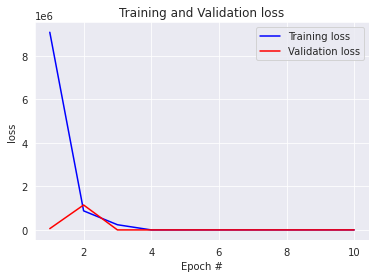

2/2 [==============================] - 0s 8ms/step - loss: 1602.9763 - root_mean_squared_error: 19.9486
Model: 54
2/2 [==============================] - 0s 13ms/step - loss: 1883.4918 - root_mean_squared_error: 21.5223
MODEL EVALUATION:  [1883.4918212890625, 21.522300720214844]


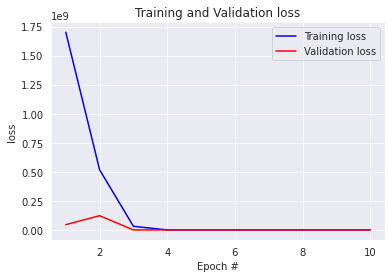

2/2 [==============================] - 0s 6ms/step - loss: 1883.4918 - root_mean_squared_error: 21.5223
Model: 55
2/2 [==============================] - 0s 19ms/step - loss: 10.1055 - root_mean_squared_error: 1.9233
MODEL EVALUATION:  [10.105515480041504, 1.923346996307373]


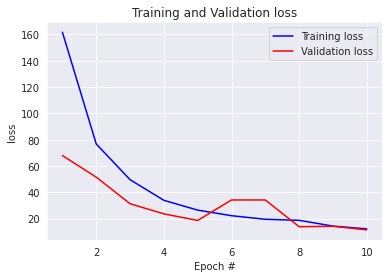

2/2 [==============================] - 0s 9ms/step - loss: 10.1055 - root_mean_squared_error: 1.9233
Model: 56
2/2 [==============================] - 0s 13ms/step - loss: 60.7183 - root_mean_squared_error: 6.8075
MODEL EVALUATION:  [60.718292236328125, 6.807483196258545]


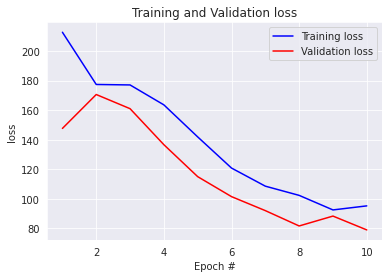

2/2 [==============================] - 0s 14ms/step - loss: 60.7183 - root_mean_squared_error: 6.8075
Model: 57
2/2 [==============================] - 0s 6ms/step - loss: 45.4312 - root_mean_squared_error: 6.4122
MODEL EVALUATION:  [45.43120193481445, 6.412176609039307]


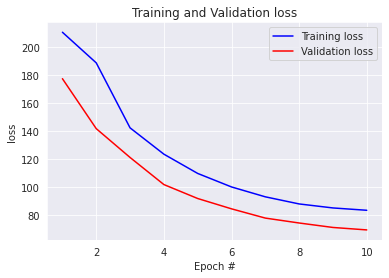

2/2 [==============================] - 0s 6ms/step - loss: 45.4312 - root_mean_squared_error: 6.4122
Model: 58
2/2 [==============================] - 0s 15ms/step - loss: 17.6729 - root_mean_squared_error: 3.0769
MODEL EVALUATION:  [17.672931671142578, 3.0769119262695312]


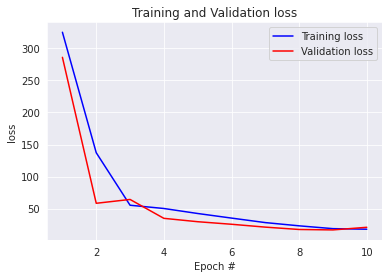

2/2 [==============================] - 0s 16ms/step - loss: 17.6729 - root_mean_squared_error: 3.0769
Model: 59
2/2 [==============================] - 0s 12ms/step - loss: 129.1136 - root_mean_squared_error: 5.6280
MODEL EVALUATION:  [129.11358642578125, 5.627981185913086]


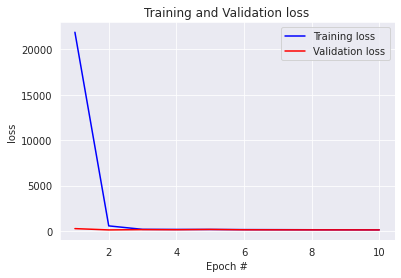

2/2 [==============================] - 0s 5ms/step - loss: 129.1136 - root_mean_squared_error: 5.6280
Model: 60
2/2 [==============================] - 0s 15ms/step - loss: 182.2896 - root_mean_squared_error: 5.6642
MODEL EVALUATION:  [182.28955078125, 5.6641621589660645]


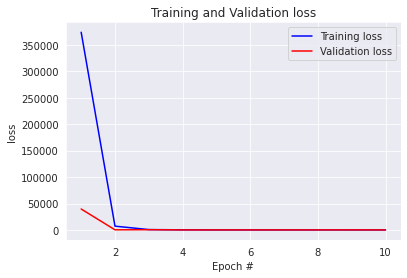

2/2 [==============================] - 0s 15ms/step - loss: 182.2896 - root_mean_squared_error: 5.6642
Model: 61
2/2 [==============================] - 0s 6ms/step - loss: 14.7320 - root_mean_squared_error: 2.9052
MODEL EVALUATION:  [14.731989860534668, 2.9052231311798096]


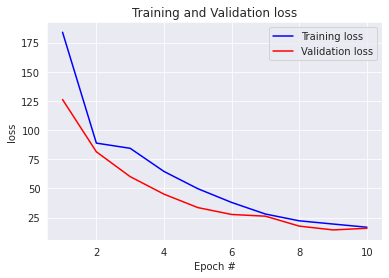

2/2 [==============================] - 0s 7ms/step - loss: 14.7320 - root_mean_squared_error: 2.9052
Model: 62
2/2 [==============================] - 0s 19ms/step - loss: 46.6687 - root_mean_squared_error: 6.4459
MODEL EVALUATION:  [46.66866683959961, 6.445916175842285]


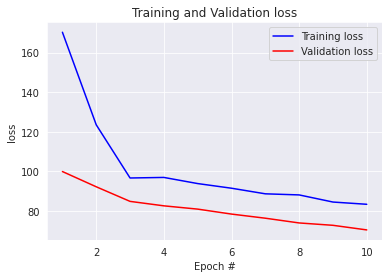

2/2 [==============================] - 0s 14ms/step - loss: 46.6687 - root_mean_squared_error: 6.4459
Model: 63
2/2 [==============================] - 0s 16ms/step - loss: 42.6409 - root_mean_squared_error: 6.2653
MODEL EVALUATION:  [42.64090347290039, 6.265345573425293]


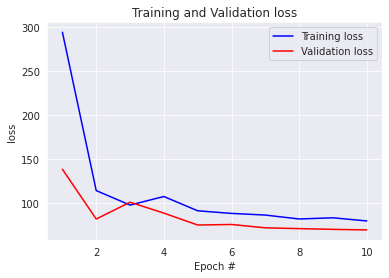

2/2 [==============================] - 0s 8ms/step - loss: 42.6409 - root_mean_squared_error: 6.2653
Model: 64
2/2 [==============================] - 0s 8ms/step - loss: 20.6991 - root_mean_squared_error: 4.2840
MODEL EVALUATION:  [20.6991024017334, 4.283968448638916]


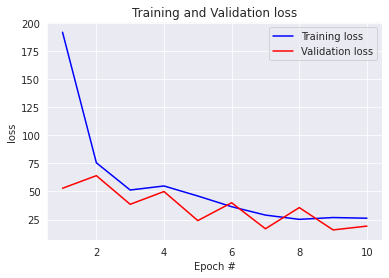

2/2 [==============================] - 0s 7ms/step - loss: 20.6991 - root_mean_squared_error: 4.2840
Model: 65
2/2 [==============================] - 0s 20ms/step - loss: 224.6821 - root_mean_squared_error: 14.7312
MODEL EVALUATION:  [224.6820831298828, 14.731159210205078]


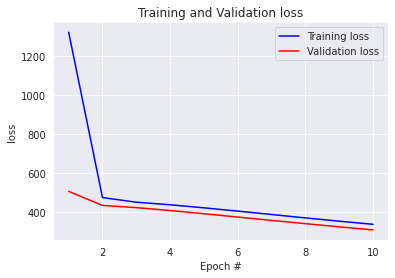

2/2 [==============================] - 0s 4ms/step - loss: 224.6821 - root_mean_squared_error: 14.7312
Model: 66
2/2 [==============================] - 0s 7ms/step - loss: 18.2529 - root_mean_squared_error: 3.0643
MODEL EVALUATION:  [18.252918243408203, 3.0642876625061035]


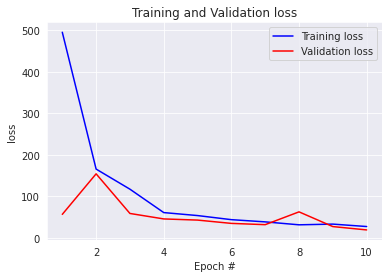

2/2 [==============================] - 0s 11ms/step - loss: 18.2529 - root_mean_squared_error: 3.0643
Model: 67
2/2 [==============================] - 0s 18ms/step - loss: 37.1413 - root_mean_squared_error: 6.0100
MODEL EVALUATION:  [37.141265869140625, 6.00996208190918]


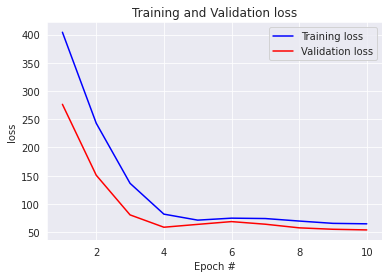

2/2 [==============================] - 0s 9ms/step - loss: 37.1413 - root_mean_squared_error: 6.0100
Model: 68
2/2 [==============================] - 0s 19ms/step - loss: 41.6634 - root_mean_squared_error: 6.2871
MODEL EVALUATION:  [41.66344451904297, 6.287066459655762]


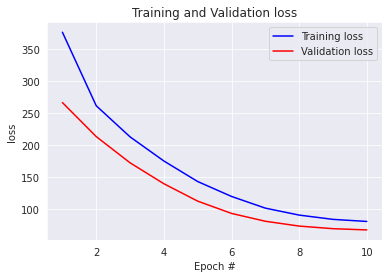

2/2 [==============================] - 0s 7ms/step - loss: 41.6634 - root_mean_squared_error: 6.2871
Model: 69
2/2 [==============================] - 0s 16ms/step - loss: 52.8892 - root_mean_squared_error: 7.1283
MODEL EVALUATION:  [52.88920974731445, 7.128259658813477]


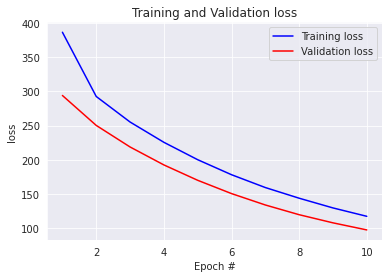

2/2 [==============================] - 0s 5ms/step - loss: 52.8892 - root_mean_squared_error: 7.1283
Model: 70
2/2 [==============================] - 0s 14ms/step - loss: 41.3262 - root_mean_squared_error: 6.3846
MODEL EVALUATION:  [41.32620620727539, 6.384583473205566]


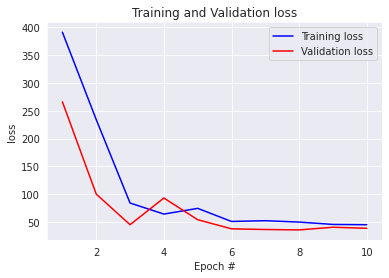

2/2 [==============================] - 0s 5ms/step - loss: 41.3262 - root_mean_squared_error: 6.3846
Model: 71
2/2 [==============================] - 0s 9ms/step - loss: 30.1007 - root_mean_squared_error: 5.3991
MODEL EVALUATION:  [30.10072135925293, 5.399082183837891]


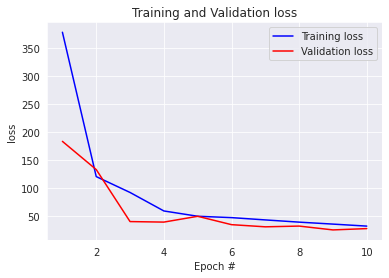

2/2 [==============================] - 0s 11ms/step - loss: 30.1007 - root_mean_squared_error: 5.3991
Model: 72
2/2 [==============================] - 0s 14ms/step - loss: 22.0873 - root_mean_squared_error: 4.6065
MODEL EVALUATION:  [22.087282180786133, 4.606476783752441]


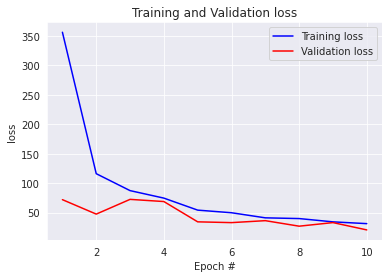

2/2 [==============================] - 0s 9ms/step - loss: 22.0873 - root_mean_squared_error: 4.6065
Model: 73
2/2 [==============================] - 0s 6ms/step - loss: 29.3730 - root_mean_squared_error: 5.1796
MODEL EVALUATION:  [29.373022079467773, 5.179574012756348]


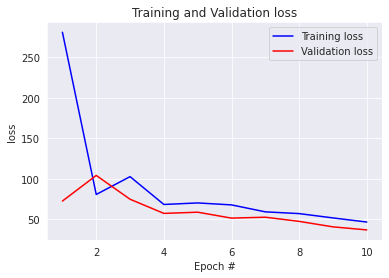

2/2 [==============================] - 0s 9ms/step - loss: 29.3730 - root_mean_squared_error: 5.1796
Model: 74
2/2 [==============================] - 0s 13ms/step - loss: 46.6337 - root_mean_squared_error: 6.5986
MODEL EVALUATION:  [46.6336784362793, 6.598612308502197]


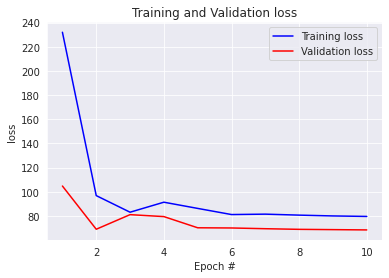

2/2 [==============================] - 0s 8ms/step - loss: 46.6337 - root_mean_squared_error: 6.5986
Model: 75
2/2 [==============================] - 0s 12ms/step - loss: 46.7795 - root_mean_squared_error: 6.6888
MODEL EVALUATION:  [46.7795295715332, 6.688751697540283]


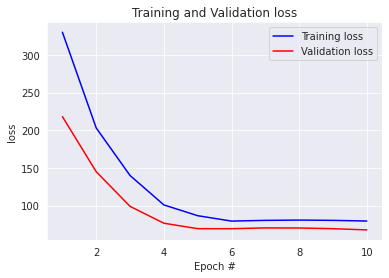

2/2 [==============================] - 0s 13ms/step - loss: 46.7795 - root_mean_squared_error: 6.6888
Model: 76
2/2 [==============================] - 0s 10ms/step - loss: 23.7547 - root_mean_squared_error: 4.7760
MODEL EVALUATION:  [23.754671096801758, 4.775973796844482]


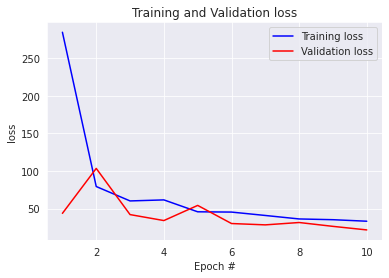

2/2 [==============================] - 0s 7ms/step - loss: 23.7547 - root_mean_squared_error: 4.7760
Model: 77
2/2 [==============================] - 0s 9ms/step - loss: 23.8058 - root_mean_squared_error: 4.7249
MODEL EVALUATION:  [23.8057918548584, 4.724873065948486]


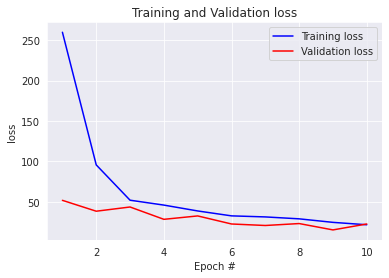

2/2 [==============================] - 0s 7ms/step - loss: 23.8058 - root_mean_squared_error: 4.7249
Model: 78
2/2 [==============================] - 0s 11ms/step - loss: 13.1790 - root_mean_squared_error: 3.4520
MODEL EVALUATION:  [13.178997993469238, 3.4519715309143066]


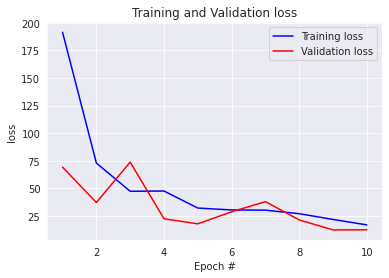

2/2 [==============================] - 0s 13ms/step - loss: 13.1790 - root_mean_squared_error: 3.4520
Model: 79
2/2 [==============================] - 0s 16ms/step - loss: 190.3674 - root_mean_squared_error: 13.7864
MODEL EVALUATION:  [190.367431640625, 13.78640365600586]


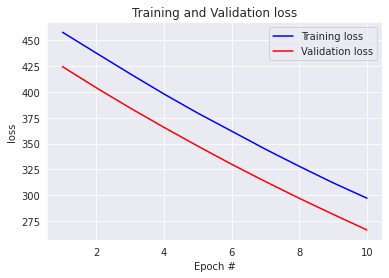

2/2 [==============================] - 0s 12ms/step - loss: 190.3674 - root_mean_squared_error: 13.7864
Model: 80
2/2 [==============================] - 0s 18ms/step - loss: 113.9053 - root_mean_squared_error: 10.6124
MODEL EVALUATION:  [113.9052505493164, 10.612359046936035]


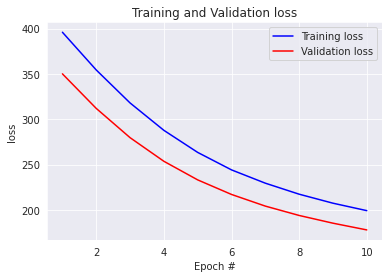

2/2 [==============================] - 0s 10ms/step - loss: 113.9053 - root_mean_squared_error: 10.6124
Model: 81
2/2 [==============================] - 0s 10ms/step - loss: 208.0094 - root_mean_squared_error: 14.3636
MODEL EVALUATION:  [208.00938415527344, 14.36363697052002]


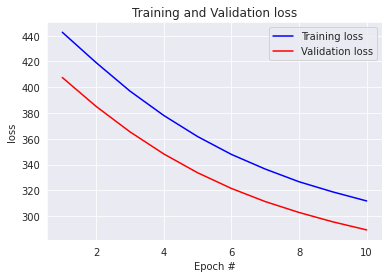

2/2 [==============================] - 0s 12ms/step - loss: 208.0094 - root_mean_squared_error: 14.3636
Model: 82
2/2 [==============================] - 0s 8ms/step - loss: 209.3759 - root_mean_squared_error: 14.4609
MODEL EVALUATION:  [209.3759307861328, 14.460921287536621]


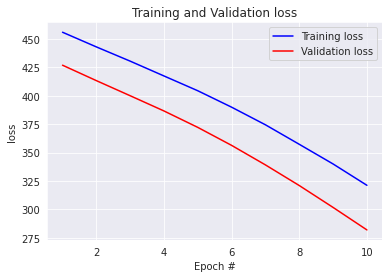

2/2 [==============================] - 0s 13ms/step - loss: 209.3759 - root_mean_squared_error: 14.4609
Model: 83
2/2 [==============================] - 0s 6ms/step - loss: 35.5315 - root_mean_squared_error: 5.8792
MODEL EVALUATION:  [35.531494140625, 5.879228591918945]


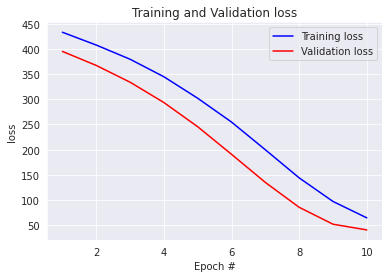

2/2 [==============================] - 0s 18ms/step - loss: 35.5315 - root_mean_squared_error: 5.8792
Model: 84
2/2 [==============================] - 0s 10ms/step - loss: 73.7640 - root_mean_squared_error: 8.5129
MODEL EVALUATION:  [73.76396179199219, 8.512900352478027]


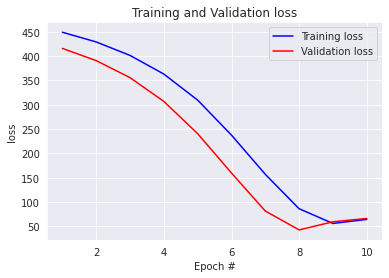

2/2 [==============================] - 0s 11ms/step - loss: 73.7640 - root_mean_squared_error: 8.5129
Model: 85
2/2 [==============================] - 0s 8ms/step - loss: 275.7085 - root_mean_squared_error: 16.5967
MODEL EVALUATION:  [275.7085266113281, 16.596725463867188]


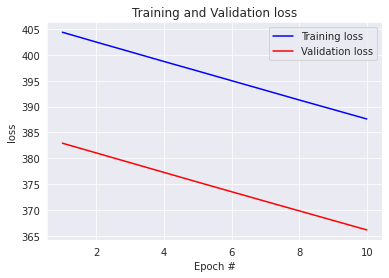

2/2 [==============================] - 0s 9ms/step - loss: 275.7085 - root_mean_squared_error: 16.5967
Model: 86
2/2 [==============================] - 0s 8ms/step - loss: 328.5116 - root_mean_squared_error: 18.0945
MODEL EVALUATION:  [328.5116271972656, 18.09453582763672]


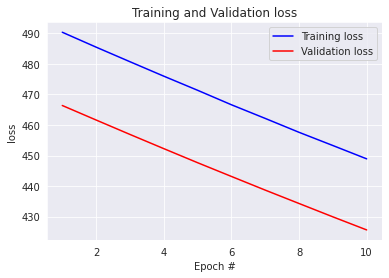

2/2 [==============================] - 0s 7ms/step - loss: 328.5116 - root_mean_squared_error: 18.0945
Model: 87
2/2 [==============================] - 0s 8ms/step - loss: 332.8412 - root_mean_squared_error: 18.2017
MODEL EVALUATION:  [332.8412170410156, 18.201740264892578]


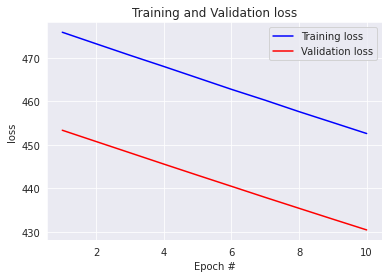

2/2 [==============================] - 0s 8ms/step - loss: 332.8412 - root_mean_squared_error: 18.2017
Model: 88
2/2 [==============================] - 0s 16ms/step - loss: 329.4353 - root_mean_squared_error: 18.1437
MODEL EVALUATION:  [329.435302734375, 18.143678665161133]


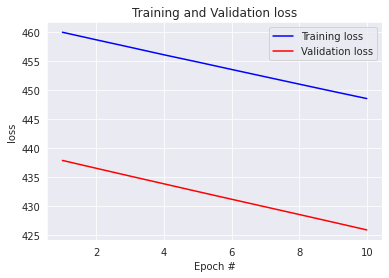

2/2 [==============================] - 0s 6ms/step - loss: 329.4353 - root_mean_squared_error: 18.1437
Model: 89
2/2 [==============================] - 0s 8ms/step - loss: 317.8488 - root_mean_squared_error: 17.7986
MODEL EVALUATION:  [317.84881591796875, 17.798616409301758]


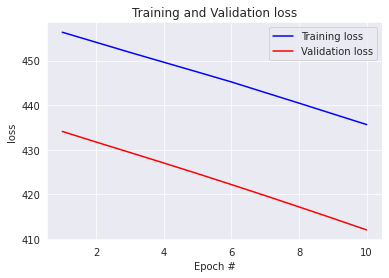

2/2 [==============================] - 0s 6ms/step - loss: 317.8488 - root_mean_squared_error: 17.7986
Model: 90
2/2 [==============================] - 0s 10ms/step - loss: 315.4739 - root_mean_squared_error: 17.7206
MODEL EVALUATION:  [315.47393798828125, 17.72063446044922]


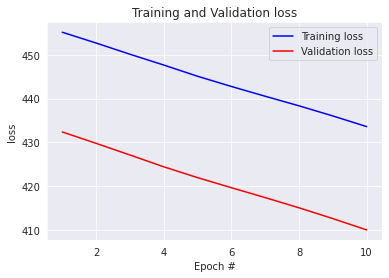

2/2 [==============================] - 0s 9ms/step - loss: 315.4739 - root_mean_squared_error: 17.7206
Model: 91
2/2 [==============================] - 0s 6ms/step - loss: 289.6249 - root_mean_squared_error: 17.0111
MODEL EVALUATION:  [289.6249084472656, 17.01109504699707]


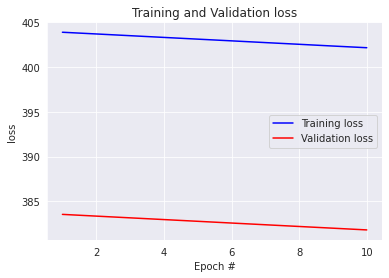

2/2 [==============================] - 0s 14ms/step - loss: 289.6249 - root_mean_squared_error: 17.0111
Model: 92
2/2 [==============================] - 0s 8ms/step - loss: 350.6309 - root_mean_squared_error: 18.6953
MODEL EVALUATION:  [350.630859375, 18.695287704467773]


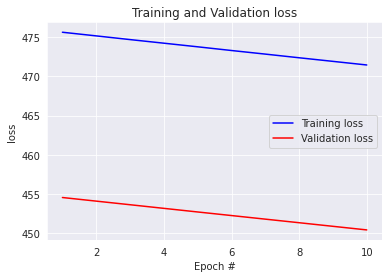

2/2 [==============================] - 0s 5ms/step - loss: 350.6309 - root_mean_squared_error: 18.6953
Model: 93
2/2 [==============================] - 0s 19ms/step - loss: 326.7717 - root_mean_squared_error: 18.0345
MODEL EVALUATION:  [326.771728515625, 18.03447151184082]


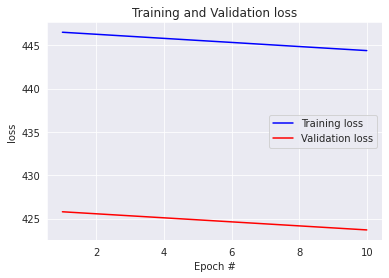

2/2 [==============================] - 0s 17ms/step - loss: 326.7717 - root_mean_squared_error: 18.0345
Model: 94
2/2 [==============================] - 0s 17ms/step - loss: 329.6212 - root_mean_squared_error: 18.1487
MODEL EVALUATION:  [329.6211853027344, 18.14874839782715]


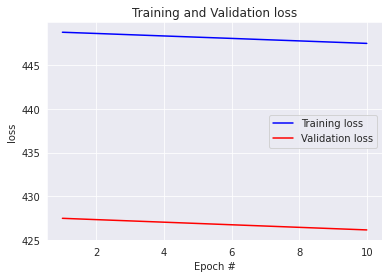

2/2 [==============================] - 0s 4ms/step - loss: 329.6212 - root_mean_squared_error: 18.1487
Model: 95
2/2 [==============================] - 0s 8ms/step - loss: 334.4419 - root_mean_squared_error: 18.2580
MODEL EVALUATION:  [334.4418640136719, 18.258028030395508]


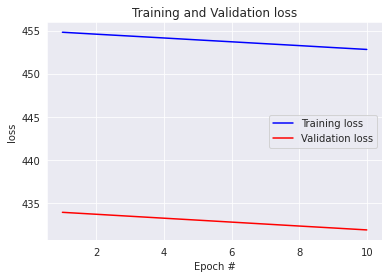

2/2 [==============================] - 0s 10ms/step - loss: 334.4419 - root_mean_squared_error: 18.2580
Model: 96
2/2 [==============================] - 0s 8ms/step - loss: 339.9611 - root_mean_squared_error: 18.3971
MODEL EVALUATION:  [339.96112060546875, 18.397106170654297]


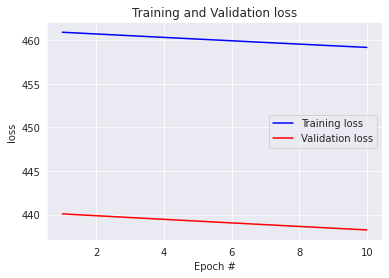

2/2 [==============================] - 0s 18ms/step - loss: 339.9611 - root_mean_squared_error: 18.3971
Model: 97
2/2 [==============================] - 0s 19ms/step - loss: 34.3512 - root_mean_squared_error: 5.8610
MODEL EVALUATION:  [34.3511848449707, 5.860988616943359]


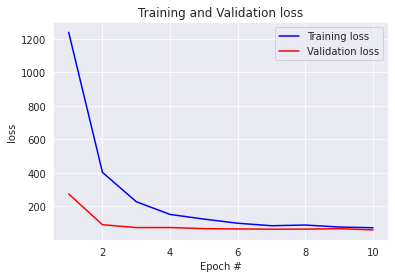

2/2 [==============================] - 0s 7ms/step - loss: 34.3512 - root_mean_squared_error: 5.8610
Model: 98
2/2 [==============================] - 0s 15ms/step - loss: 39.6377 - root_mean_squared_error: 6.2958
MODEL EVALUATION:  [39.63770294189453, 6.2958478927612305]


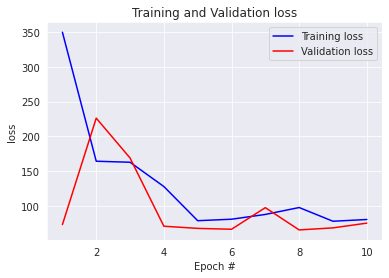

2/2 [==============================] - 0s 18ms/step - loss: 39.6377 - root_mean_squared_error: 6.2958
Model: 99
2/2 [==============================] - 0s 9ms/step - loss: 70.0427 - root_mean_squared_error: 8.3691
MODEL EVALUATION:  [70.04266357421875, 8.369149208068848]


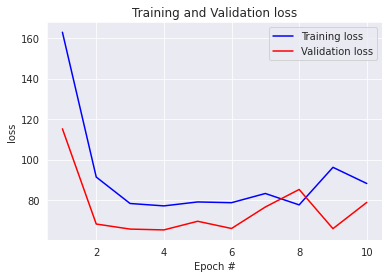

2/2 [==============================] - 0s 13ms/step - loss: 70.0427 - root_mean_squared_error: 8.3691
Model: 100
2/2 [==============================] - 0s 9ms/step - loss: 11.3039 - root_mean_squared_error: 3.3621
MODEL EVALUATION:  [11.303881645202637, 3.362124443054199]


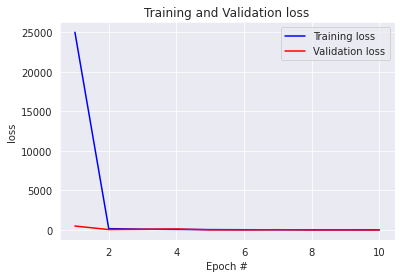

2/2 [==============================] - 0s 7ms/step - loss: 11.3039 - root_mean_squared_error: 3.3621
Model: 101
2/2 [==============================] - 0s 13ms/step - loss: 17.4897 - root_mean_squared_error: 4.1821
MODEL EVALUATION:  [17.489744186401367, 4.182074069976807]


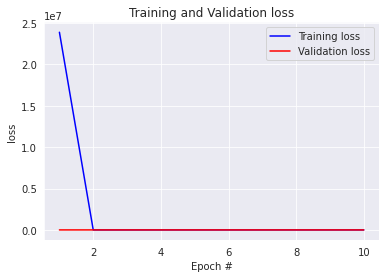

2/2 [==============================] - 0s 7ms/step - loss: 17.4897 - root_mean_squared_error: 4.1821
Model: 102
2/2 [==============================] - 0s 18ms/step - loss: 72.1310 - root_mean_squared_error: 8.4930
MODEL EVALUATION:  [72.13101196289062, 8.492997169494629]


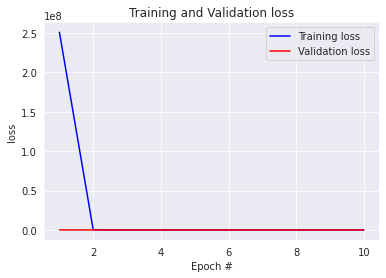

2/2 [==============================] - 0s 5ms/step - loss: 72.1310 - root_mean_squared_error: 8.4930
Model: 103
2/2 [==============================] - 0s 15ms/step - loss: 12.3816 - root_mean_squared_error: 3.5187
MODEL EVALUATION:  [12.38156795501709, 3.518745183944702]


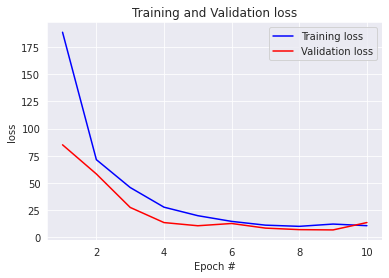

2/2 [==============================] - 0s 9ms/step - loss: 12.3816 - root_mean_squared_error: 3.5187
Model: 104
2/2 [==============================] - 0s 10ms/step - loss: 45.2086 - root_mean_squared_error: 6.7237
MODEL EVALUATION:  [45.2086067199707, 6.723734378814697]


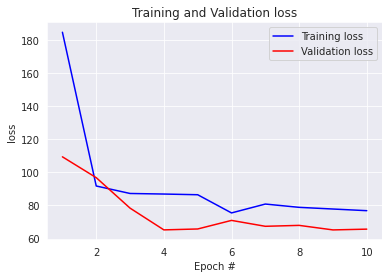

2/2 [==============================] - 0s 16ms/step - loss: 45.2086 - root_mean_squared_error: 6.7237
Model: 105
2/2 [==============================] - 0s 6ms/step - loss: 43.2334 - root_mean_squared_error: 6.5752
MODEL EVALUATION:  [43.2333984375, 6.575211048126221]


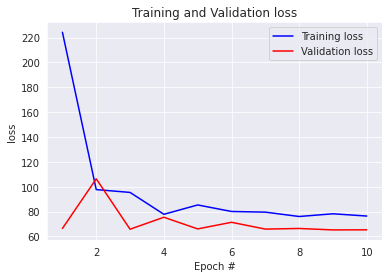

2/2 [==============================] - 0s 7ms/step - loss: 43.2334 - root_mean_squared_error: 6.5752
Model: 106
2/2 [==============================] - 0s 9ms/step - loss: 7.2387 - root_mean_squared_error: 2.6905
MODEL EVALUATION:  [7.238709926605225, 2.6904850006103516]


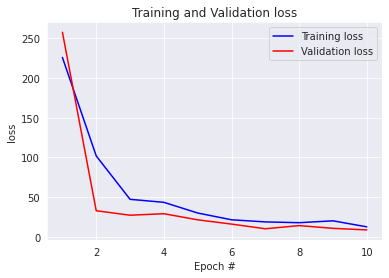

2/2 [==============================] - 0s 8ms/step - loss: 7.2387 - root_mean_squared_error: 2.6905
Model: 107
2/2 [==============================] - 0s 9ms/step - loss: 12.1153 - root_mean_squared_error: 3.4807
MODEL EVALUATION:  [12.115314483642578, 3.480705976486206]


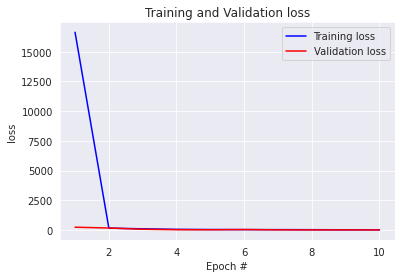

2/2 [==============================] - 0s 6ms/step - loss: 12.1153 - root_mean_squared_error: 3.4807
Model: 108
2/2 [==============================] - 0s 10ms/step - loss: 24.7205 - root_mean_squared_error: 4.9720
MODEL EVALUATION:  [24.720455169677734, 4.971966743469238]


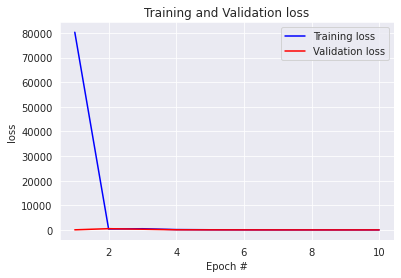

2/2 [==============================] - 0s 11ms/step - loss: 24.7205 - root_mean_squared_error: 4.9720
Model: 109
2/2 [==============================] - 0s 15ms/step - loss: 8.3401 - root_mean_squared_error: 2.8879
MODEL EVALUATION:  [8.340075492858887, 2.8879189491271973]


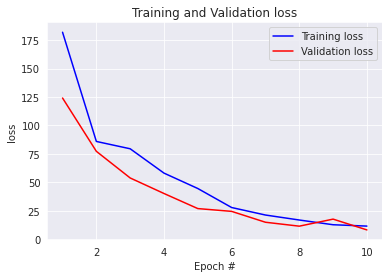

2/2 [==============================] - 0s 12ms/step - loss: 8.3401 - root_mean_squared_error: 2.8879
Model: 110
2/2 [==============================] - 0s 7ms/step - loss: 45.3668 - root_mean_squared_error: 6.7355
MODEL EVALUATION:  [45.36680603027344, 6.735488414764404]


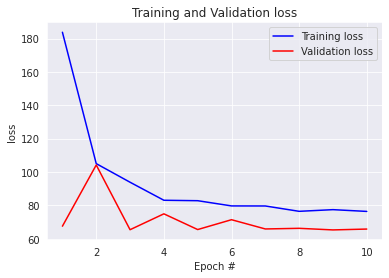

2/2 [==============================] - 0s 8ms/step - loss: 45.3668 - root_mean_squared_error: 6.7355
Model: 111
2/2 [==============================] - 0s 16ms/step - loss: 41.2044 - root_mean_squared_error: 6.4191
MODEL EVALUATION:  [41.20439147949219, 6.419064521789551]


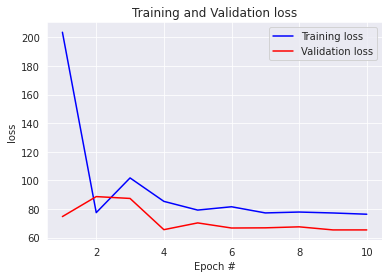

2/2 [==============================] - 0s 6ms/step - loss: 41.2044 - root_mean_squared_error: 6.4191
Model: 112
2/2 [==============================] - 0s 16ms/step - loss: 15.6646 - root_mean_squared_error: 3.9579
MODEL EVALUATION:  [15.664628028869629, 3.9578564167022705]


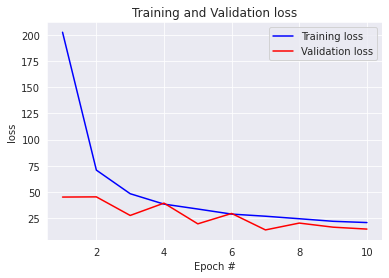

2/2 [==============================] - 0s 13ms/step - loss: 15.6646 - root_mean_squared_error: 3.9579
Model: 113
2/2 [==============================] - 0s 15ms/step - loss: 10.7049 - root_mean_squared_error: 3.2718
MODEL EVALUATION:  [10.70494556427002, 3.271841287612915]


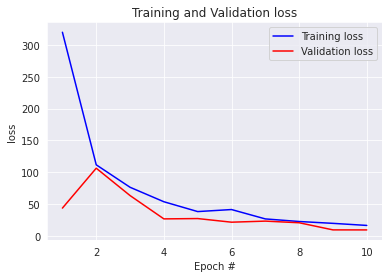

2/2 [==============================] - 0s 14ms/step - loss: 10.7049 - root_mean_squared_error: 3.2718
Model: 114
2/2 [==============================] - 0s 13ms/step - loss: 24.8781 - root_mean_squared_error: 4.9878
MODEL EVALUATION:  [24.878141403198242, 4.987799167633057]


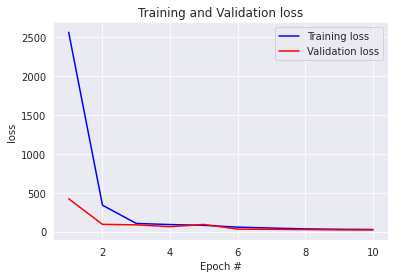

2/2 [==============================] - 0s 17ms/step - loss: 24.8781 - root_mean_squared_error: 4.9878
Model: 115
2/2 [==============================] - 0s 17ms/step - loss: 36.4540 - root_mean_squared_error: 6.0377
MODEL EVALUATION:  [36.45404815673828, 6.037718772888184]


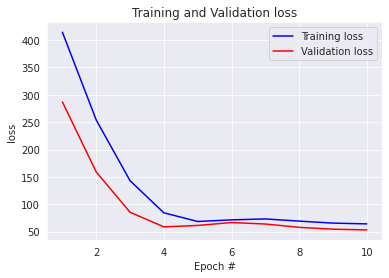

2/2 [==============================] - 0s 9ms/step - loss: 36.4540 - root_mean_squared_error: 6.0377
Model: 116
2/2 [==============================] - 0s 8ms/step - loss: 46.0203 - root_mean_squared_error: 6.7838
MODEL EVALUATION:  [46.02025604248047, 6.783823013305664]


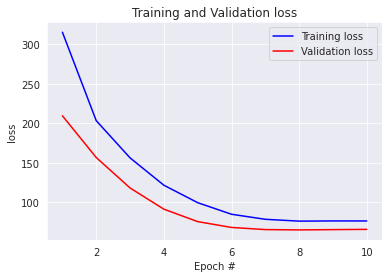

2/2 [==============================] - 0s 8ms/step - loss: 46.0203 - root_mean_squared_error: 6.7838
Model: 117
2/2 [==============================] - 0s 15ms/step - loss: 60.9294 - root_mean_squared_error: 7.8057
MODEL EVALUATION:  [60.929386138916016, 7.805727958679199]


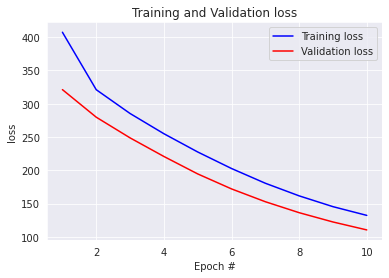

2/2 [==============================] - 0s 14ms/step - loss: 60.9294 - root_mean_squared_error: 7.8057
Model: 118
2/2 [==============================] - 0s 9ms/step - loss: 44.2713 - root_mean_squared_error: 6.6537
MODEL EVALUATION:  [44.2712516784668, 6.653664588928223]


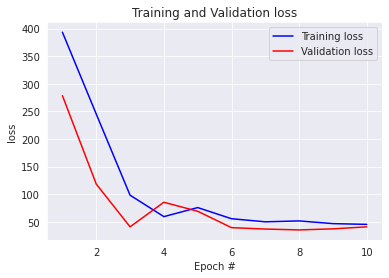

2/2 [==============================] - 0s 7ms/step - loss: 44.2713 - root_mean_squared_error: 6.6537
Model: 119
2/2 [==============================] - 0s 14ms/step - loss: 27.7974 - root_mean_squared_error: 5.2723
MODEL EVALUATION:  [27.7973690032959, 5.272320747375488]


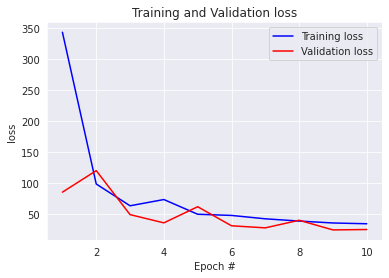

2/2 [==============================] - 0s 6ms/step - loss: 27.7974 - root_mean_squared_error: 5.2723
Model: 120
2/2 [==============================] - 0s 18ms/step - loss: 23.3521 - root_mean_squared_error: 4.8324
MODEL EVALUATION:  [23.35209846496582, 4.832400798797607]


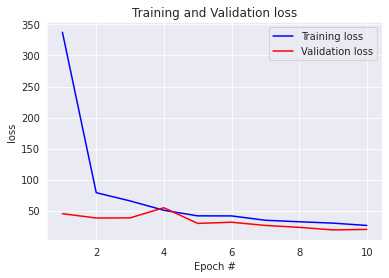

2/2 [==============================] - 0s 15ms/step - loss: 23.3521 - root_mean_squared_error: 4.8324
Model: 121
2/2 [==============================] - 0s 9ms/step - loss: 29.5100 - root_mean_squared_error: 5.4323
MODEL EVALUATION:  [29.509981155395508, 5.432309150695801]


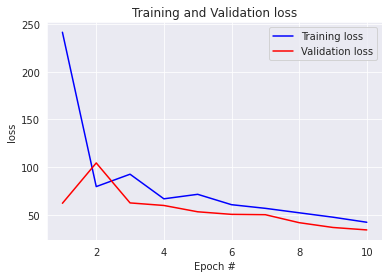

2/2 [==============================] - 0s 17ms/step - loss: 29.5100 - root_mean_squared_error: 5.4323
Model: 122
2/2 [==============================] - 0s 19ms/step - loss: 43.5460 - root_mean_squared_error: 6.5989
MODEL EVALUATION:  [43.54604721069336, 6.598942756652832]


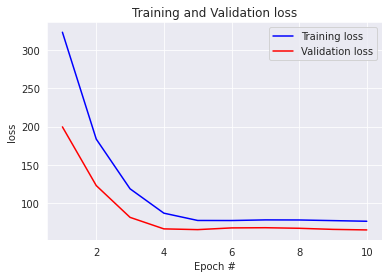

2/2 [==============================] - 0s 6ms/step - loss: 43.5460 - root_mean_squared_error: 6.5989
Model: 123
2/2 [==============================] - 0s 9ms/step - loss: 43.0411 - root_mean_squared_error: 6.5606
MODEL EVALUATION:  [43.041107177734375, 6.560572147369385]


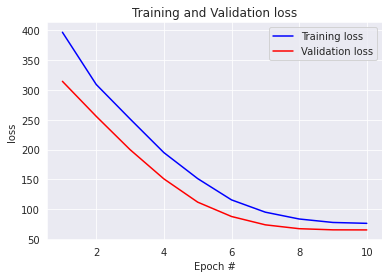

2/2 [==============================] - 0s 7ms/step - loss: 43.0411 - root_mean_squared_error: 6.5606
Model: 124
2/2 [==============================] - 0s 10ms/step - loss: 26.4194 - root_mean_squared_error: 5.1400
MODEL EVALUATION:  [26.419395446777344, 5.139979839324951]


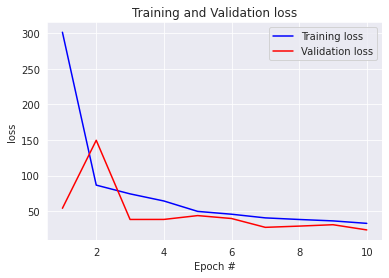

2/2 [==============================] - 0s 6ms/step - loss: 26.4194 - root_mean_squared_error: 5.1400
Model: 125
2/2 [==============================] - 0s 14ms/step - loss: 16.3591 - root_mean_squared_error: 4.0446
MODEL EVALUATION:  [16.359050750732422, 4.044632434844971]


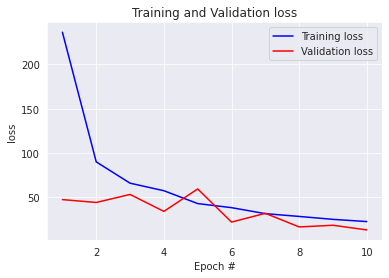

2/2 [==============================] - 0s 9ms/step - loss: 16.3591 - root_mean_squared_error: 4.0446
Model: 126
2/2 [==============================] - 0s 9ms/step - loss: 15.0718 - root_mean_squared_error: 3.8822
MODEL EVALUATION:  [15.071761131286621, 3.8822367191314697]


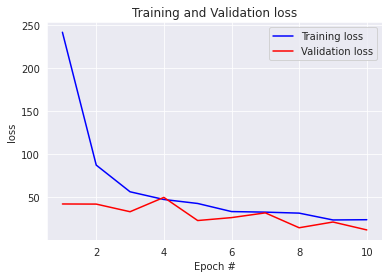

2/2 [==============================] - 0s 8ms/step - loss: 15.0718 - root_mean_squared_error: 3.8822
Model: 127
2/2 [==============================] - 0s 7ms/step - loss: 163.1257 - root_mean_squared_error: 12.7721
MODEL EVALUATION:  [163.1256866455078, 12.772067070007324]


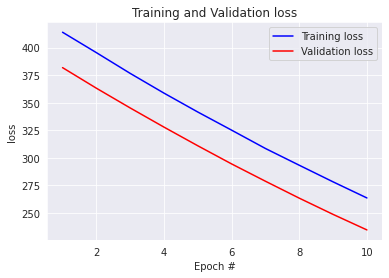

2/2 [==============================] - 0s 14ms/step - loss: 163.1257 - root_mean_squared_error: 12.7721
Model: 128
2/2 [==============================] - 0s 7ms/step - loss: 149.4440 - root_mean_squared_error: 12.2247
MODEL EVALUATION:  [149.44400024414062, 12.224729537963867]


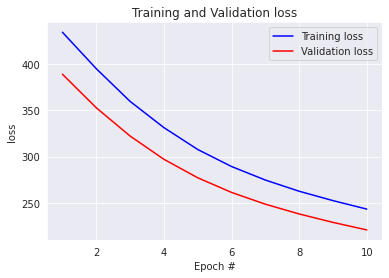

2/2 [==============================] - 0s 5ms/step - loss: 149.4440 - root_mean_squared_error: 12.2247
Model: 129
2/2 [==============================] - 0s 6ms/step - loss: 230.5336 - root_mean_squared_error: 15.1833
MODEL EVALUATION:  [230.5336151123047, 15.183333396911621]


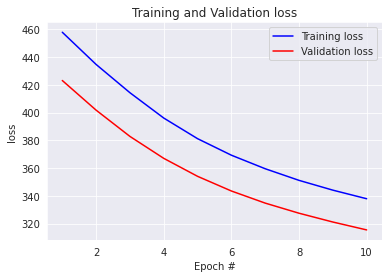

2/2 [==============================] - 0s 15ms/step - loss: 230.5336 - root_mean_squared_error: 15.1833
Model: 130
2/2 [==============================] - 0s 8ms/step - loss: 192.9987 - root_mean_squared_error: 13.8924
MODEL EVALUATION:  [192.99871826171875, 13.8923978805542]


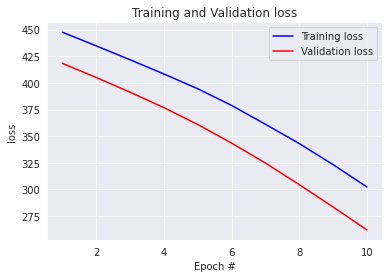

2/2 [==============================] - 0s 7ms/step - loss: 192.9987 - root_mean_squared_error: 13.8924
Model: 131
2/2 [==============================] - 0s 7ms/step - loss: 33.3807 - root_mean_squared_error: 5.7776
MODEL EVALUATION:  [33.38066482543945, 5.777600288391113]


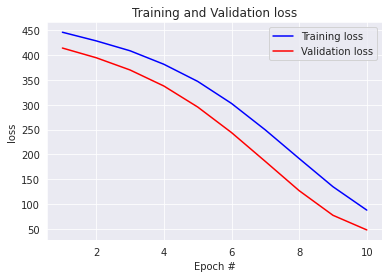

2/2 [==============================] - 0s 7ms/step - loss: 33.3807 - root_mean_squared_error: 5.7776
Model: 132
2/2 [==============================] - 0s 13ms/step - loss: 78.6167 - root_mean_squared_error: 8.8666
MODEL EVALUATION:  [78.6166763305664, 8.866604804992676]


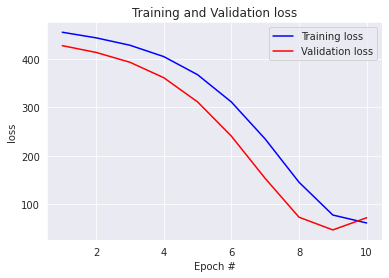

2/2 [==============================] - 0s 8ms/step - loss: 78.6167 - root_mean_squared_error: 8.8666
Model: 133
2/2 [==============================] - 0s 7ms/step - loss: 303.0468 - root_mean_squared_error: 17.4082
MODEL EVALUATION:  [303.0468444824219, 17.408241271972656]


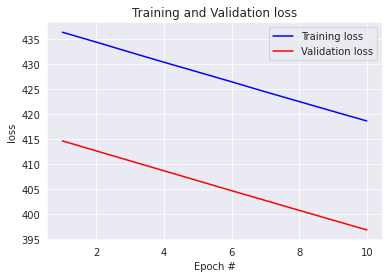

2/2 [==============================] - 0s 13ms/step - loss: 303.0468 - root_mean_squared_error: 17.4082
Model: 134
2/2 [==============================] - 0s 6ms/step - loss: 330.7715 - root_mean_squared_error: 18.1871
MODEL EVALUATION:  [330.77154541015625, 18.18712615966797]


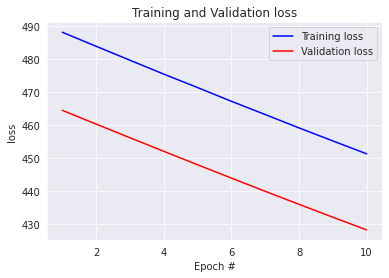

2/2 [==============================] - 0s 7ms/step - loss: 330.7715 - root_mean_squared_error: 18.1871
Model: 135
2/2 [==============================] - 0s 16ms/step - loss: 309.7369 - root_mean_squared_error: 17.5993
MODEL EVALUATION:  [309.7369079589844, 17.59934425354004]


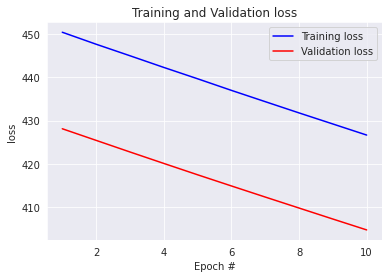

2/2 [==============================] - 0s 16ms/step - loss: 309.7369 - root_mean_squared_error: 17.5993
Model: 136
2/2 [==============================] - 0s 8ms/step - loss: 328.4913 - root_mean_squared_error: 18.1243
MODEL EVALUATION:  [328.4913024902344, 18.12432861328125]


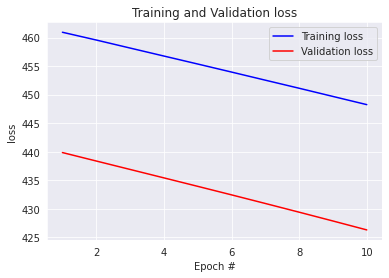

2/2 [==============================] - 0s 6ms/step - loss: 328.4913 - root_mean_squared_error: 18.1243
Model: 137
2/2 [==============================] - 0s 19ms/step - loss: 326.1963 - root_mean_squared_error: 18.0609
MODEL EVALUATION:  [326.1963195800781, 18.06090545654297]


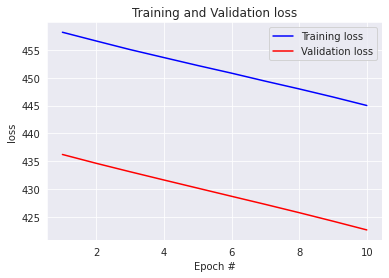

2/2 [==============================] - 0s 8ms/step - loss: 326.1963 - root_mean_squared_error: 18.0609
Model: 138
2/2 [==============================] - 0s 18ms/step - loss: 332.3007 - root_mean_squared_error: 18.2291
MODEL EVALUATION:  [332.30072021484375, 18.229116439819336]


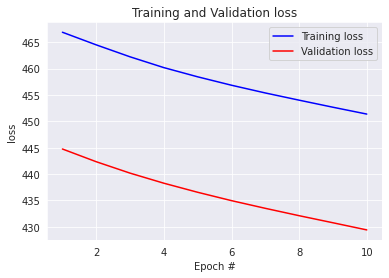

2/2 [==============================] - 0s 7ms/step - loss: 332.3007 - root_mean_squared_error: 18.2291
Model: 139
2/2 [==============================] - 0s 17ms/step - loss: 300.3629 - root_mean_squared_error: 17.3310
MODEL EVALUATION:  [300.36285400390625, 17.330978393554688]


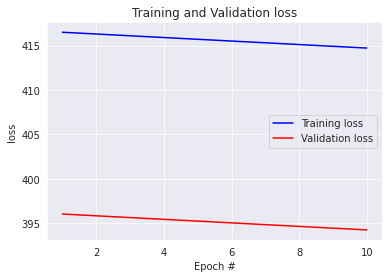

2/2 [==============================] - 0s 16ms/step - loss: 300.3629 - root_mean_squared_error: 17.3310
Model: 140
2/2 [==============================] - 0s 15ms/step - loss: 350.6445 - root_mean_squared_error: 18.7255
MODEL EVALUATION:  [350.6445007324219, 18.72550392150879]


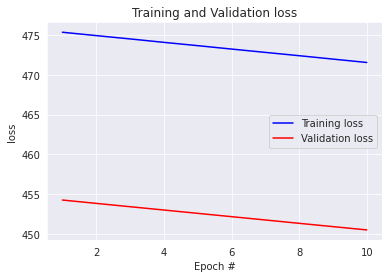

2/2 [==============================] - 0s 5ms/step - loss: 350.6445 - root_mean_squared_error: 18.7255
Model: 141
2/2 [==============================] - 0s 7ms/step - loss: 352.8169 - root_mean_squared_error: 18.7834
MODEL EVALUATION:  [352.8169250488281, 18.78342056274414]


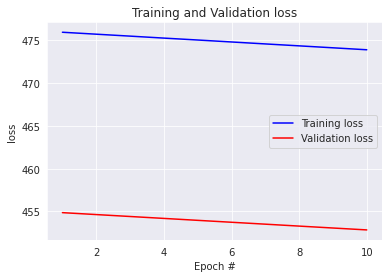

2/2 [==============================] - 0s 8ms/step - loss: 352.8169 - root_mean_squared_error: 18.7834
Model: 142
2/2 [==============================] - 0s 8ms/step - loss: 337.5137 - root_mean_squared_error: 18.3715
MODEL EVALUATION:  [337.51373291015625, 18.371545791625977]


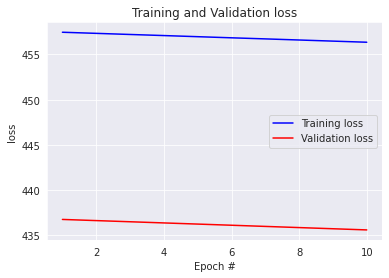

2/2 [==============================] - 0s 8ms/step - loss: 337.5137 - root_mean_squared_error: 18.3715
Model: 143
2/2 [==============================] - 0s 13ms/step - loss: 330.3721 - root_mean_squared_error: 18.1761
MODEL EVALUATION:  [330.37213134765625, 18.1761417388916]


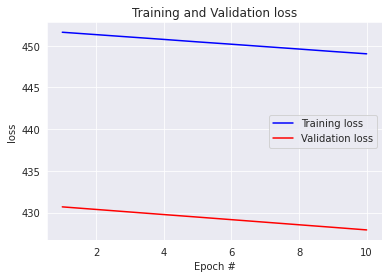

2/2 [==============================] - 0s 13ms/step - loss: 330.3721 - root_mean_squared_error: 18.1761
Model: 144
2/2 [==============================] - 0s 8ms/step - loss: 336.0771 - root_mean_squared_error: 18.3324
MODEL EVALUATION:  [336.0771179199219, 18.33240509033203]


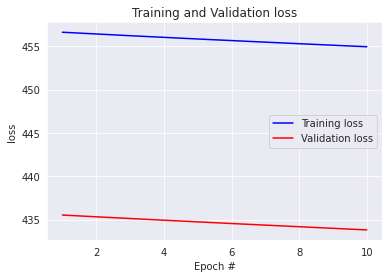

2/2 [==============================] - 0s 14ms/step - loss: 336.0771 - root_mean_squared_error: 18.3324
Model: 145
2/2 [==============================] - 0s 15ms/step - loss: 13.3905 - root_mean_squared_error: 2.7123
MODEL EVALUATION:  [13.390456199645996, 2.7122695446014404]


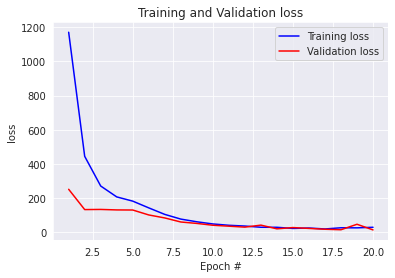

2/2 [==============================] - 0s 11ms/step - loss: 13.3905 - root_mean_squared_error: 2.7123
Model: 146
2/2 [==============================] - 0s 14ms/step - loss: 203.0367 - root_mean_squared_error: 6.2641
MODEL EVALUATION:  [203.03672790527344, 6.264071941375732]


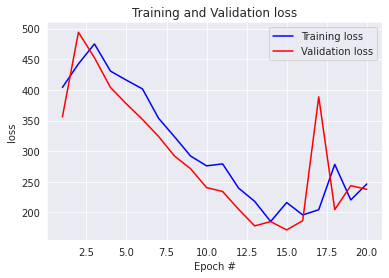

2/2 [==============================] - 0s 7ms/step - loss: 203.0367 - root_mean_squared_error: 6.2641
Model: 147
2/2 [==============================] - 0s 5ms/step - loss: 97.5887 - root_mean_squared_error: 6.1935
MODEL EVALUATION:  [97.58867645263672, 6.193546772003174]


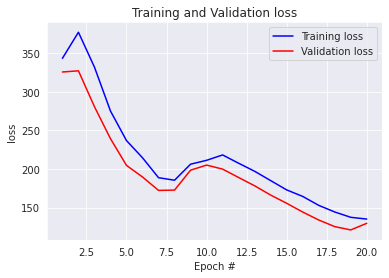

2/2 [==============================] - 0s 19ms/step - loss: 97.5887 - root_mean_squared_error: 6.1935
Model: 148
2/2 [==============================] - 0s 20ms/step - loss: 58.4691 - root_mean_squared_error: 2.0831
MODEL EVALUATION:  [58.46907043457031, 2.083104133605957]


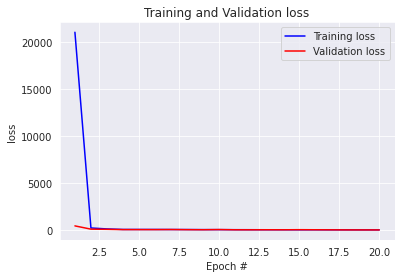

2/2 [==============================] - 0s 10ms/step - loss: 58.4691 - root_mean_squared_error: 2.0831
Model: 149
2/2 [==============================] - 0s 8ms/step - loss: 282.5398 - root_mean_squared_error: 6.2752
MODEL EVALUATION:  [282.539794921875, 6.275238513946533]


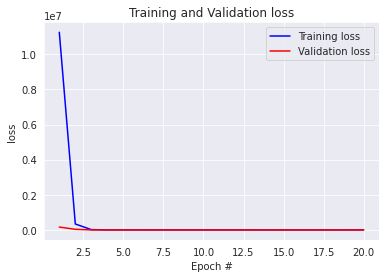

2/2 [==============================] - 0s 7ms/step - loss: 282.5398 - root_mean_squared_error: 6.2752
Model: 150
2/2 [==============================] - 0s 16ms/step - loss: 861.1172 - root_mean_squared_error: 23.2077
MODEL EVALUATION:  [861.1171875, 23.207721710205078]


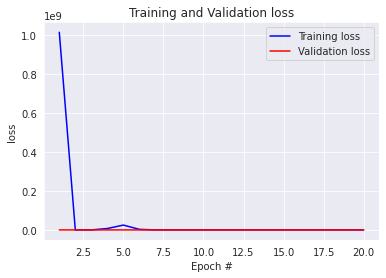

2/2 [==============================] - 0s 33ms/step - loss: 861.1172 - root_mean_squared_error: 23.2077
Model: 151
2/2 [==============================] - 0s 8ms/step - loss: 7.9332 - root_mean_squared_error: 2.0022
MODEL EVALUATION:  [7.9332404136657715, 2.002169609069824]


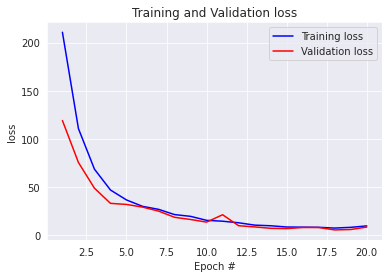

2/2 [==============================] - 0s 5ms/step - loss: 7.9332 - root_mean_squared_error: 2.0022
Model: 152
2/2 [==============================] - 0s 13ms/step - loss: 36.2057 - root_mean_squared_error: 2.9373
MODEL EVALUATION:  [36.205718994140625, 2.937267780303955]


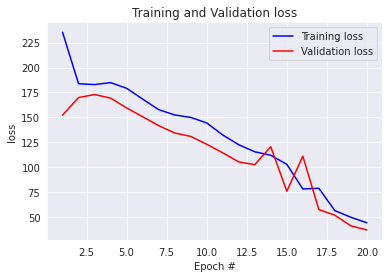

2/2 [==============================] - 0s 18ms/step - loss: 36.2057 - root_mean_squared_error: 2.9373
Model: 153
2/2 [==============================] - 0s 9ms/step - loss: 51.5369 - root_mean_squared_error: 6.5668
MODEL EVALUATION:  [51.53691482543945, 6.566841125488281]


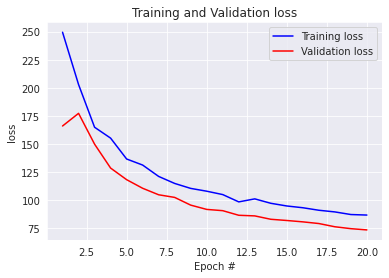

2/2 [==============================] - 0s 8ms/step - loss: 51.5369 - root_mean_squared_error: 6.5668
Model: 154
2/2 [==============================] - 0s 12ms/step - loss: 8.1196 - root_mean_squared_error: 1.3504
MODEL EVALUATION:  [8.119634628295898, 1.3503931760787964]


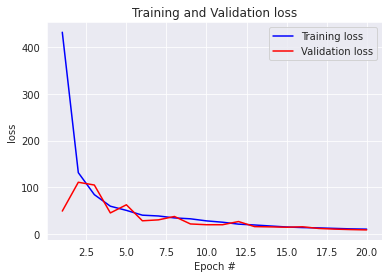

2/2 [==============================] - 0s 9ms/step - loss: 8.1196 - root_mean_squared_error: 1.3504
Model: 155
2/2 [==============================] - 0s 11ms/step - loss: 69.6140 - root_mean_squared_error: 2.2450
MODEL EVALUATION:  [69.61395263671875, 2.245023727416992]


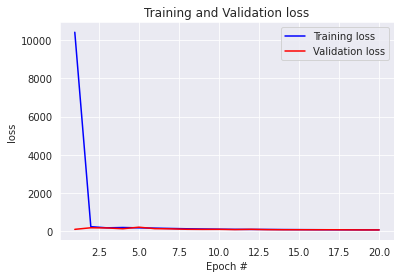

2/2 [==============================] - 0s 10ms/step - loss: 69.6140 - root_mean_squared_error: 2.2450
Model: 156
2/2 [==============================] - 0s 9ms/step - loss: 275.8083 - root_mean_squared_error: 13.5121
MODEL EVALUATION:  [275.808349609375, 13.512052536010742]


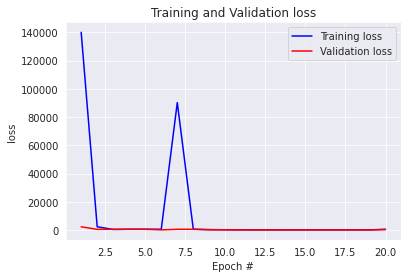

2/2 [==============================] - 0s 5ms/step - loss: 275.8083 - root_mean_squared_error: 13.5121
Model: 157
2/2 [==============================] - 0s 18ms/step - loss: 7.6006 - root_mean_squared_error: 1.7111
MODEL EVALUATION:  [7.6006083488464355, 1.7110587358474731]


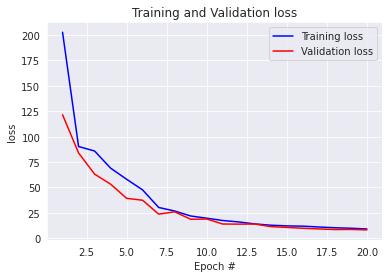

2/2 [==============================] - 0s 11ms/step - loss: 7.6006 - root_mean_squared_error: 1.7111
Model: 158
2/2 [==============================] - 0s 15ms/step - loss: 32.9339 - root_mean_squared_error: 4.4349
MODEL EVALUATION:  [32.93394470214844, 4.4349212646484375]


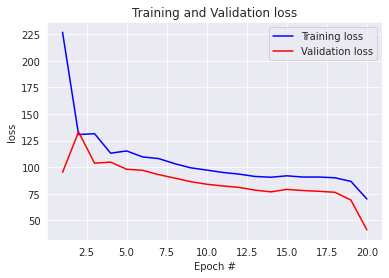

2/2 [==============================] - 0s 11ms/step - loss: 32.9339 - root_mean_squared_error: 4.4349
Model: 159
2/2 [==============================] - 0s 14ms/step - loss: 51.0818 - root_mean_squared_error: 6.6913
MODEL EVALUATION:  [51.08183670043945, 6.6912736892700195]


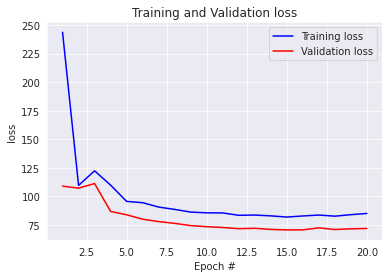

2/2 [==============================] - 0s 8ms/step - loss: 51.0818 - root_mean_squared_error: 6.6913
Model: 160
2/2 [==============================] - 0s 9ms/step - loss: 7.0780 - root_mean_squared_error: 2.0786
MODEL EVALUATION:  [7.077983856201172, 2.07861065864563]


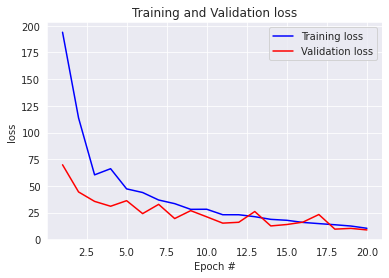

2/2 [==============================] - 0s 14ms/step - loss: 7.0780 - root_mean_squared_error: 2.0786
Model: 161
2/2 [==============================] - 0s 10ms/step - loss: 9.9767 - root_mean_squared_error: 1.8272
MODEL EVALUATION:  [9.97672176361084, 1.8271867036819458]


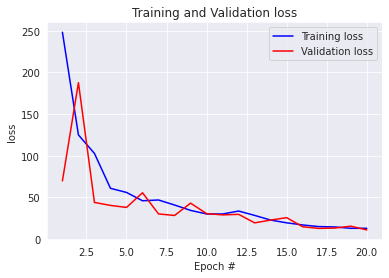

2/2 [==============================] - 0s 12ms/step - loss: 9.9767 - root_mean_squared_error: 1.8272
Model: 162
2/2 [==============================] - 0s 11ms/step - loss: 18.2148 - root_mean_squared_error: 3.3317
MODEL EVALUATION:  [18.214792251586914, 3.3317034244537354]


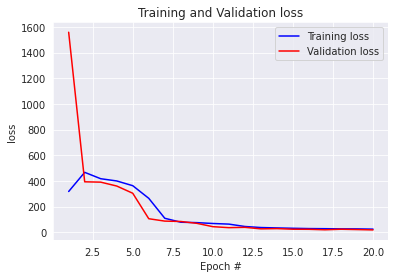

2/2 [==============================] - 0s 5ms/step - loss: 18.2148 - root_mean_squared_error: 3.3317
Model: 163
2/2 [==============================] - 0s 13ms/step - loss: 34.3722 - root_mean_squared_error: 5.4979
MODEL EVALUATION:  [34.37220001220703, 5.497869491577148]


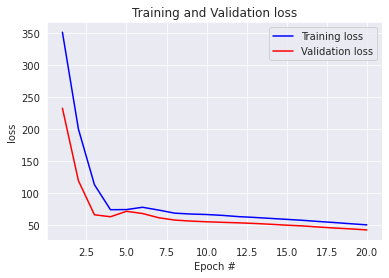

2/2 [==============================] - 0s 6ms/step - loss: 34.3722 - root_mean_squared_error: 5.4979
Model: 164
2/2 [==============================] - 0s 15ms/step - loss: 46.2096 - root_mean_squared_error: 6.4270
MODEL EVALUATION:  [46.209564208984375, 6.4270219802856445]


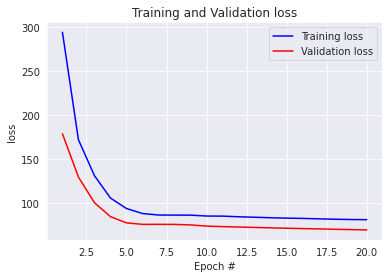

2/2 [==============================] - 0s 17ms/step - loss: 46.2096 - root_mean_squared_error: 6.4270
Model: 165
2/2 [==============================] - 0s 7ms/step - loss: 44.3471 - root_mean_squared_error: 6.4107
MODEL EVALUATION:  [44.34705352783203, 6.410685062408447]


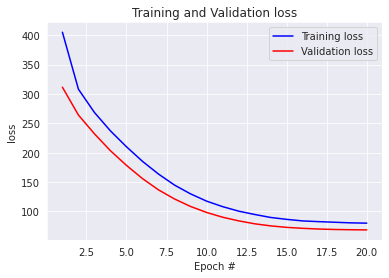

2/2 [==============================] - 0s 9ms/step - loss: 44.3471 - root_mean_squared_error: 6.4107
Model: 166
2/2 [==============================] - 0s 17ms/step - loss: 26.3922 - root_mean_squared_error: 4.8887
MODEL EVALUATION:  [26.392208099365234, 4.888651371002197]


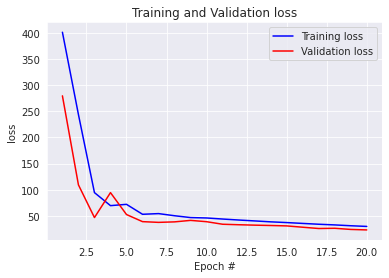

2/2 [==============================] - 0s 9ms/step - loss: 26.3922 - root_mean_squared_error: 4.8887
Model: 167
2/2 [==============================] - 0s 8ms/step - loss: 11.6022 - root_mean_squared_error: 2.6385
MODEL EVALUATION:  [11.602195739746094, 2.638460874557495]


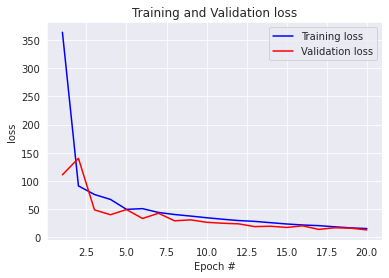

2/2 [==============================] - 0s 15ms/step - loss: 11.6022 - root_mean_squared_error: 2.6385
Model: 168
2/2 [==============================] - 0s 13ms/step - loss: 13.7004 - root_mean_squared_error: 2.9768
MODEL EVALUATION:  [13.700410842895508, 2.976773262023926]


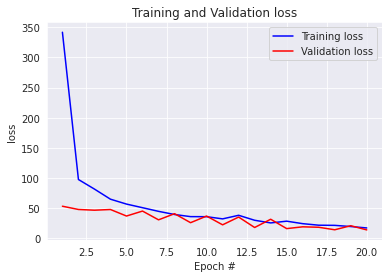

2/2 [==============================] - 0s 8ms/step - loss: 13.7004 - root_mean_squared_error: 2.9768
Model: 169
2/2 [==============================] - 0s 9ms/step - loss: 15.0968 - root_mean_squared_error: 2.9773
MODEL EVALUATION:  [15.096830368041992, 2.977313995361328]


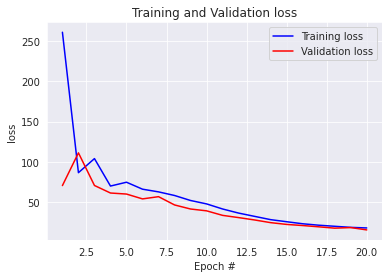

2/2 [==============================] - 0s 11ms/step - loss: 15.0968 - root_mean_squared_error: 2.9773
Model: 170
2/2 [==============================] - 0s 13ms/step - loss: 45.1687 - root_mean_squared_error: 6.4344
MODEL EVALUATION:  [45.16870880126953, 6.434448719024658]


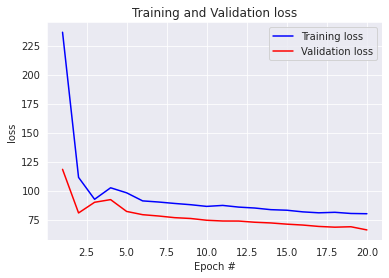

2/2 [==============================] - 0s 8ms/step - loss: 45.1687 - root_mean_squared_error: 6.4344
Model: 171
2/2 [==============================] - 0s 15ms/step - loss: 46.7299 - root_mean_squared_error: 6.6139
MODEL EVALUATION:  [46.72990417480469, 6.613934516906738]


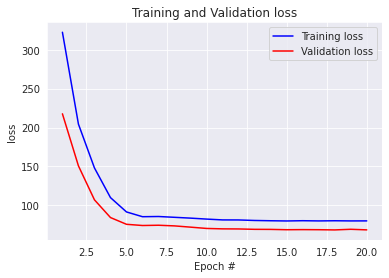

2/2 [==============================] - 0s 6ms/step - loss: 46.7299 - root_mean_squared_error: 6.6139
Model: 172
2/2 [==============================] - 0s 6ms/step - loss: 15.1492 - root_mean_squared_error: 3.5824
MODEL EVALUATION:  [15.149153709411621, 3.5823731422424316]


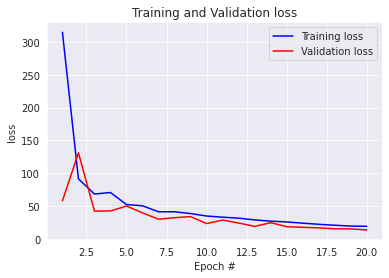

2/2 [==============================] - 0s 9ms/step - loss: 15.1492 - root_mean_squared_error: 3.5824
Model: 173
2/2 [==============================] - 0s 17ms/step - loss: 12.4058 - root_mean_squared_error: 2.8789
MODEL EVALUATION:  [12.405790328979492, 2.878926992416382]


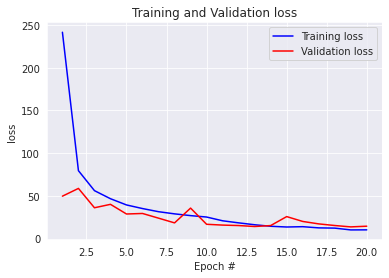

2/2 [==============================] - 0s 12ms/step - loss: 12.4058 - root_mean_squared_error: 2.8789
Model: 174
2/2 [==============================] - 0s 12ms/step - loss: 7.2609 - root_mean_squared_error: 1.8174
MODEL EVALUATION:  [7.260900497436523, 1.8174092769622803]


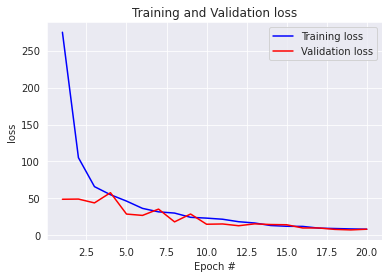

2/2 [==============================] - 0s 13ms/step - loss: 7.2609 - root_mean_squared_error: 1.8174
Model: 175
2/2 [==============================] - 0s 8ms/step - loss: 92.9641 - root_mean_squared_error: 9.5175
MODEL EVALUATION:  [92.96408081054688, 9.517529487609863]


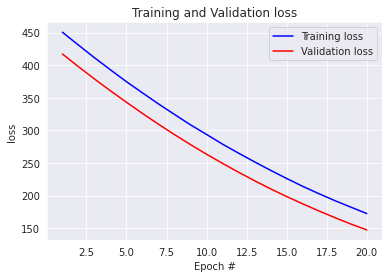

2/2 [==============================] - 0s 7ms/step - loss: 92.9641 - root_mean_squared_error: 9.5175
Model: 176
2/2 [==============================] - 0s 8ms/step - loss: 111.2044 - root_mean_squared_error: 10.0902
MODEL EVALUATION:  [111.20443725585938, 10.090230941772461]


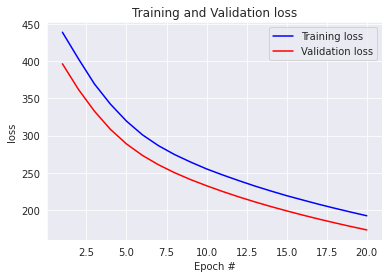

2/2 [==============================] - 0s 7ms/step - loss: 111.2044 - root_mean_squared_error: 10.0902
Model: 177
2/2 [==============================] - 0s 8ms/step - loss: 146.1387 - root_mean_squared_error: 11.6450
MODEL EVALUATION:  [146.1387481689453, 11.645036697387695]


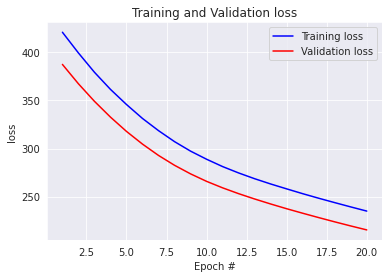

2/2 [==============================] - 0s 15ms/step - loss: 146.1387 - root_mean_squared_error: 11.6450
Model: 178
2/2 [==============================] - 0s 7ms/step - loss: 57.0311 - root_mean_squared_error: 7.4274
MODEL EVALUATION:  [57.031070709228516, 7.427354335784912]


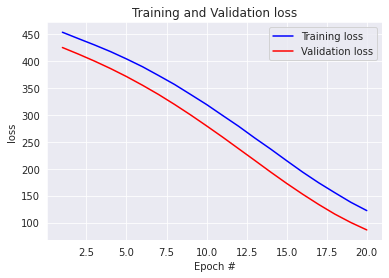

2/2 [==============================] - 0s 7ms/step - loss: 57.0311 - root_mean_squared_error: 7.4274
Model: 179
2/2 [==============================] - 0s 20ms/step - loss: 43.1430 - root_mean_squared_error: 6.1508
MODEL EVALUATION:  [43.143035888671875, 6.15078067779541]


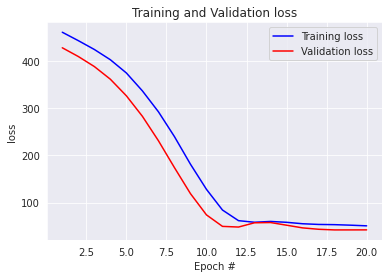

2/2 [==============================] - 0s 16ms/step - loss: 43.1430 - root_mean_squared_error: 6.1508
Model: 180
2/2 [==============================] - 0s 15ms/step - loss: 42.0235 - root_mean_squared_error: 5.9348
MODEL EVALUATION:  [42.02349090576172, 5.934849262237549]


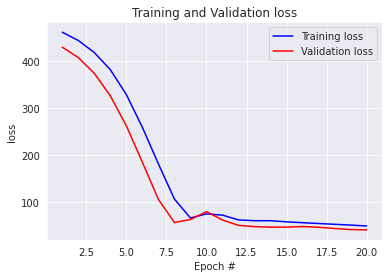

2/2 [==============================] - 0s 10ms/step - loss: 42.0235 - root_mean_squared_error: 5.9348
Model: 181
2/2 [==============================] - 0s 8ms/step - loss: 326.4871 - root_mean_squared_error: 18.0168
MODEL EVALUATION:  [326.487060546875, 18.016817092895508]


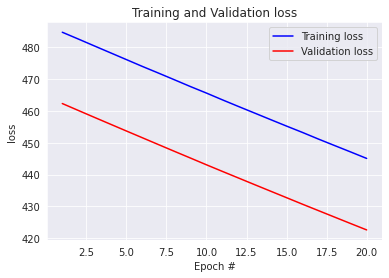

2/2 [==============================] - 0s 7ms/step - loss: 326.4871 - root_mean_squared_error: 18.0168
Model: 182
2/2 [==============================] - 0s 6ms/step - loss: 333.2900 - root_mean_squared_error: 18.0058
MODEL EVALUATION:  [333.2900390625, 18.005760192871094]


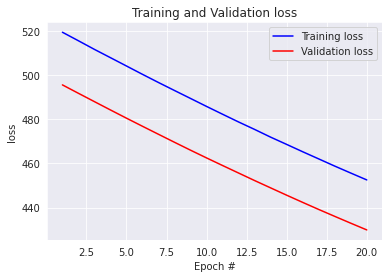

2/2 [==============================] - 0s 8ms/step - loss: 333.2900 - root_mean_squared_error: 18.0058
Model: 183
2/2 [==============================] - 0s 12ms/step - loss: 341.5777 - root_mean_squared_error: 18.1657
MODEL EVALUATION:  [341.5777282714844, 18.165664672851562]


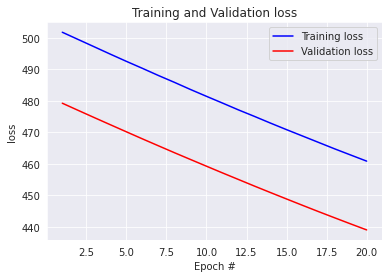

2/2 [==============================] - 0s 10ms/step - loss: 341.5777 - root_mean_squared_error: 18.1657
Model: 184
2/2 [==============================] - 0s 6ms/step - loss: 316.9245 - root_mean_squared_error: 17.7519
MODEL EVALUATION:  [316.92449951171875, 17.75194549560547]


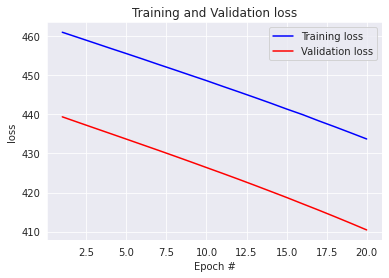

2/2 [==============================] - 0s 8ms/step - loss: 316.9245 - root_mean_squared_error: 17.7519
Model: 185
2/2 [==============================] - 0s 9ms/step - loss: 310.7949 - root_mean_squared_error: 17.3889
MODEL EVALUATION:  [310.794921875, 17.388874053955078]


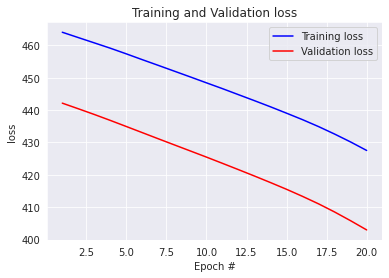

2/2 [==============================] - 0s 13ms/step - loss: 310.7949 - root_mean_squared_error: 17.3889
Model: 186
2/2 [==============================] - 0s 9ms/step - loss: 272.8080 - root_mean_squared_error: 16.1779
MODEL EVALUATION:  [272.8079833984375, 16.177902221679688]


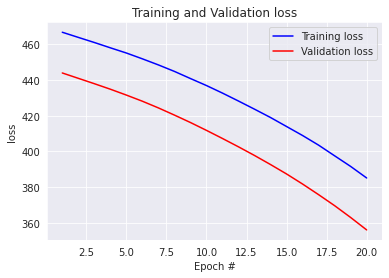

2/2 [==============================] - 0s 12ms/step - loss: 272.8080 - root_mean_squared_error: 16.1779
Model: 187
2/2 [==============================] - 0s 14ms/step - loss: 333.6068 - root_mean_squared_error: 18.2148
MODEL EVALUATION:  [333.6068420410156, 18.214832305908203]


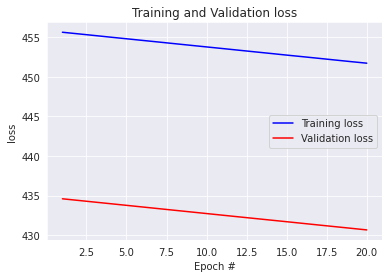

2/2 [==============================] - 0s 15ms/step - loss: 333.6068 - root_mean_squared_error: 18.2148
Model: 188
2/2 [==============================] - 0s 10ms/step - loss: 332.0569 - root_mean_squared_error: 17.9736
MODEL EVALUATION:  [332.056884765625, 17.973644256591797]


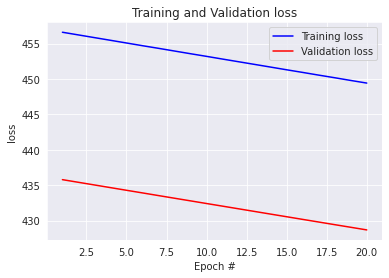

2/2 [==============================] - 0s 7ms/step - loss: 332.0569 - root_mean_squared_error: 17.9736
Model: 189
2/2 [==============================] - 0s 9ms/step - loss: 315.2974 - root_mean_squared_error: 17.4241
MODEL EVALUATION:  [315.29736328125, 17.424097061157227]


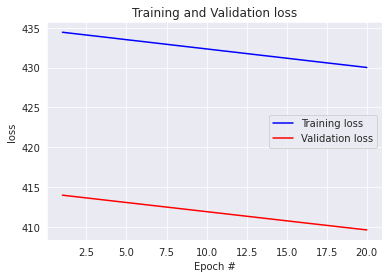

2/2 [==============================] - 0s 7ms/step - loss: 315.2974 - root_mean_squared_error: 17.4241
Model: 190
2/2 [==============================] - 0s 17ms/step - loss: 329.1227 - root_mean_squared_error: 18.0905
MODEL EVALUATION:  [329.1226501464844, 18.09050941467285]


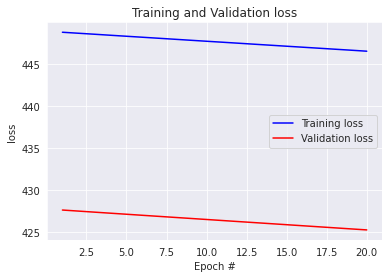

2/2 [==============================] - 0s 10ms/step - loss: 329.1227 - root_mean_squared_error: 18.0905
Model: 191
2/2 [==============================] - 0s 4ms/step - loss: 334.9943 - root_mean_squared_error: 18.0540
MODEL EVALUATION:  [334.99432373046875, 18.053985595703125]


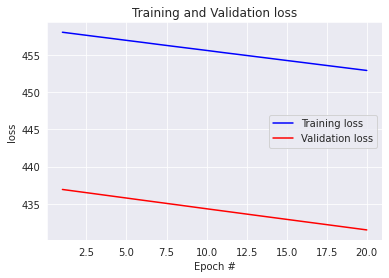

2/2 [==============================] - 0s 10ms/step - loss: 334.9943 - root_mean_squared_error: 18.0540
Model: 192
2/2 [==============================] - 0s 19ms/step - loss: 348.7713 - root_mean_squared_error: 18.3651
MODEL EVALUATION:  [348.7713317871094, 18.36509132385254]


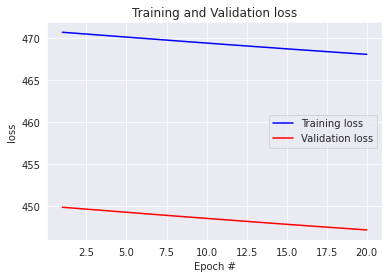

2/2 [==============================] - 0s 8ms/step - loss: 348.7713 - root_mean_squared_error: 18.3651
Model: 193
2/2 [==============================] - 0s 10ms/step - loss: 22.2056 - root_mean_squared_error: 3.8350
MODEL EVALUATION:  [22.205598831176758, 3.8350017070770264]


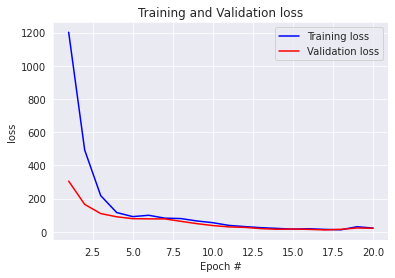

2/2 [==============================] - 0s 9ms/step - loss: 22.2056 - root_mean_squared_error: 3.8350
Model: 194
2/2 [==============================] - 0s 15ms/step - loss: 166.8595 - root_mean_squared_error: 6.2416
MODEL EVALUATION:  [166.85951232910156, 6.241591930389404]


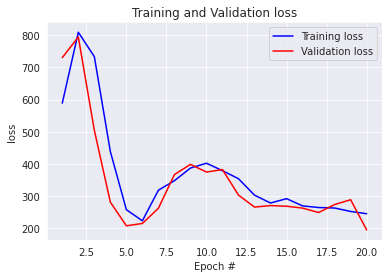

2/2 [==============================] - 0s 17ms/step - loss: 166.8595 - root_mean_squared_error: 6.2416
Model: 195
2/2 [==============================] - 0s 5ms/step - loss: 118.7326 - root_mean_squared_error: 8.7500
MODEL EVALUATION:  [118.7325668334961, 8.74997329711914]


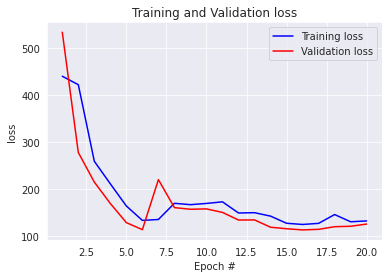

2/2 [==============================] - 0s 16ms/step - loss: 118.7326 - root_mean_squared_error: 8.7500
Model: 196
2/2 [==============================] - 0s 9ms/step - loss: 159.6622 - root_mean_squared_error: 2.9213
MODEL EVALUATION:  [159.66221618652344, 2.9213173389434814]


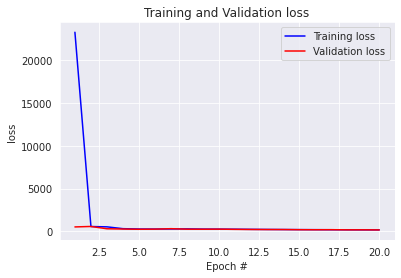

2/2 [==============================] - 0s 6ms/step - loss: 159.6622 - root_mean_squared_error: 2.9213
Model: 197
2/2 [==============================] - 0s 9ms/step - loss: 1199.2328 - root_mean_squared_error: 5.5831
MODEL EVALUATION:  [1199.2327880859375, 5.583139896392822]


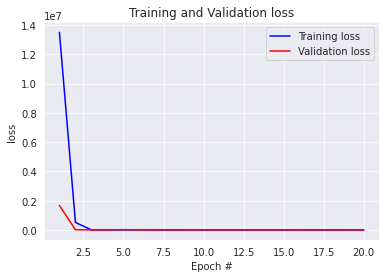

2/2 [==============================] - 0s 9ms/step - loss: 1199.2328 - root_mean_squared_error: 5.5831
Model: 198
2/2 [==============================] - 0s 15ms/step - loss: 1991.5090 - root_mean_squared_error: 19.8066
MODEL EVALUATION:  [1991.509033203125, 19.80658531188965]


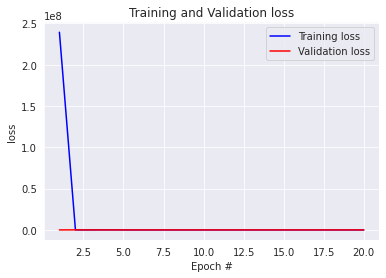

2/2 [==============================] - 0s 11ms/step - loss: 1991.5090 - root_mean_squared_error: 19.8066
Model: 199
2/2 [==============================] - 0s 17ms/step - loss: 6.3665 - root_mean_squared_error: 1.4476
MODEL EVALUATION:  [6.366512775421143, 1.4475510120391846]


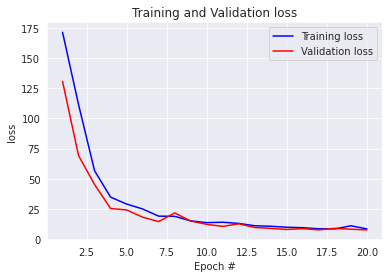

2/2 [==============================] - 0s 10ms/step - loss: 6.3665 - root_mean_squared_error: 1.4476
Model: 200
2/2 [==============================] - 0s 14ms/step - loss: 20.1129 - root_mean_squared_error: 2.9047
MODEL EVALUATION:  [20.11294174194336, 2.9047293663024902]


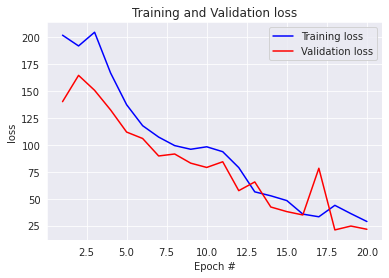

2/2 [==============================] - 0s 11ms/step - loss: 20.1129 - root_mean_squared_error: 2.9047
Model: 201
2/2 [==============================] - 0s 15ms/step - loss: 47.5009 - root_mean_squared_error: 6.4503
MODEL EVALUATION:  [47.50090026855469, 6.450327396392822]


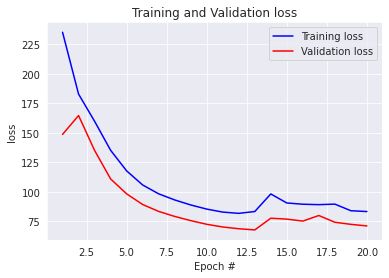

2/2 [==============================] - 0s 5ms/step - loss: 47.5009 - root_mean_squared_error: 6.4503
Model: 202
2/2 [==============================] - 0s 10ms/step - loss: 3.7608 - root_mean_squared_error: 1.0124
MODEL EVALUATION:  [3.7607951164245605, 1.012359619140625]


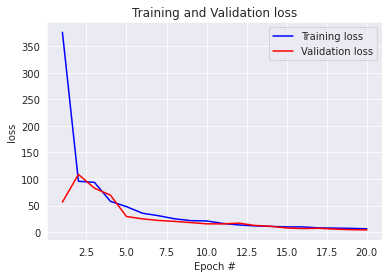

2/2 [==============================] - 0s 8ms/step - loss: 3.7608 - root_mean_squared_error: 1.0124
Model: 203
2/2 [==============================] - 0s 9ms/step - loss: 81.3660 - root_mean_squared_error: 2.2974
MODEL EVALUATION:  [81.36597442626953, 2.2973616123199463]


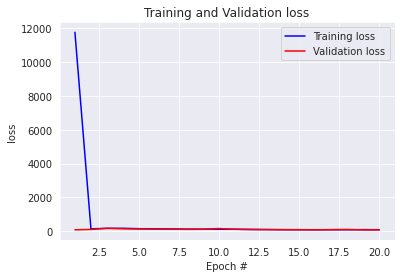

2/2 [==============================] - 0s 12ms/step - loss: 81.3660 - root_mean_squared_error: 2.2974
Model: 204
2/2 [==============================] - 0s 15ms/step - loss: 161.2321 - root_mean_squared_error: 7.1297
MODEL EVALUATION:  [161.2321319580078, 7.1297149658203125]


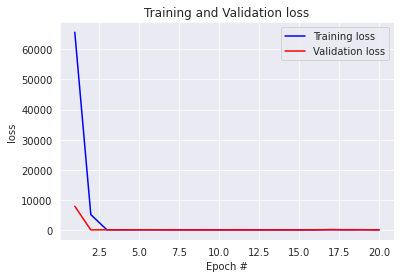

2/2 [==============================] - 0s 11ms/step - loss: 161.2321 - root_mean_squared_error: 7.1297
Model: 205
2/2 [==============================] - 0s 11ms/step - loss: 9.1737 - root_mean_squared_error: 1.8608
MODEL EVALUATION:  [9.173735618591309, 1.860837697982788]


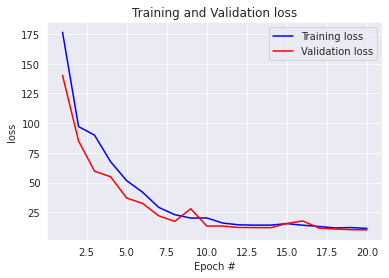

2/2 [==============================] - 0s 7ms/step - loss: 9.1737 - root_mean_squared_error: 1.8608
Model: 206
2/2 [==============================] - 0s 14ms/step - loss: 30.8222 - root_mean_squared_error: 3.8604
MODEL EVALUATION:  [30.822181701660156, 3.8604466915130615]


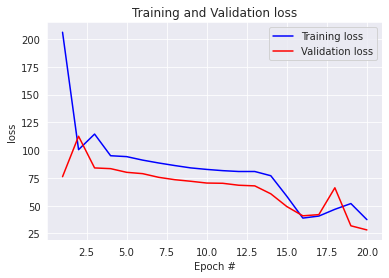

2/2 [==============================] - 0s 7ms/step - loss: 30.8222 - root_mean_squared_error: 3.8604
Model: 207
2/2 [==============================] - 0s 18ms/step - loss: 44.8775 - root_mean_squared_error: 6.6422
MODEL EVALUATION:  [44.87746810913086, 6.64217472076416]


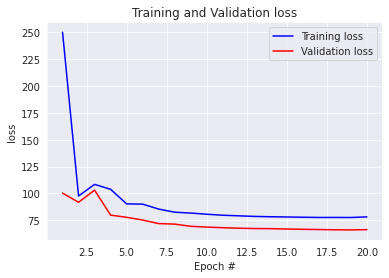

2/2 [==============================] - 0s 18ms/step - loss: 44.8775 - root_mean_squared_error: 6.6422
Model: 208
2/2 [==============================] - 0s 15ms/step - loss: 4.7566 - root_mean_squared_error: 1.7040
MODEL EVALUATION:  [4.756648540496826, 1.7039834260940552]


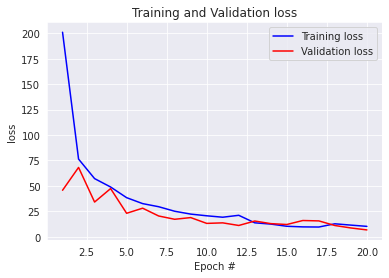

2/2 [==============================] - 0s 11ms/step - loss: 4.7566 - root_mean_squared_error: 1.7040
Model: 209
2/2 [==============================] - 0s 11ms/step - loss: 6.4969 - root_mean_squared_error: 1.5612
MODEL EVALUATION:  [6.496938228607178, 1.5611542463302612]


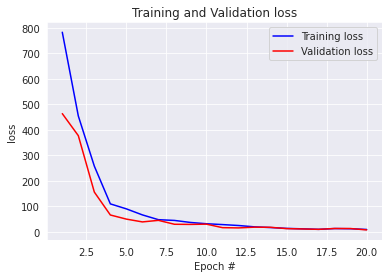

2/2 [==============================] - 0s 13ms/step - loss: 6.4969 - root_mean_squared_error: 1.5612
Model: 210
2/2 [==============================] - 0s 11ms/step - loss: 10.7442 - root_mean_squared_error: 2.2192
MODEL EVALUATION:  [10.74422836303711, 2.2192060947418213]


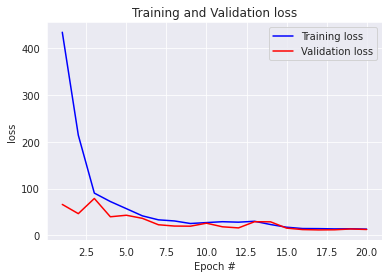

2/2 [==============================] - 0s 8ms/step - loss: 10.7442 - root_mean_squared_error: 2.2192
Model: 211
2/2 [==============================] - 0s 15ms/step - loss: 34.0025 - root_mean_squared_error: 5.6909
MODEL EVALUATION:  [34.00252914428711, 5.6909332275390625]


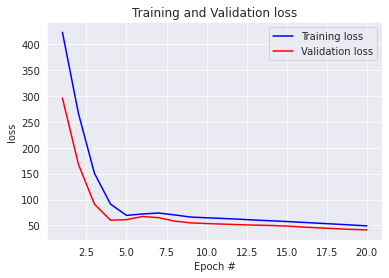

2/2 [==============================] - 0s 15ms/step - loss: 34.0025 - root_mean_squared_error: 5.6909
Model: 212
2/2 [==============================] - 0s 15ms/step - loss: 44.8816 - root_mean_squared_error: 6.5845
MODEL EVALUATION:  [44.881629943847656, 6.584512710571289]


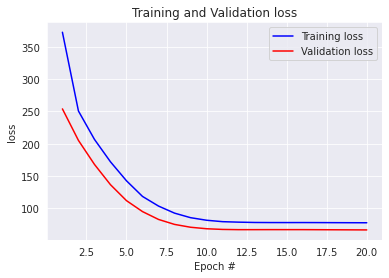

2/2 [==============================] - 0s 7ms/step - loss: 44.8816 - root_mean_squared_error: 6.5845
Model: 213
2/2 [==============================] - 0s 13ms/step - loss: 42.4422 - root_mean_squared_error: 6.4246
MODEL EVALUATION:  [42.4421501159668, 6.4245710372924805]


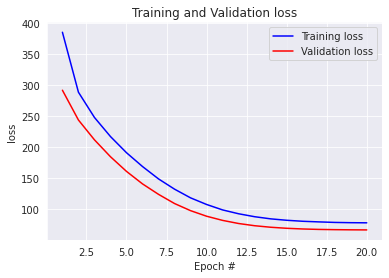

2/2 [==============================] - 0s 7ms/step - loss: 42.4422 - root_mean_squared_error: 6.4246
Model: 214
2/2 [==============================] - 0s 15ms/step - loss: 24.5840 - root_mean_squared_error: 4.8812
MODEL EVALUATION:  [24.58397674560547, 4.881171703338623]


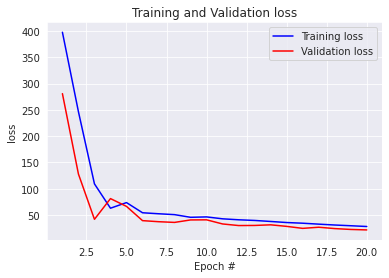

2/2 [==============================] - 0s 6ms/step - loss: 24.5840 - root_mean_squared_error: 4.8812
Model: 215
2/2 [==============================] - 0s 15ms/step - loss: 13.8895 - root_mean_squared_error: 3.5790
MODEL EVALUATION:  [13.889549255371094, 3.5790207386016846]


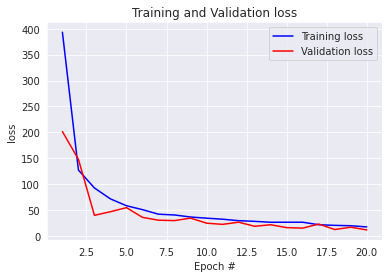

2/2 [==============================] - 0s 9ms/step - loss: 13.8895 - root_mean_squared_error: 3.5790
Model: 216
2/2 [==============================] - 0s 18ms/step - loss: 13.0976 - root_mean_squared_error: 3.4972
MODEL EVALUATION:  [13.097630500793457, 3.497225761413574]


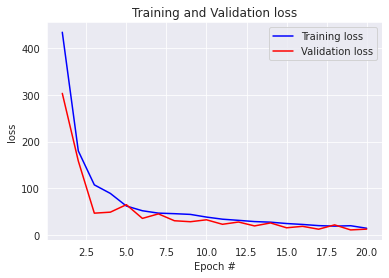

2/2 [==============================] - 0s 6ms/step - loss: 13.0976 - root_mean_squared_error: 3.4972
Model: 217
2/2 [==============================] - 0s 7ms/step - loss: 17.0971 - root_mean_squared_error: 3.5057
MODEL EVALUATION:  [17.09710121154785, 3.505746603012085]


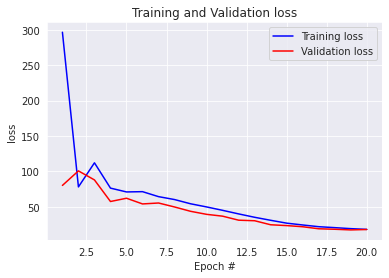

2/2 [==============================] - 0s 12ms/step - loss: 17.0971 - root_mean_squared_error: 3.5057
Model: 218
2/2 [==============================] - 0s 15ms/step - loss: 45.1282 - root_mean_squared_error: 6.6145
MODEL EVALUATION:  [45.12822723388672, 6.614503383636475]


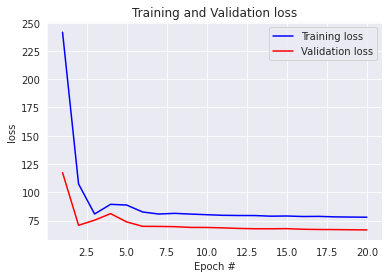

2/2 [==============================] - 0s 9ms/step - loss: 45.1282 - root_mean_squared_error: 6.6145
Model: 219
2/2 [==============================] - 0s 8ms/step - loss: 44.9849 - root_mean_squared_error: 6.6416
MODEL EVALUATION:  [44.98492431640625, 6.641584396362305]


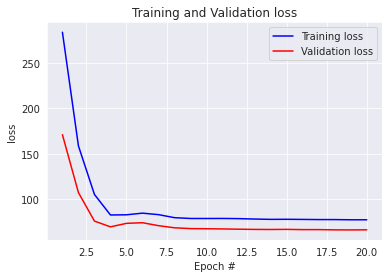

2/2 [==============================] - 0s 11ms/step - loss: 44.9849 - root_mean_squared_error: 6.6416
Model: 220
2/2 [==============================] - 0s 11ms/step - loss: 15.2197 - root_mean_squared_error: 3.7609
MODEL EVALUATION:  [15.219719886779785, 3.760883092880249]


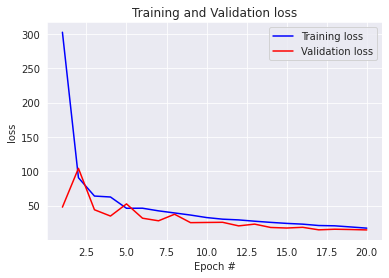

2/2 [==============================] - 0s 16ms/step - loss: 15.2197 - root_mean_squared_error: 3.7609
Model: 221
2/2 [==============================] - 0s 16ms/step - loss: 7.3310 - root_mean_squared_error: 2.4705
MODEL EVALUATION:  [7.330982208251953, 2.470526933670044]


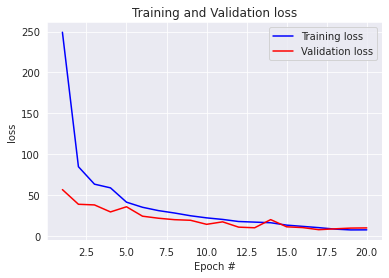

2/2 [==============================] - 0s 5ms/step - loss: 7.3310 - root_mean_squared_error: 2.4705
Model: 222
2/2 [==============================] - 0s 11ms/step - loss: 6.9796 - root_mean_squared_error: 2.4016
MODEL EVALUATION:  [6.979592800140381, 2.4016470909118652]


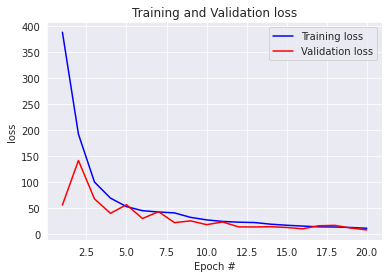

2/2 [==============================] - 0s 8ms/step - loss: 6.9796 - root_mean_squared_error: 2.4016
Model: 223
2/2 [==============================] - 0s 15ms/step - loss: 85.4611 - root_mean_squared_error: 9.2197
MODEL EVALUATION:  [85.46114349365234, 9.21972370147705]


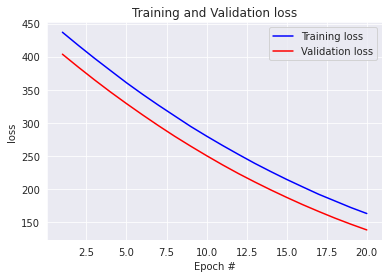

2/2 [==============================] - 0s 7ms/step - loss: 85.4611 - root_mean_squared_error: 9.2197
Model: 224
2/2 [==============================] - 0s 8ms/step - loss: 131.5950 - root_mean_squared_error: 11.4095
MODEL EVALUATION:  [131.59498596191406, 11.409525871276855]


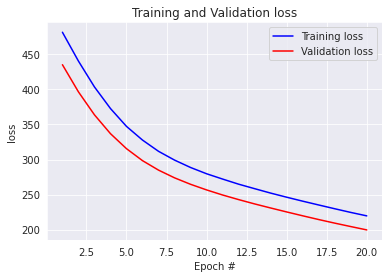

2/2 [==============================] - 0s 11ms/step - loss: 131.5950 - root_mean_squared_error: 11.4095
Model: 225
2/2 [==============================] - 0s 7ms/step - loss: 186.2992 - root_mean_squared_error: 13.5858
MODEL EVALUATION:  [186.29920959472656, 13.585759162902832]


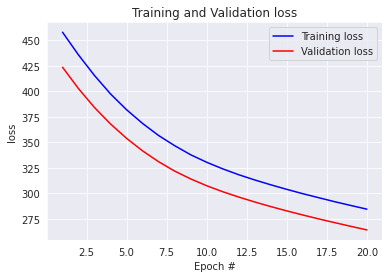

2/2 [==============================] - 0s 10ms/step - loss: 186.2992 - root_mean_squared_error: 13.5858
Model: 226
2/2 [==============================] - 0s 12ms/step - loss: 90.9192 - root_mean_squared_error: 9.5184
MODEL EVALUATION:  [90.91922760009766, 9.518412590026855]


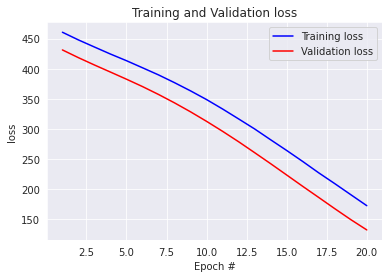

2/2 [==============================] - 0s 8ms/step - loss: 90.9192 - root_mean_squared_error: 9.5184
Model: 227
2/2 [==============================] - 0s 17ms/step - loss: 37.3581 - root_mean_squared_error: 6.0444
MODEL EVALUATION:  [37.358123779296875, 6.044363975524902]


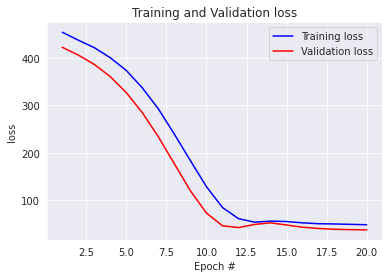

2/2 [==============================] - 0s 7ms/step - loss: 37.3581 - root_mean_squared_error: 6.0444
Model: 228
2/2 [==============================] - 0s 14ms/step - loss: 37.4107 - root_mean_squared_error: 6.0363
MODEL EVALUATION:  [37.410709381103516, 6.0362749099731445]


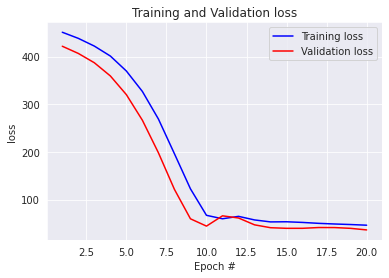

2/2 [==============================] - 0s 8ms/step - loss: 37.4107 - root_mean_squared_error: 6.0363
Model: 229
2/2 [==============================] - 0s 10ms/step - loss: 323.9144 - root_mean_squared_error: 17.9904
MODEL EVALUATION:  [323.9144287109375, 17.990419387817383]


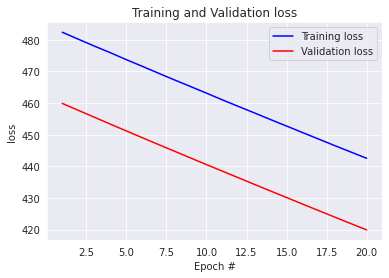

2/2 [==============================] - 0s 7ms/step - loss: 323.9144 - root_mean_squared_error: 17.9904
Model: 230
2/2 [==============================] - 0s 9ms/step - loss: 252.0430 - root_mean_squared_error: 15.8406
MODEL EVALUATION:  [252.04299926757812, 15.840561866760254]


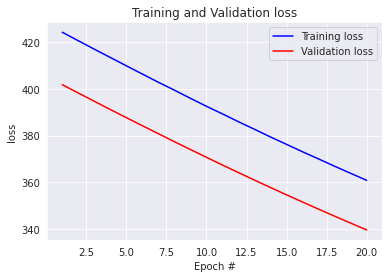

2/2 [==============================] - 0s 5ms/step - loss: 252.0430 - root_mean_squared_error: 15.8406
Model: 231
2/2 [==============================] - 0s 16ms/step - loss: 343.9759 - root_mean_squared_error: 18.5052
MODEL EVALUATION:  [343.9759216308594, 18.50523567199707]


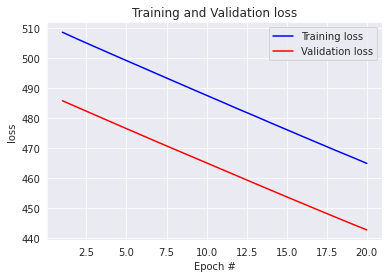

2/2 [==============================] - 0s 5ms/step - loss: 343.9759 - root_mean_squared_error: 18.5052
Model: 232
2/2 [==============================] - 0s 9ms/step - loss: 329.4485 - root_mean_squared_error: 18.1441
MODEL EVALUATION:  [329.448486328125, 18.14413833618164]


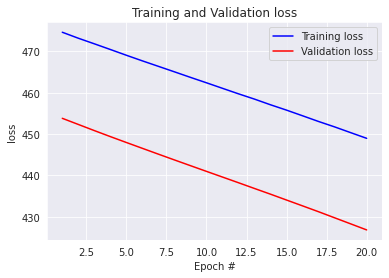

2/2 [==============================] - 0s 8ms/step - loss: 329.4485 - root_mean_squared_error: 18.1441
Model: 233
2/2 [==============================] - 0s 5ms/step - loss: 299.4608 - root_mean_squared_error: 17.2753
MODEL EVALUATION:  [299.4608154296875, 17.27529525756836]


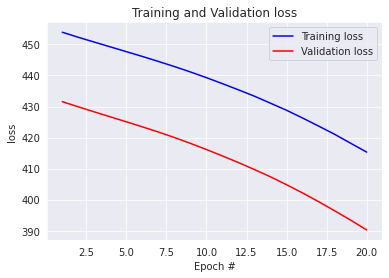

2/2 [==============================] - 0s 12ms/step - loss: 299.4608 - root_mean_squared_error: 17.2753
Model: 234
2/2 [==============================] - 0s 11ms/step - loss: 295.4991 - root_mean_squared_error: 17.1483
MODEL EVALUATION:  [295.4991149902344, 17.148273468017578]


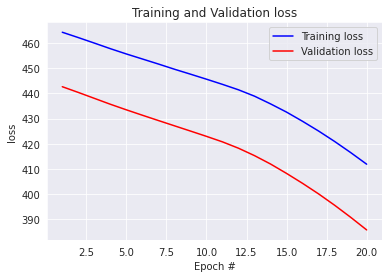

2/2 [==============================] - 0s 6ms/step - loss: 295.4991 - root_mean_squared_error: 17.1483
Model: 235
2/2 [==============================] - 0s 16ms/step - loss: 310.7982 - root_mean_squared_error: 17.6222
MODEL EVALUATION:  [310.7982482910156, 17.62224578857422]


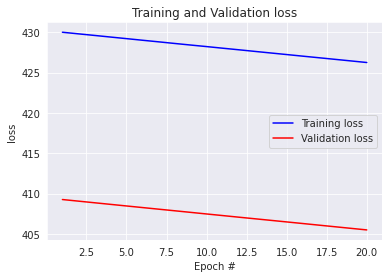

2/2 [==============================] - 0s 7ms/step - loss: 310.7982 - root_mean_squared_error: 17.6222
Model: 236
2/2 [==============================] - 0s 11ms/step - loss: 315.2385 - root_mean_squared_error: 17.7235
MODEL EVALUATION:  [315.238525390625, 17.723522186279297]


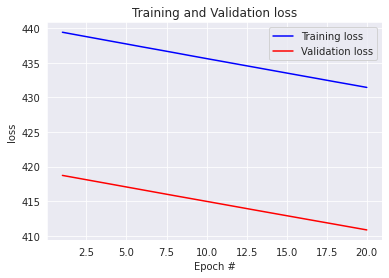

2/2 [==============================] - 0s 10ms/step - loss: 315.2385 - root_mean_squared_error: 17.7235
Model: 237
2/2 [==============================] - 0s 18ms/step - loss: 300.4803 - root_mean_squared_error: 17.2902
MODEL EVALUATION:  [300.4802551269531, 17.290231704711914]


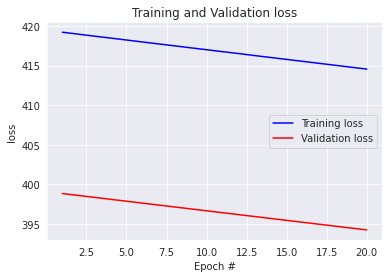

2/2 [==============================] - 0s 11ms/step - loss: 300.4803 - root_mean_squared_error: 17.2902
Model: 238
2/2 [==============================] - 0s 10ms/step - loss: 347.2618 - root_mean_squared_error: 18.6284
MODEL EVALUATION:  [347.2618103027344, 18.62841033935547]


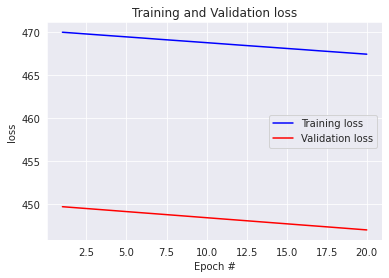

2/2 [==============================] - 0s 11ms/step - loss: 347.2618 - root_mean_squared_error: 18.6284
Model: 239
2/2 [==============================] - 0s 6ms/step - loss: 341.3654 - root_mean_squared_error: 18.4464
MODEL EVALUATION:  [341.3653564453125, 18.446380615234375]


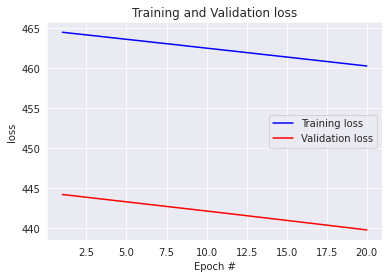

2/2 [==============================] - 0s 7ms/step - loss: 341.3654 - root_mean_squared_error: 18.4464
Model: 240
2/2 [==============================] - 0s 18ms/step - loss: 336.1988 - root_mean_squared_error: 18.2944
MODEL EVALUATION:  [336.1988220214844, 18.294382095336914]


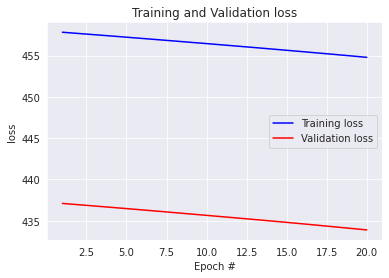

2/2 [==============================] - 0s 7ms/step - loss: 336.1988 - root_mean_squared_error: 18.2944
Model: 241
2/2 [==============================] - 0s 17ms/step - loss: 14.0778 - root_mean_squared_error: 3.7520
MODEL EVALUATION:  [14.077815055847168, 3.7520413398742676]


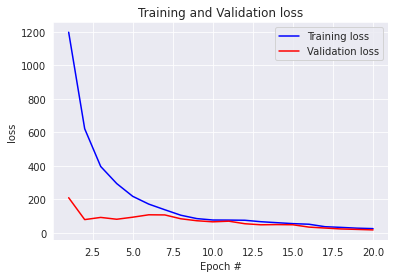

2/2 [==============================] - 0s 7ms/step - loss: 14.0778 - root_mean_squared_error: 3.7520
Model: 242
2/2 [==============================] - 0s 9ms/step - loss: 57.6048 - root_mean_squared_error: 7.5898
MODEL EVALUATION:  [57.604793548583984, 7.589782238006592]


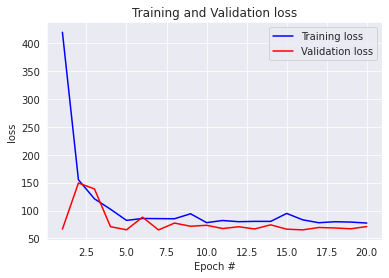

2/2 [==============================] - 0s 7ms/step - loss: 57.6048 - root_mean_squared_error: 7.5898
Model: 243
2/2 [==============================] - 0s 8ms/step - loss: 46.8604 - root_mean_squared_error: 6.8455
MODEL EVALUATION:  [46.86044692993164, 6.845468997955322]


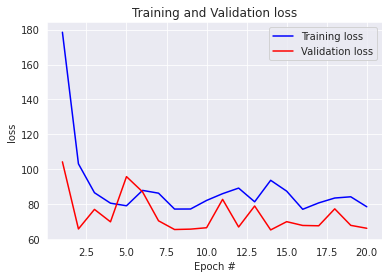

2/2 [==============================] - 0s 7ms/step - loss: 46.8604 - root_mean_squared_error: 6.8455
Model: 244
2/2 [==============================] - 0s 8ms/step - loss: 3.6202 - root_mean_squared_error: 1.9027
MODEL EVALUATION:  [3.6201865673065186, 1.9026787281036377]


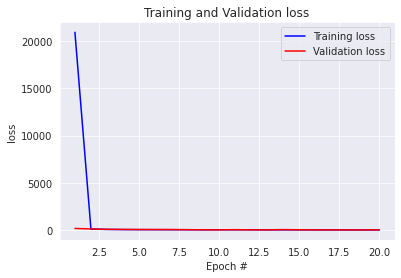

2/2 [==============================] - 0s 10ms/step - loss: 3.6202 - root_mean_squared_error: 1.9027
Model: 245
2/2 [==============================] - 0s 11ms/step - loss: 14.7556 - root_mean_squared_error: 3.8413
MODEL EVALUATION:  [14.755573272705078, 3.8412983417510986]


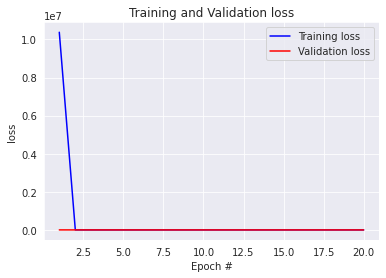

2/2 [==============================] - 0s 7ms/step - loss: 14.7556 - root_mean_squared_error: 3.8413
Model: 246
2/2 [==============================] - 0s 8ms/step - loss: 362.6588 - root_mean_squared_error: 19.0436
MODEL EVALUATION:  [362.6587829589844, 19.043601989746094]


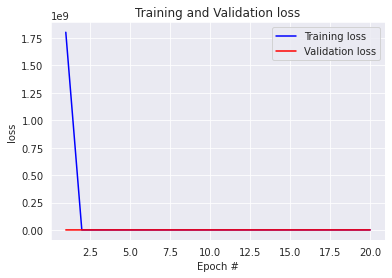

2/2 [==============================] - 0s 6ms/step - loss: 362.6588 - root_mean_squared_error: 19.0436
Model: 247
2/2 [==============================] - 0s 8ms/step - loss: 5.3467 - root_mean_squared_error: 2.3123
MODEL EVALUATION:  [5.346749782562256, 2.3123040199279785]


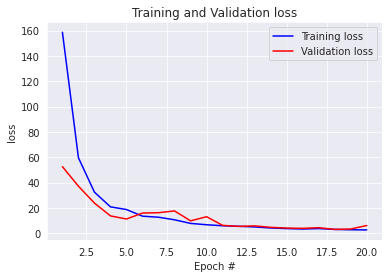

2/2 [==============================] - 0s 12ms/step - loss: 5.3467 - root_mean_squared_error: 2.3123
Model: 248
2/2 [==============================] - 0s 7ms/step - loss: 71.7079 - root_mean_squared_error: 8.4680
MODEL EVALUATION:  [71.70785522460938, 8.468049049377441]


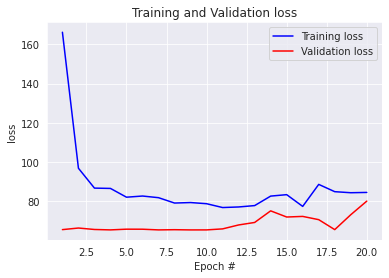

2/2 [==============================] - 0s 6ms/step - loss: 71.7079 - root_mean_squared_error: 8.4680
Model: 249
2/2 [==============================] - 0s 9ms/step - loss: 43.1121 - root_mean_squared_error: 6.5660
MODEL EVALUATION:  [43.1120719909668, 6.565978050231934]


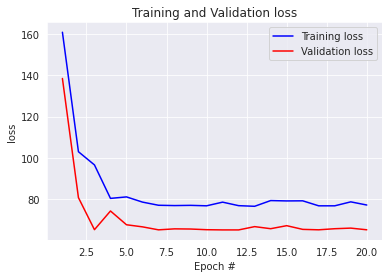

2/2 [==============================] - 0s 8ms/step - loss: 43.1121 - root_mean_squared_error: 6.5660
Model: 250
2/2 [==============================] - 0s 7ms/step - loss: 2.5181 - root_mean_squared_error: 1.5868
MODEL EVALUATION:  [2.5180835723876953, 1.5868470668792725]


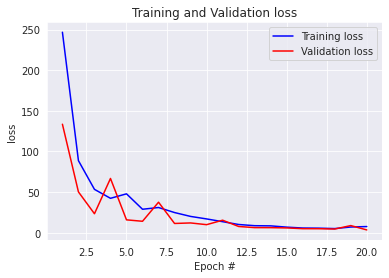

2/2 [==============================] - 0s 7ms/step - loss: 2.5181 - root_mean_squared_error: 1.5868
Model: 251
2/2 [==============================] - 0s 9ms/step - loss: 11.4261 - root_mean_squared_error: 3.3803
MODEL EVALUATION:  [11.42609977722168, 3.380251407623291]


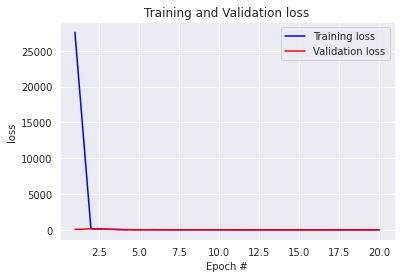

2/2 [==============================] - 0s 9ms/step - loss: 11.4261 - root_mean_squared_error: 3.3803
Model: 252
2/2 [==============================] - 0s 12ms/step - loss: 5.3714 - root_mean_squared_error: 2.3176
MODEL EVALUATION:  [5.371388912200928, 2.3176257610321045]


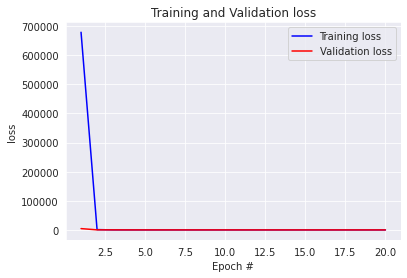

2/2 [==============================] - 0s 11ms/step - loss: 5.3714 - root_mean_squared_error: 2.3176
Model: 253
2/2 [==============================] - 0s 7ms/step - loss: 2.7584 - root_mean_squared_error: 1.6609
MODEL EVALUATION:  [2.7584433555603027, 1.6608561277389526]


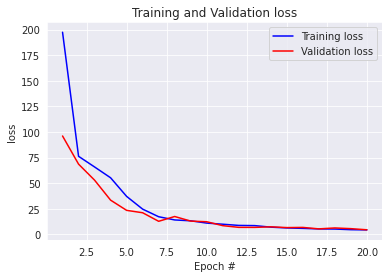

2/2 [==============================] - 0s 8ms/step - loss: 2.7584 - root_mean_squared_error: 1.6609
Model: 254
2/2 [==============================] - 0s 5ms/step - loss: 41.4323 - root_mean_squared_error: 6.4368
MODEL EVALUATION:  [41.43231201171875, 6.436793804168701]


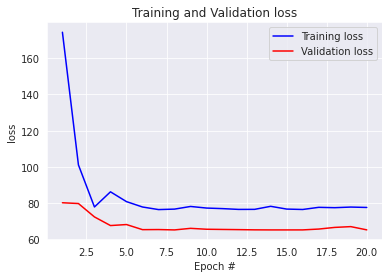

2/2 [==============================] - 0s 9ms/step - loss: 41.4323 - root_mean_squared_error: 6.4368
Model: 255
2/2 [==============================] - 0s 6ms/step - loss: 43.7925 - root_mean_squared_error: 6.6176
MODEL EVALUATION:  [43.792510986328125, 6.61759090423584]


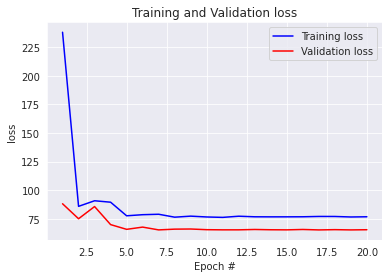

2/2 [==============================] - 0s 8ms/step - loss: 43.7925 - root_mean_squared_error: 6.6176
Model: 256
2/2 [==============================] - 0s 6ms/step - loss: 4.7950 - root_mean_squared_error: 2.1897
MODEL EVALUATION:  [4.794961452484131, 2.189739942550659]


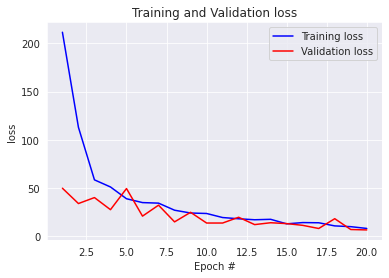

2/2 [==============================] - 0s 8ms/step - loss: 4.7950 - root_mean_squared_error: 2.1897
Model: 257
2/2 [==============================] - 0s 10ms/step - loss: 4.8429 - root_mean_squared_error: 2.2007
MODEL EVALUATION:  [4.842939853668213, 2.2006680965423584]


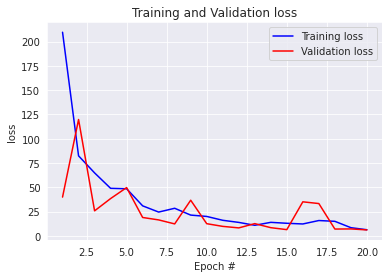

2/2 [==============================] - 0s 6ms/step - loss: 4.8429 - root_mean_squared_error: 2.2007
Model: 258
2/2 [==============================] - 0s 9ms/step - loss: 6.0665 - root_mean_squared_error: 2.4630
MODEL EVALUATION:  [6.066455841064453, 2.463017702102661]


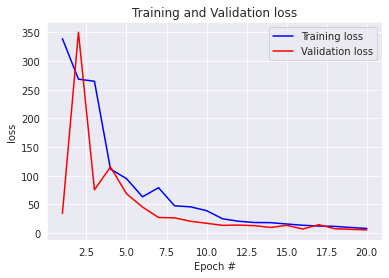

2/2 [==============================] - 0s 5ms/step - loss: 6.0665 - root_mean_squared_error: 2.4630
Model: 259
2/2 [==============================] - 0s 17ms/step - loss: 30.4367 - root_mean_squared_error: 5.5169
MODEL EVALUATION:  [30.4366512298584, 5.516942024230957]


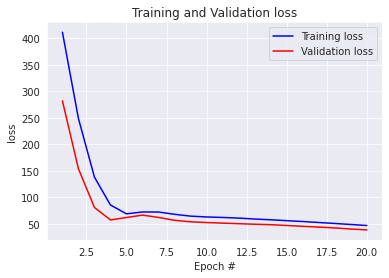

2/2 [==============================] - 0s 8ms/step - loss: 30.4367 - root_mean_squared_error: 5.5169
Model: 260
2/2 [==============================] - 0s 7ms/step - loss: 42.9357 - root_mean_squared_error: 6.5525
MODEL EVALUATION:  [42.93572235107422, 6.552535533905029]


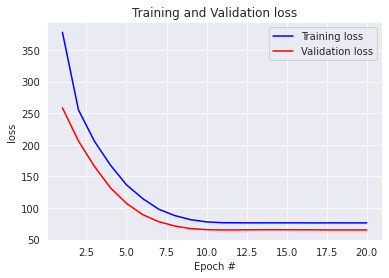

2/2 [==============================] - 0s 12ms/step - loss: 42.9357 - root_mean_squared_error: 6.5525
Model: 261
2/2 [==============================] - 0s 7ms/step - loss: 42.5858 - root_mean_squared_error: 6.5258
MODEL EVALUATION:  [42.585811614990234, 6.525780200958252]


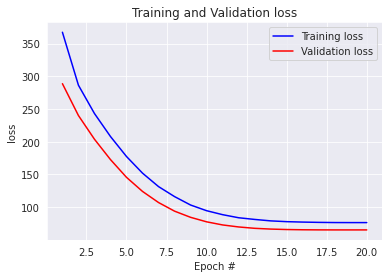

2/2 [==============================] - 0s 8ms/step - loss: 42.5858 - root_mean_squared_error: 6.5258
Model: 262
2/2 [==============================] - 0s 14ms/step - loss: 28.7870 - root_mean_squared_error: 5.3653
MODEL EVALUATION:  [28.78697395324707, 5.365349292755127]


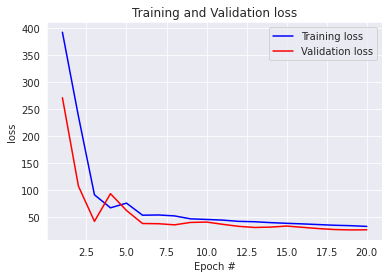

2/2 [==============================] - 0s 12ms/step - loss: 28.7870 - root_mean_squared_error: 5.3653
Model: 263
2/2 [==============================] - 0s 14ms/step - loss: 12.5442 - root_mean_squared_error: 3.5418
MODEL EVALUATION:  [12.544204711914062, 3.5417797565460205]


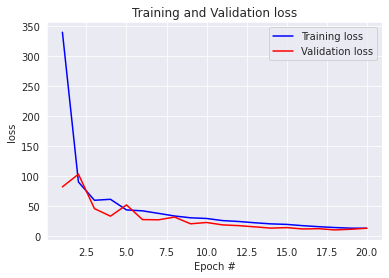

2/2 [==============================] - 0s 8ms/step - loss: 12.5442 - root_mean_squared_error: 3.5418
Model: 264
2/2 [==============================] - 0s 20ms/step - loss: 13.7738 - root_mean_squared_error: 3.7113
MODEL EVALUATION:  [13.7738037109375, 3.7113075256347656]


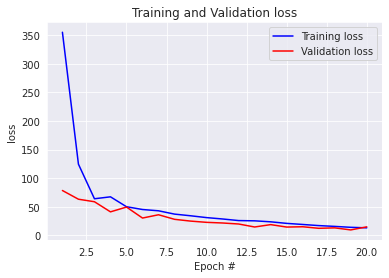

2/2 [==============================] - 0s 12ms/step - loss: 13.7738 - root_mean_squared_error: 3.7113
Model: 265
2/2 [==============================] - 0s 8ms/step - loss: 10.1063 - root_mean_squared_error: 3.1790
MODEL EVALUATION:  [10.106285095214844, 3.1790385246276855]


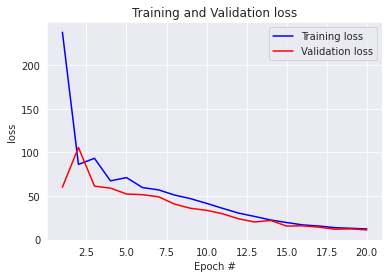

2/2 [==============================] - 0s 5ms/step - loss: 10.1063 - root_mean_squared_error: 3.1790
Model: 266
2/2 [==============================] - 0s 11ms/step - loss: 42.9146 - root_mean_squared_error: 6.5509
MODEL EVALUATION:  [42.914642333984375, 6.550926685333252]


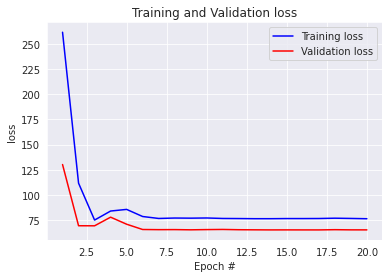

2/2 [==============================] - 0s 7ms/step - loss: 42.9146 - root_mean_squared_error: 6.5509
Model: 267
2/2 [==============================] - 0s 8ms/step - loss: 42.7212 - root_mean_squared_error: 6.5361
MODEL EVALUATION:  [42.7211799621582, 6.536144256591797]


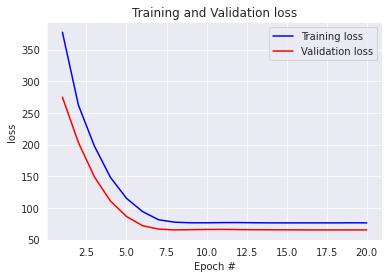

2/2 [==============================] - 0s 10ms/step - loss: 42.7212 - root_mean_squared_error: 6.5361
Model: 268
2/2 [==============================] - 0s 7ms/step - loss: 15.6956 - root_mean_squared_error: 3.9618
MODEL EVALUATION:  [15.695624351501465, 3.9617702960968018]


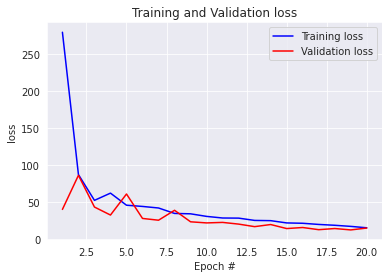

2/2 [==============================] - 0s 9ms/step - loss: 15.6956 - root_mean_squared_error: 3.9618
Model: 269
2/2 [==============================] - 0s 5ms/step - loss: 6.8456 - root_mean_squared_error: 2.6164
MODEL EVALUATION:  [6.845614910125732, 2.61641263961792]


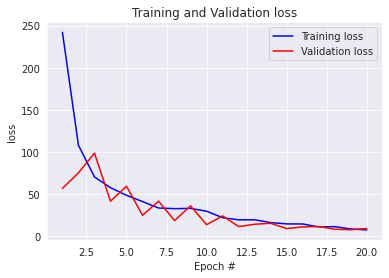

2/2 [==============================] - 0s 19ms/step - loss: 6.8456 - root_mean_squared_error: 2.6164
Model: 270
2/2 [==============================] - 0s 7ms/step - loss: 5.9117 - root_mean_squared_error: 2.4314
MODEL EVALUATION:  [5.911655902862549, 2.431389808654785]


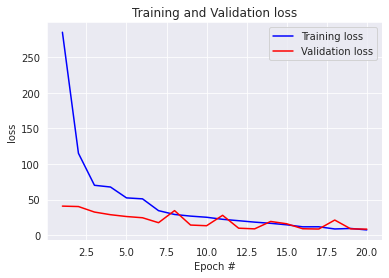

2/2 [==============================] - 0s 10ms/step - loss: 5.9117 - root_mean_squared_error: 2.4314
Model: 271
2/2 [==============================] - 0s 11ms/step - loss: 90.6186 - root_mean_squared_error: 9.5194
MODEL EVALUATION:  [90.61858367919922, 9.519379615783691]


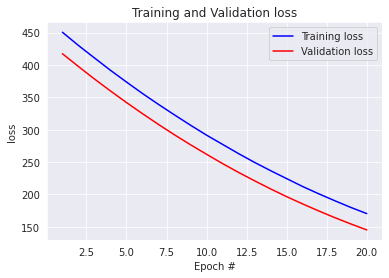

2/2 [==============================] - 0s 5ms/step - loss: 90.6186 - root_mean_squared_error: 9.5194
Model: 272
2/2 [==============================] - 0s 9ms/step - loss: 83.2569 - root_mean_squared_error: 9.1245
MODEL EVALUATION:  [83.25688934326172, 9.124521255493164]


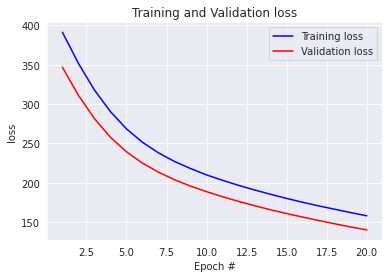

2/2 [==============================] - 0s 10ms/step - loss: 83.2569 - root_mean_squared_error: 9.1245
Model: 273
2/2 [==============================] - 0s 16ms/step - loss: 151.3179 - root_mean_squared_error: 12.3011
MODEL EVALUATION:  [151.3179168701172, 12.301135063171387]


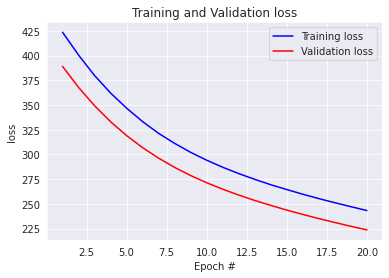

2/2 [==============================] - 0s 7ms/step - loss: 151.3179 - root_mean_squared_error: 12.3011
Model: 274
2/2 [==============================] - 0s 13ms/step - loss: 62.0433 - root_mean_squared_error: 7.8768
MODEL EVALUATION:  [62.043251037597656, 7.876753807067871]


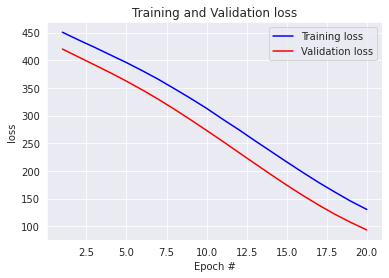

2/2 [==============================] - 0s 9ms/step - loss: 62.0433 - root_mean_squared_error: 7.8768
Model: 275
2/2 [==============================] - 0s 17ms/step - loss: 38.0295 - root_mean_squared_error: 6.1668
MODEL EVALUATION:  [38.029502868652344, 6.166806221008301]


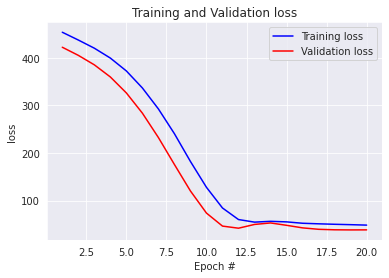

2/2 [==============================] - 0s 5ms/step - loss: 38.0295 - root_mean_squared_error: 6.1668
Model: 276
2/2 [==============================] - 0s 4ms/step - loss: 35.3884 - root_mean_squared_error: 5.9488
MODEL EVALUATION:  [35.388404846191406, 5.94881534576416]


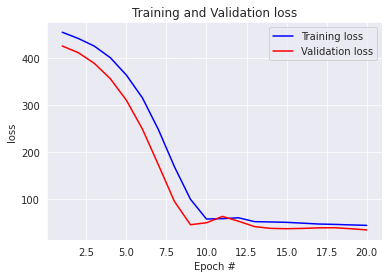

2/2 [==============================] - 0s 4ms/step - loss: 35.3884 - root_mean_squared_error: 5.9488
Model: 277
2/2 [==============================] - 0s 5ms/step - loss: 317.0707 - root_mean_squared_error: 17.8065
MODEL EVALUATION:  [317.0707092285156, 17.80647850036621]


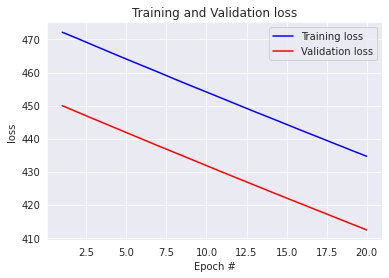

2/2 [==============================] - 0s 10ms/step - loss: 317.0707 - root_mean_squared_error: 17.8065
Model: 278
2/2 [==============================] - 0s 17ms/step - loss: 285.8554 - root_mean_squared_error: 16.9073
MODEL EVALUATION:  [285.85540771484375, 16.907258987426758]


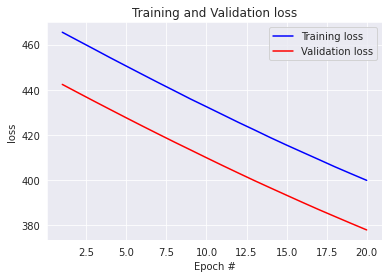

2/2 [==============================] - 0s 16ms/step - loss: 285.8554 - root_mean_squared_error: 16.9073
Model: 279
2/2 [==============================] - 0s 8ms/step - loss: 326.1137 - root_mean_squared_error: 18.0586
MODEL EVALUATION:  [326.11370849609375, 18.058618545532227]


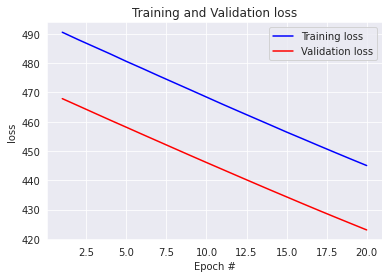

2/2 [==============================] - 0s 8ms/step - loss: 326.1137 - root_mean_squared_error: 18.0586
Model: 280
2/2 [==============================] - 0s 8ms/step - loss: 303.8951 - root_mean_squared_error: 17.4326
MODEL EVALUATION:  [303.8951110839844, 17.432588577270508]


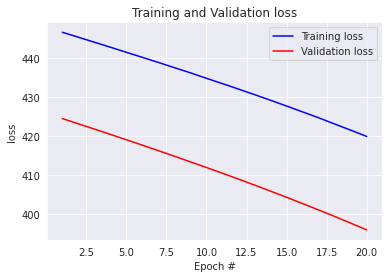

2/2 [==============================] - 0s 6ms/step - loss: 303.8951 - root_mean_squared_error: 17.4326
Model: 281
2/2 [==============================] - 0s 15ms/step - loss: 304.4985 - root_mean_squared_error: 17.4499
MODEL EVALUATION:  [304.4985046386719, 17.44988441467285]


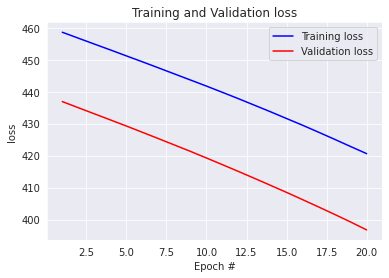

2/2 [==============================] - 0s 6ms/step - loss: 304.4985 - root_mean_squared_error: 17.4499
Model: 282
2/2 [==============================] - 0s 8ms/step - loss: 287.5674 - root_mean_squared_error: 16.9578
MODEL EVALUATION:  [287.5673828125, 16.95781135559082]


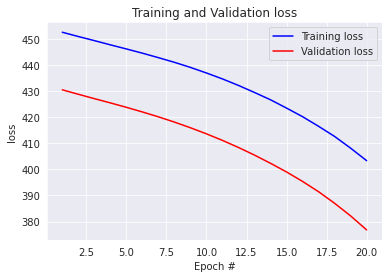

2/2 [==============================] - 0s 8ms/step - loss: 287.5674 - root_mean_squared_error: 16.9578
Model: 283
2/2 [==============================] - 0s 9ms/step - loss: 296.7394 - root_mean_squared_error: 17.2261
MODEL EVALUATION:  [296.7394104003906, 17.226125717163086]


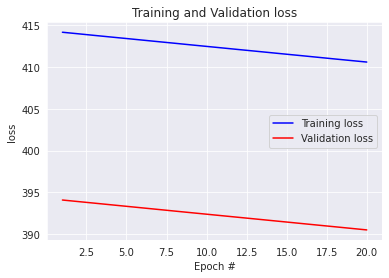

2/2 [==============================] - 0s 4ms/step - loss: 296.7394 - root_mean_squared_error: 17.2261
Model: 284
2/2 [==============================] - 0s 8ms/step - loss: 338.9754 - root_mean_squared_error: 18.4113
MODEL EVALUATION:  [338.97540283203125, 18.411285400390625]


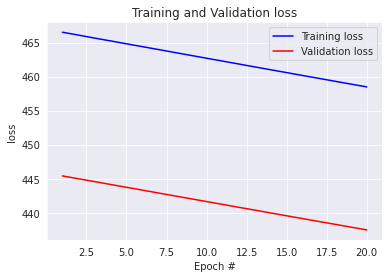

2/2 [==============================] - 0s 10ms/step - loss: 338.9754 - root_mean_squared_error: 18.4113
Model: 285
2/2 [==============================] - 0s 11ms/step - loss: 315.4927 - root_mean_squared_error: 17.7621
MODEL EVALUATION:  [315.49273681640625, 17.762115478515625]


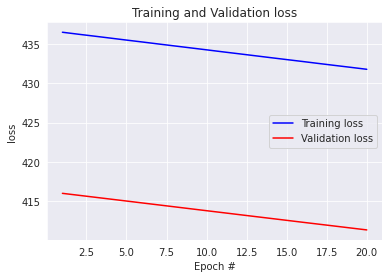

2/2 [==============================] - 0s 11ms/step - loss: 315.4927 - root_mean_squared_error: 17.7621
Model: 286
2/2 [==============================] - 0s 17ms/step - loss: 337.7267 - root_mean_squared_error: 18.3773
MODEL EVALUATION:  [337.7266540527344, 18.37734031677246]


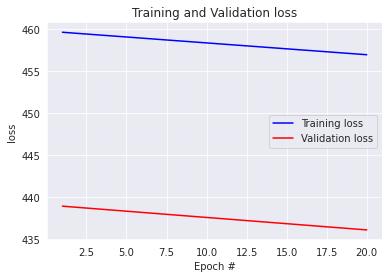

2/2 [==============================] - 0s 7ms/step - loss: 337.7267 - root_mean_squared_error: 18.3773
Model: 287
2/2 [==============================] - 0s 9ms/step - loss: 335.4166 - root_mean_squared_error: 18.3144
MODEL EVALUATION:  [335.4165954589844, 18.314382553100586]


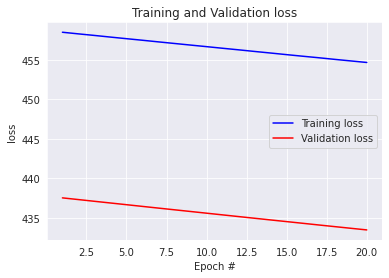

2/2 [==============================] - 0s 23ms/step - loss: 335.4166 - root_mean_squared_error: 18.3144
Model: 288
2/2 [==============================] - 0s 17ms/step - loss: 331.7292 - root_mean_squared_error: 18.2134
MODEL EVALUATION:  [331.729248046875, 18.213436126708984]


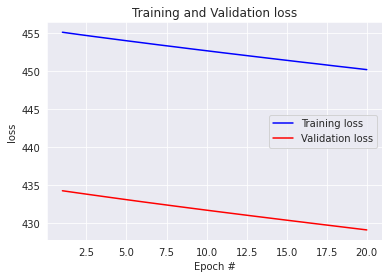

2/2 [==============================] - 0s 8ms/step - loss: 331.7292 - root_mean_squared_error: 18.2134
Model: 289
2/2 [==============================] - 0s 8ms/step - loss: 15.4268 - root_mean_squared_error: 3.3151
MODEL EVALUATION:  [15.4268217086792, 3.315053701400757]


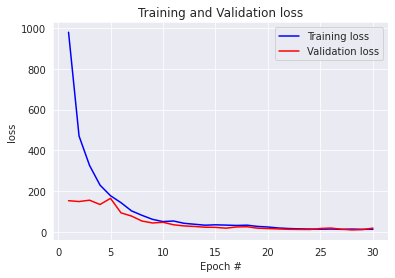

2/2 [==============================] - 0s 9ms/step - loss: 15.4268 - root_mean_squared_error: 3.3151
Model: 290
2/2 [==============================] - 0s 9ms/step - loss: 215.2572 - root_mean_squared_error: 6.7363
MODEL EVALUATION:  [215.25721740722656, 6.736324310302734]


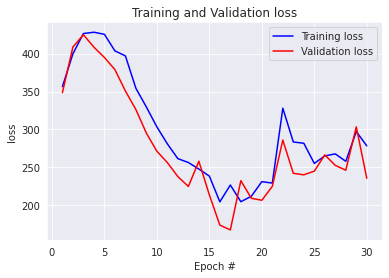

2/2 [==============================] - 0s 7ms/step - loss: 215.2572 - root_mean_squared_error: 6.7363
Model: 291
2/2 [==============================] - 0s 12ms/step - loss: 98.5894 - root_mean_squared_error: 6.8388
MODEL EVALUATION:  [98.58939361572266, 6.838771343231201]


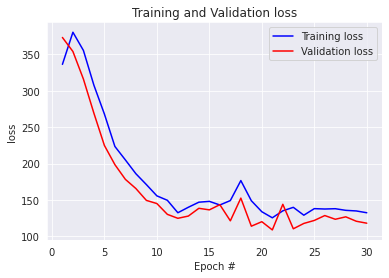

2/2 [==============================] - 0s 11ms/step - loss: 98.5894 - root_mean_squared_error: 6.8388
Model: 292
2/2 [==============================] - 0s 7ms/step - loss: 95.5110 - root_mean_squared_error: 6.5683
MODEL EVALUATION:  [95.51100158691406, 6.568349361419678]


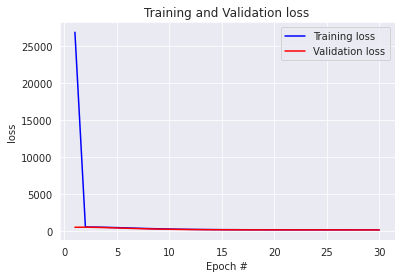

2/2 [==============================] - 0s 7ms/step - loss: 95.5110 - root_mean_squared_error: 6.5683
Model: 293
2/2 [==============================] - 0s 8ms/step - loss: 246.9074 - root_mean_squared_error: 6.4544
MODEL EVALUATION:  [246.9074249267578, 6.454366683959961]


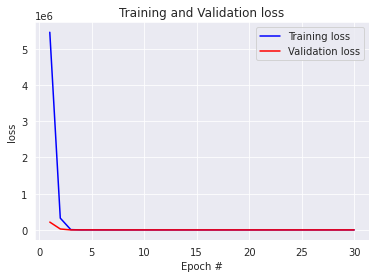

2/2 [==============================] - 0s 6ms/step - loss: 246.9074 - root_mean_squared_error: 6.4544
Model: 294
2/2 [==============================] - 0s 5ms/step - loss: 672.8843 - root_mean_squared_error: 20.0524
MODEL EVALUATION:  [672.8843383789062, 20.052448272705078]


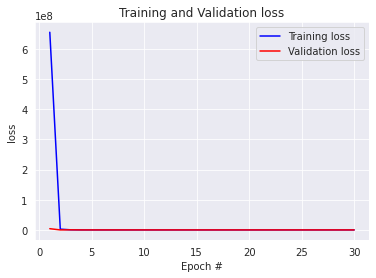

2/2 [==============================] - 0s 15ms/step - loss: 672.8843 - root_mean_squared_error: 20.0524
Model: 295
2/2 [==============================] - 0s 11ms/step - loss: 5.8409 - root_mean_squared_error: 1.7477
MODEL EVALUATION:  [5.840949058532715, 1.7477279901504517]


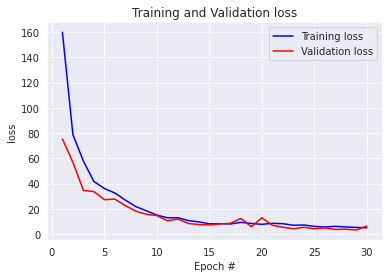

2/2 [==============================] - 0s 7ms/step - loss: 5.8409 - root_mean_squared_error: 1.7477
Model: 296
2/2 [==============================] - 0s 8ms/step - loss: 17.9001 - root_mean_squared_error: 1.8303
MODEL EVALUATION:  [17.900142669677734, 1.8302680253982544]


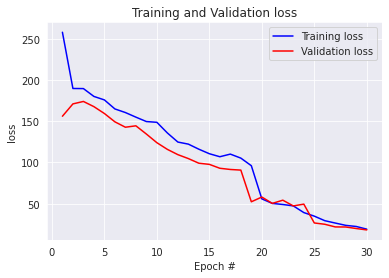

2/2 [==============================] - 0s 8ms/step - loss: 17.9001 - root_mean_squared_error: 1.8303
Model: 297
2/2 [==============================] - 0s 9ms/step - loss: 59.6776 - root_mean_squared_error: 6.6087
MODEL EVALUATION:  [59.67756271362305, 6.608745574951172]


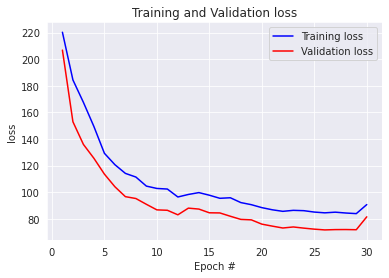

2/2 [==============================] - 0s 8ms/step - loss: 59.6776 - root_mean_squared_error: 6.6087
Model: 298
2/2 [==============================] - 0s 19ms/step - loss: 3.5866 - root_mean_squared_error: 0.9432
MODEL EVALUATION:  [3.586623430252075, 0.9432372450828552]


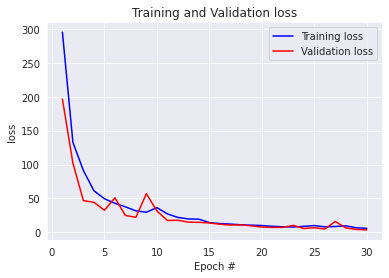

2/2 [==============================] - 0s 6ms/step - loss: 3.5866 - root_mean_squared_error: 0.9432
Model: 299
2/2 [==============================] - 0s 12ms/step - loss: 54.4195 - root_mean_squared_error: 1.2376
MODEL EVALUATION:  [54.41954803466797, 1.2376495599746704]


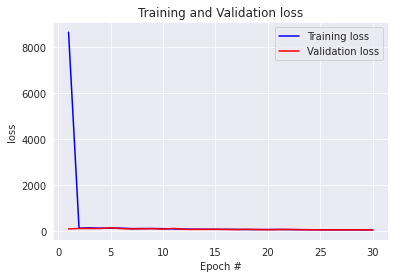

2/2 [==============================] - 0s 8ms/step - loss: 54.4195 - root_mean_squared_error: 1.2376
Model: 300
2/2 [==============================] - 0s 8ms/step - loss: 73.3092 - root_mean_squared_error: 1.4835
MODEL EVALUATION:  [73.3092041015625, 1.4834877252578735]


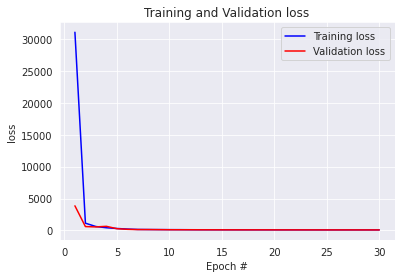

2/2 [==============================] - 0s 9ms/step - loss: 73.3092 - root_mean_squared_error: 1.4835
Model: 301
2/2 [==============================] - 0s 4ms/step - loss: 6.0827 - root_mean_squared_error: 1.4501
MODEL EVALUATION:  [6.082691192626953, 1.4501315355300903]


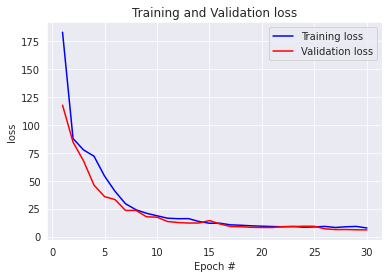

2/2 [==============================] - 0s 11ms/step - loss: 6.0827 - root_mean_squared_error: 1.4501
Model: 302
2/2 [==============================] - 0s 14ms/step - loss: 8.6670 - root_mean_squared_error: 1.3590
MODEL EVALUATION:  [8.666985511779785, 1.3589755296707153]


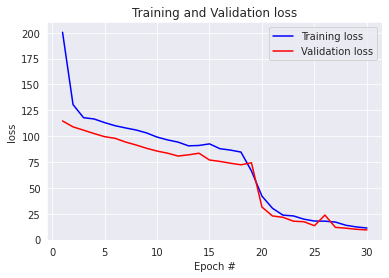

2/2 [==============================] - 0s 7ms/step - loss: 8.6670 - root_mean_squared_error: 1.3590
Model: 303
2/2 [==============================] - 0s 10ms/step - loss: 45.8263 - root_mean_squared_error: 6.5289
MODEL EVALUATION:  [45.82625198364258, 6.528944492340088]


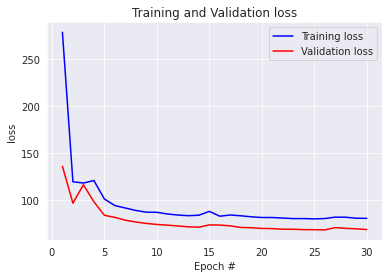

2/2 [==============================] - 0s 9ms/step - loss: 45.8263 - root_mean_squared_error: 6.5289
Model: 304
2/2 [==============================] - 0s 18ms/step - loss: 2.5802 - root_mean_squared_error: 0.9815
MODEL EVALUATION:  [2.580174684524536, 0.9815166592597961]


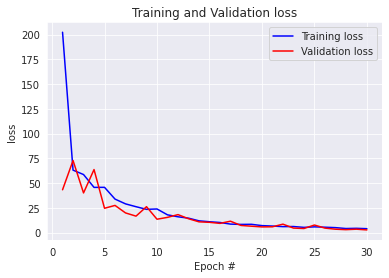

2/2 [==============================] - 0s 10ms/step - loss: 2.5802 - root_mean_squared_error: 0.9815
Model: 305
2/2 [==============================] - 0s 8ms/step - loss: 4.1086 - root_mean_squared_error: 0.8499
MODEL EVALUATION:  [4.1085896492004395, 0.849896252155304]


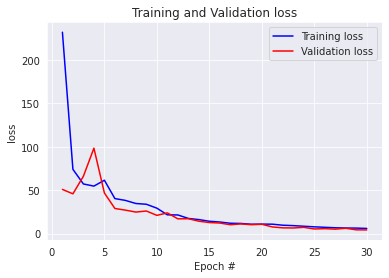

2/2 [==============================] - 0s 9ms/step - loss: 4.1086 - root_mean_squared_error: 0.8499
Model: 306
2/2 [==============================] - 0s 10ms/step - loss: 18.7722 - root_mean_squared_error: 2.8339
MODEL EVALUATION:  [18.772174835205078, 2.8338630199432373]


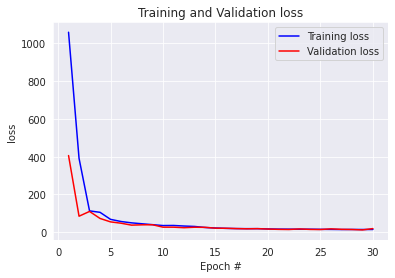

2/2 [==============================] - 0s 6ms/step - loss: 18.7722 - root_mean_squared_error: 2.8339
Model: 307
2/2 [==============================] - 0s 17ms/step - loss: 23.6553 - root_mean_squared_error: 4.3202
MODEL EVALUATION:  [23.655315399169922, 4.320186138153076]


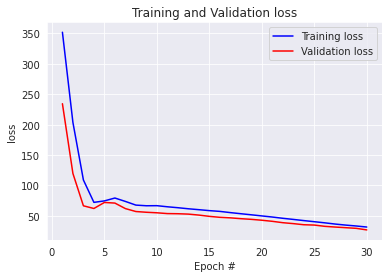

2/2 [==============================] - 0s 15ms/step - loss: 23.6553 - root_mean_squared_error: 4.3202
Model: 308
2/2 [==============================] - 0s 23ms/step - loss: 41.6956 - root_mean_squared_error: 6.0793
MODEL EVALUATION:  [41.695587158203125, 6.079328536987305]


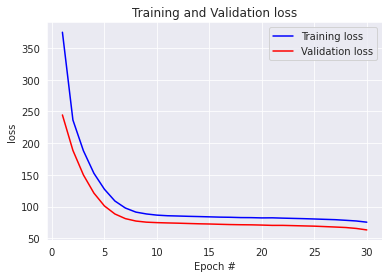

2/2 [==============================] - 0s 6ms/step - loss: 41.6956 - root_mean_squared_error: 6.0793
Model: 309
2/2 [==============================] - 0s 10ms/step - loss: 45.0769 - root_mean_squared_error: 6.5424
MODEL EVALUATION:  [45.0768928527832, 6.5423583984375]


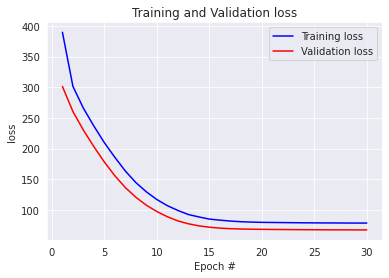

2/2 [==============================] - 0s 6ms/step - loss: 45.0769 - root_mean_squared_error: 6.5424
Model: 310
2/2 [==============================] - 0s 9ms/step - loss: 19.1240 - root_mean_squared_error: 4.1124
MODEL EVALUATION:  [19.12401008605957, 4.1123785972595215]


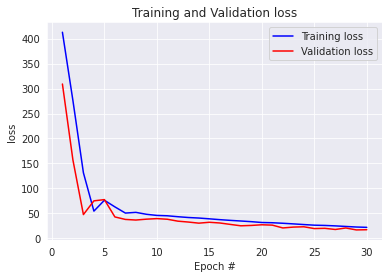

2/2 [==============================] - 0s 10ms/step - loss: 19.1240 - root_mean_squared_error: 4.1124
Model: 311
2/2 [==============================] - 0s 5ms/step - loss: 9.2836 - root_mean_squared_error: 2.3550
MODEL EVALUATION:  [9.283585548400879, 2.355044364929199]


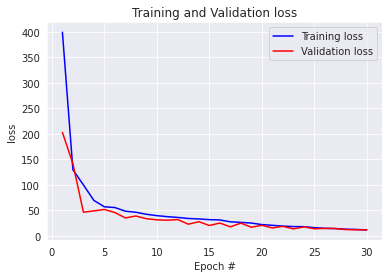

2/2 [==============================] - 0s 6ms/step - loss: 9.2836 - root_mean_squared_error: 2.3550
Model: 312
2/2 [==============================] - 0s 13ms/step - loss: 7.0625 - root_mean_squared_error: 1.6421
MODEL EVALUATION:  [7.062549591064453, 1.6420680284500122]


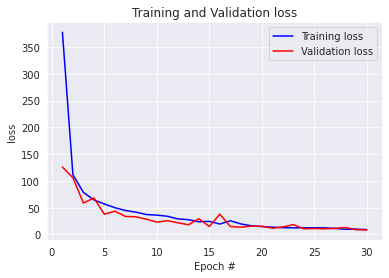

2/2 [==============================] - 0s 9ms/step - loss: 7.0625 - root_mean_squared_error: 1.6421
Model: 313
2/2 [==============================] - 0s 15ms/step - loss: 11.2099 - root_mean_squared_error: 2.4661
MODEL EVALUATION:  [11.209881782531738, 2.4660792350769043]


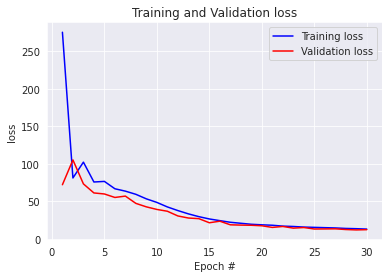

2/2 [==============================] - 0s 8ms/step - loss: 11.2099 - root_mean_squared_error: 2.4661
Model: 314
2/2 [==============================] - 0s 9ms/step - loss: 12.6652 - root_mean_squared_error: 2.3009
MODEL EVALUATION:  [12.665194511413574, 2.300853967666626]


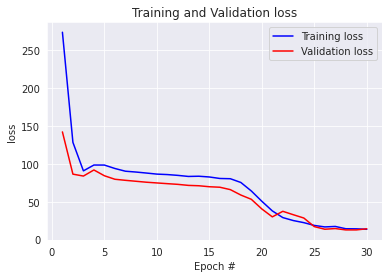

2/2 [==============================] - 0s 9ms/step - loss: 12.6652 - root_mean_squared_error: 2.3009
Model: 315
2/2 [==============================] - 0s 10ms/step - loss: 44.2795 - root_mean_squared_error: 6.5213
MODEL EVALUATION:  [44.279502868652344, 6.521265506744385]


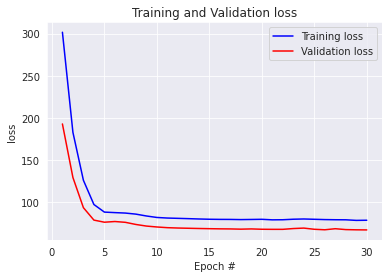

2/2 [==============================] - 0s 8ms/step - loss: 44.2795 - root_mean_squared_error: 6.5213
Model: 316
2/2 [==============================] - 0s 8ms/step - loss: 8.5944 - root_mean_squared_error: 2.5296
MODEL EVALUATION:  [8.594440460205078, 2.529590368270874]


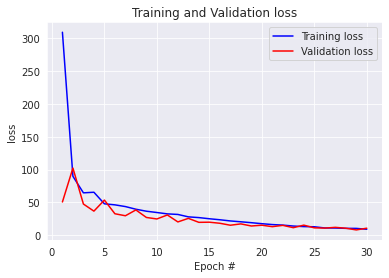

2/2 [==============================] - 0s 8ms/step - loss: 8.5944 - root_mean_squared_error: 2.5296
Model: 317
2/2 [==============================] - 0s 9ms/step - loss: 4.7937 - root_mean_squared_error: 1.2113
MODEL EVALUATION:  [4.793661117553711, 1.2112842798233032]


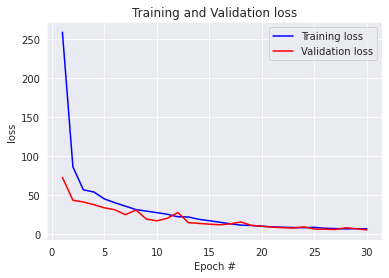

2/2 [==============================] - 0s 13ms/step - loss: 4.7937 - root_mean_squared_error: 1.2113
Model: 318
2/2 [==============================] - 0s 16ms/step - loss: 7.0720 - root_mean_squared_error: 1.8735
MODEL EVALUATION:  [7.07196044921875, 1.8734970092773438]


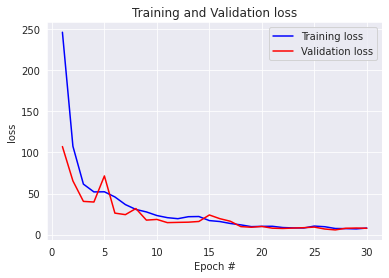

2/2 [==============================] - 0s 8ms/step - loss: 7.0720 - root_mean_squared_error: 1.8735
Model: 319
2/2 [==============================] - 0s 6ms/step - loss: 47.3829 - root_mean_squared_error: 6.6933
MODEL EVALUATION:  [47.382850646972656, 6.69334077835083]


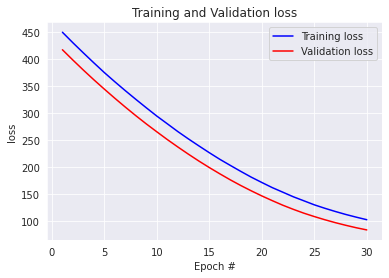

2/2 [==============================] - 0s 8ms/step - loss: 47.3829 - root_mean_squared_error: 6.6933
Model: 320
2/2 [==============================] - 0s 12ms/step - loss: 74.1127 - root_mean_squared_error: 8.0483
MODEL EVALUATION:  [74.1126937866211, 8.048324584960938]


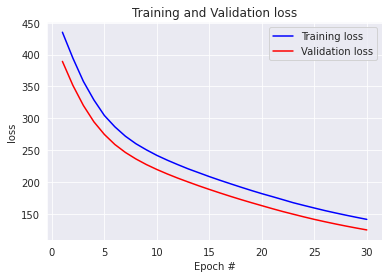

2/2 [==============================] - 0s 10ms/step - loss: 74.1127 - root_mean_squared_error: 8.0483
Model: 321
2/2 [==============================] - 0s 12ms/step - loss: 141.8192 - root_mean_squared_error: 11.5215
MODEL EVALUATION:  [141.8192138671875, 11.521531105041504]


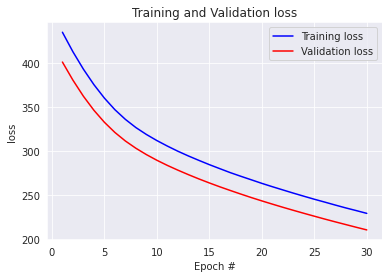

2/2 [==============================] - 0s 6ms/step - loss: 141.8192 - root_mean_squared_error: 11.5215
Model: 322
2/2 [==============================] - 0s 9ms/step - loss: 41.5712 - root_mean_squared_error: 6.2884
MODEL EVALUATION:  [41.57118225097656, 6.2884345054626465]


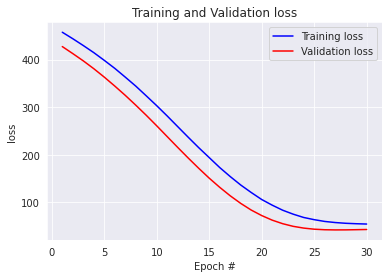

2/2 [==============================] - 0s 8ms/step - loss: 41.5712 - root_mean_squared_error: 6.2884
Model: 323
2/2 [==============================] - 0s 6ms/step - loss: 34.5273 - root_mean_squared_error: 5.4119
MODEL EVALUATION:  [34.52732467651367, 5.4119439125061035]


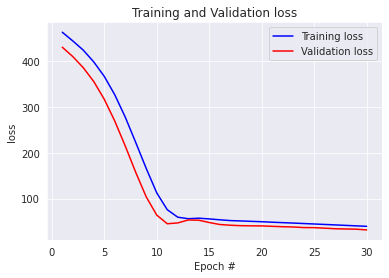

2/2 [==============================] - 0s 8ms/step - loss: 34.5273 - root_mean_squared_error: 5.4119
Model: 324
2/2 [==============================] - 0s 12ms/step - loss: 31.5356 - root_mean_squared_error: 5.0865
MODEL EVALUATION:  [31.535593032836914, 5.086491584777832]


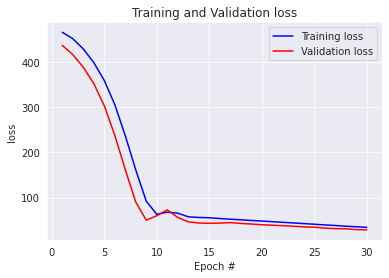

2/2 [==============================] - 0s 9ms/step - loss: 31.5356 - root_mean_squared_error: 5.0865
Model: 325
2/2 [==============================] - 0s 12ms/step - loss: 286.8897 - root_mean_squared_error: 16.8835
MODEL EVALUATION:  [286.88970947265625, 16.88352394104004]


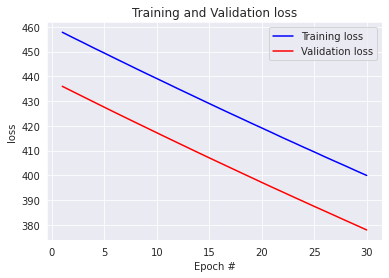

2/2 [==============================] - 0s 8ms/step - loss: 286.8897 - root_mean_squared_error: 16.8835
Model: 326
2/2 [==============================] - 0s 10ms/step - loss: 297.8999 - root_mean_squared_error: 16.9928
MODEL EVALUATION:  [297.8999328613281, 16.992843627929688]


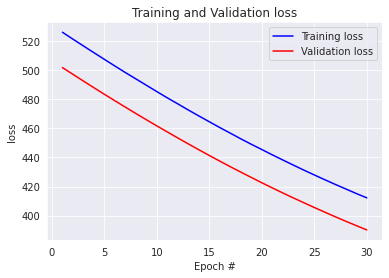

2/2 [==============================] - 0s 9ms/step - loss: 297.8999 - root_mean_squared_error: 16.9928
Model: 327
2/2 [==============================] - 0s 17ms/step - loss: 316.2588 - root_mean_squared_error: 17.4585
MODEL EVALUATION:  [316.2588195800781, 17.458547592163086]


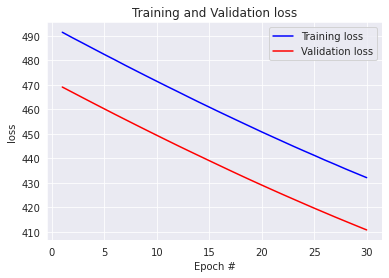

2/2 [==============================] - 0s 12ms/step - loss: 316.2588 - root_mean_squared_error: 17.4585
Model: 328
2/2 [==============================] - 0s 15ms/step - loss: 308.6720 - root_mean_squared_error: 17.5189
MODEL EVALUATION:  [308.6720275878906, 17.51889991760254]


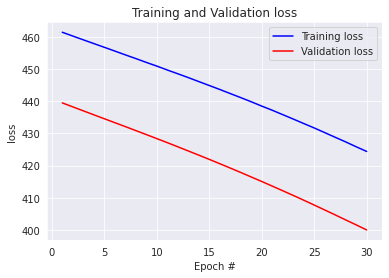

2/2 [==============================] - 0s 13ms/step - loss: 308.6720 - root_mean_squared_error: 17.5189
Model: 329
2/2 [==============================] - 0s 17ms/step - loss: 277.4469 - root_mean_squared_error: 16.4060
MODEL EVALUATION:  [277.4468994140625, 16.40597915649414]


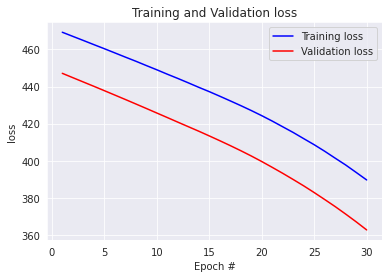

2/2 [==============================] - 0s 8ms/step - loss: 277.4469 - root_mean_squared_error: 16.4060
Model: 330
2/2 [==============================] - 0s 8ms/step - loss: 249.5148 - root_mean_squared_error: 15.4600
MODEL EVALUATION:  [249.5148468017578, 15.46003532409668]


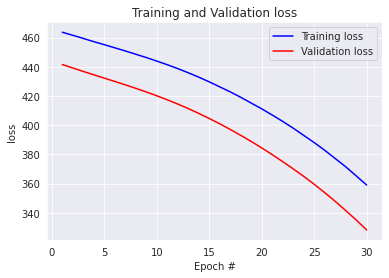

2/2 [==============================] - 0s 9ms/step - loss: 249.5148 - root_mean_squared_error: 15.4600
Model: 331
2/2 [==============================] - 0s 8ms/step - loss: 321.9864 - root_mean_squared_error: 17.8921
MODEL EVALUATION:  [321.9864196777344, 17.892078399658203]


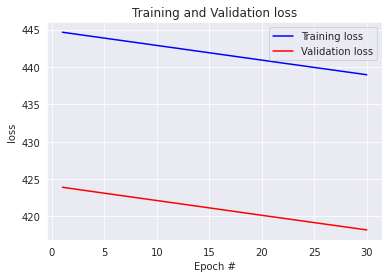

2/2 [==============================] - 0s 6ms/step - loss: 321.9864 - root_mean_squared_error: 17.8921
Model: 332
2/2 [==============================] - 0s 15ms/step - loss: 281.7952 - root_mean_squared_error: 16.5141
MODEL EVALUATION:  [281.795166015625, 16.51409149169922]


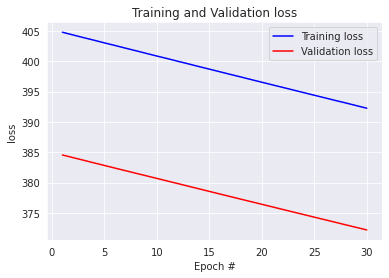

2/2 [==============================] - 0s 9ms/step - loss: 281.7952 - root_mean_squared_error: 16.5141
Model: 333
2/2 [==============================] - 0s 9ms/step - loss: 315.1523 - root_mean_squared_error: 17.4200
MODEL EVALUATION:  [315.15234375, 17.419960021972656]


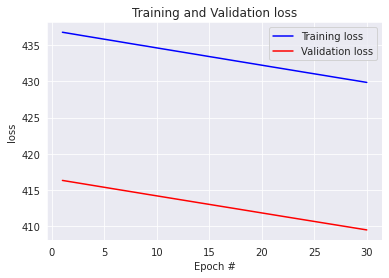

2/2 [==============================] - 0s 6ms/step - loss: 315.1523 - root_mean_squared_error: 17.4200
Model: 334
2/2 [==============================] - 0s 10ms/step - loss: 335.6474 - root_mean_squared_error: 18.2722
MODEL EVALUATION:  [335.6473693847656, 18.272245407104492]


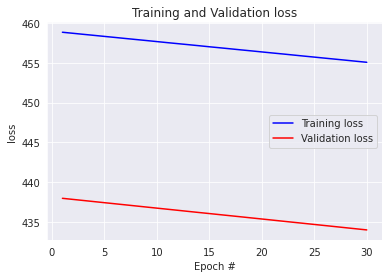

2/2 [==============================] - 0s 8ms/step - loss: 335.6474 - root_mean_squared_error: 18.2722
Model: 335
2/2 [==============================] - 0s 9ms/step - loss: 336.3562 - root_mean_squared_error: 18.0928
MODEL EVALUATION:  [336.356201171875, 18.092796325683594]


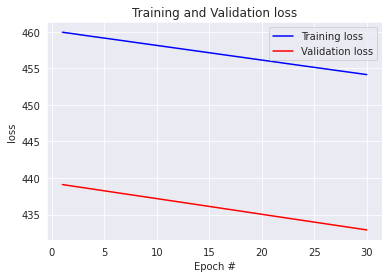

2/2 [==============================] - 0s 6ms/step - loss: 336.3562 - root_mean_squared_error: 18.0928
Model: 336
2/2 [==============================] - 0s 8ms/step - loss: 342.6176 - root_mean_squared_error: 18.1978
MODEL EVALUATION:  [342.6175537109375, 18.19783592224121]


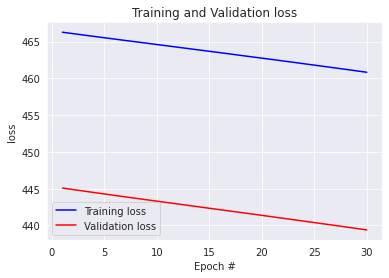

2/2 [==============================] - 0s 9ms/step - loss: 342.6176 - root_mean_squared_error: 18.1978
Model: 337
2/2 [==============================] - 0s 9ms/step - loss: 8.0152 - root_mean_squared_error: 2.1405
MODEL EVALUATION:  [8.01515007019043, 2.1405460834503174]


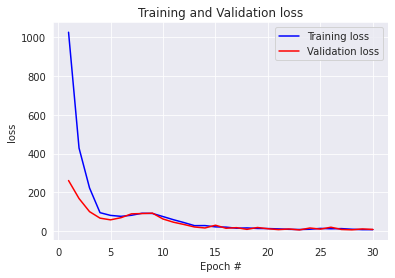

2/2 [==============================] - 0s 5ms/step - loss: 8.0152 - root_mean_squared_error: 2.1405
Model: 338
2/2 [==============================] - 0s 14ms/step - loss: 129.0074 - root_mean_squared_error: 6.8477
MODEL EVALUATION:  [129.00743103027344, 6.847666263580322]


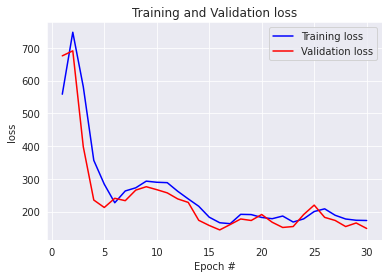

2/2 [==============================] - 0s 7ms/step - loss: 129.0074 - root_mean_squared_error: 6.8477
Model: 339
2/2 [==============================] - 0s 18ms/step - loss: 48.8149 - root_mean_squared_error: 6.3731
MODEL EVALUATION:  [48.81486892700195, 6.373124122619629]


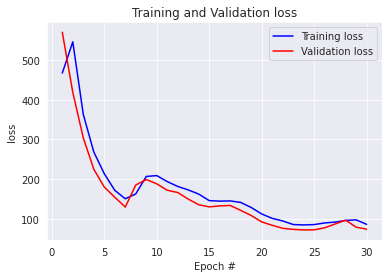

2/2 [==============================] - 0s 8ms/step - loss: 48.8149 - root_mean_squared_error: 6.3731
Model: 340
2/2 [==============================] - 0s 6ms/step - loss: 113.0390 - root_mean_squared_error: 2.9221
MODEL EVALUATION:  [113.03897094726562, 2.92213773727417]


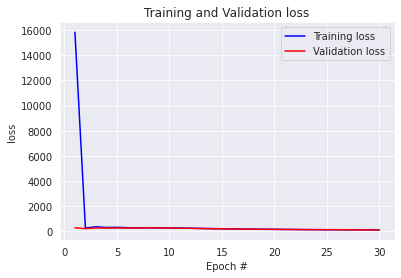

2/2 [==============================] - 0s 8ms/step - loss: 113.0390 - root_mean_squared_error: 2.9221
Model: 341
2/2 [==============================] - 0s 14ms/step - loss: 1233.2246 - root_mean_squared_error: 15.6845
MODEL EVALUATION:  [1233.224609375, 15.684473037719727]


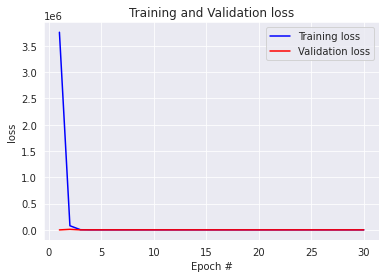

2/2 [==============================] - 0s 9ms/step - loss: 1233.2246 - root_mean_squared_error: 15.6845
Model: 342
2/2 [==============================] - 0s 9ms/step - loss: 2265.8298 - root_mean_squared_error: 21.2836
MODEL EVALUATION:  [2265.829833984375, 21.283580780029297]


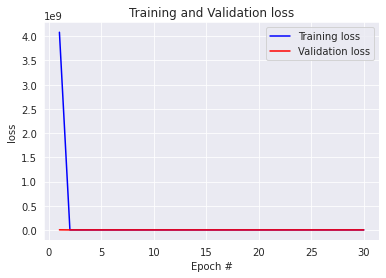

2/2 [==============================] - 0s 8ms/step - loss: 2265.8298 - root_mean_squared_error: 21.2836
Model: 343
2/2 [==============================] - 0s 5ms/step - loss: 5.7913 - root_mean_squared_error: 1.4540
MODEL EVALUATION:  [5.79133939743042, 1.454037070274353]


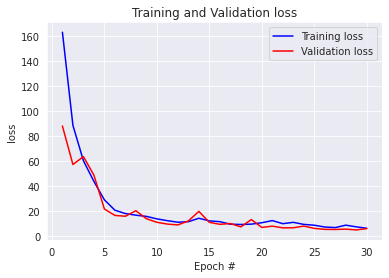

2/2 [==============================] - 0s 8ms/step - loss: 5.7913 - root_mean_squared_error: 1.4540
Model: 344
2/2 [==============================] - 0s 8ms/step - loss: 9.0600 - root_mean_squared_error: 1.9629
MODEL EVALUATION:  [9.059969902038574, 1.962891697883606]


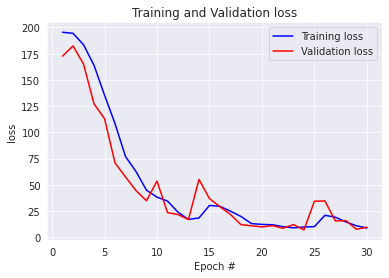

2/2 [==============================] - 0s 8ms/step - loss: 9.0600 - root_mean_squared_error: 1.9629
Model: 345
2/2 [==============================] - 0s 11ms/step - loss: 41.6017 - root_mean_squared_error: 6.3778
MODEL EVALUATION:  [41.60170364379883, 6.377816677093506]


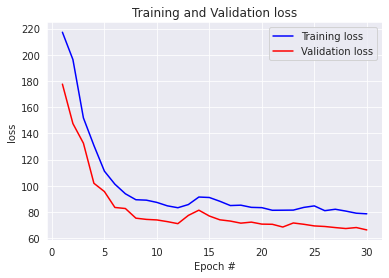

2/2 [==============================] - 0s 8ms/step - loss: 41.6017 - root_mean_squared_error: 6.3778
Model: 346
2/2 [==============================] - 0s 14ms/step - loss: 3.9415 - root_mean_squared_error: 1.4035
MODEL EVALUATION:  [3.9415078163146973, 1.4034793376922607]


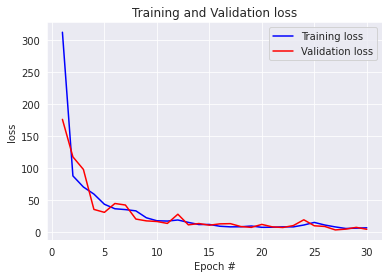

2/2 [==============================] - 0s 5ms/step - loss: 3.9415 - root_mean_squared_error: 1.4035
Model: 347
2/2 [==============================] - 0s 8ms/step - loss: 86.4866 - root_mean_squared_error: 1.2872
MODEL EVALUATION:  [86.4865951538086, 1.2872238159179688]


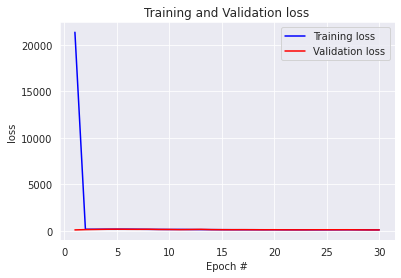

2/2 [==============================] - 0s 5ms/step - loss: 86.4866 - root_mean_squared_error: 1.2872
Model: 348
2/2 [==============================] - 0s 8ms/step - loss: 170.5045 - root_mean_squared_error: 7.0714
MODEL EVALUATION:  [170.5045166015625, 7.071369171142578]


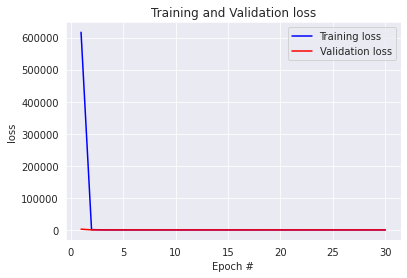

2/2 [==============================] - 0s 4ms/step - loss: 170.5045 - root_mean_squared_error: 7.0714
Model: 349
2/2 [==============================] - 0s 11ms/step - loss: 8.1302 - root_mean_squared_error: 1.6024
MODEL EVALUATION:  [8.130189895629883, 1.6023836135864258]


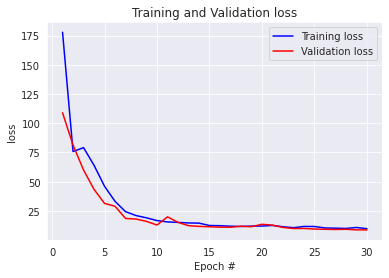

2/2 [==============================] - 0s 6ms/step - loss: 8.1302 - root_mean_squared_error: 1.6024
Model: 350
2/2 [==============================] - 0s 10ms/step - loss: 7.5563 - root_mean_squared_error: 1.3924
MODEL EVALUATION:  [7.556300163269043, 1.3923540115356445]


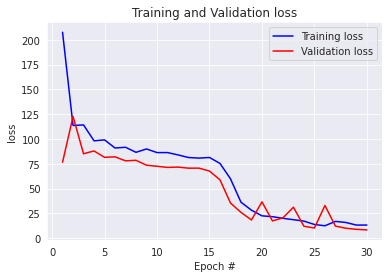

2/2 [==============================] - 0s 8ms/step - loss: 7.5563 - root_mean_squared_error: 1.3924
Model: 351
2/2 [==============================] - 0s 8ms/step - loss: 42.9352 - root_mean_squared_error: 6.5284
MODEL EVALUATION:  [42.935150146484375, 6.5283918380737305]


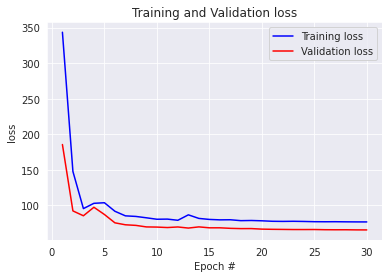

2/2 [==============================] - 0s 9ms/step - loss: 42.9352 - root_mean_squared_error: 6.5284
Model: 352
2/2 [==============================] - 0s 17ms/step - loss: 4.7197 - root_mean_squared_error: 1.8131
MODEL EVALUATION:  [4.7197346687316895, 1.8130862712860107]


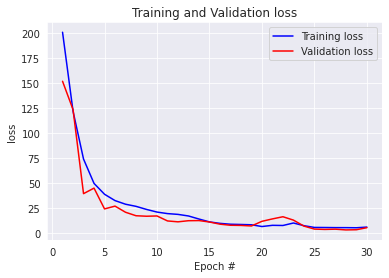

2/2 [==============================] - 0s 9ms/step - loss: 4.7197 - root_mean_squared_error: 1.8131
Model: 353
2/2 [==============================] - 0s 12ms/step - loss: 6.8564 - root_mean_squared_error: 1.6868
MODEL EVALUATION:  [6.856439590454102, 1.6868451833724976]


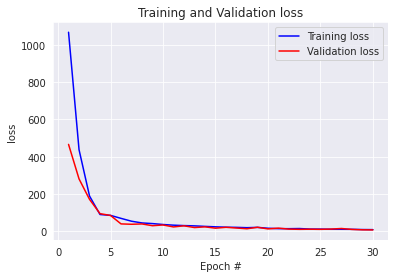

2/2 [==============================] - 0s 8ms/step - loss: 6.8564 - root_mean_squared_error: 1.6868
Model: 354
2/2 [==============================] - 0s 19ms/step - loss: 3.0693 - root_mean_squared_error: 1.2989
MODEL EVALUATION:  [3.0693328380584717, 1.2988600730895996]


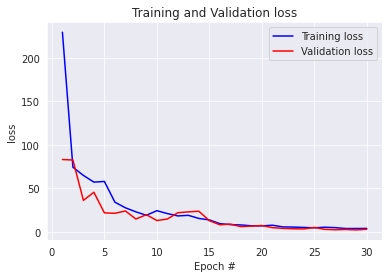

2/2 [==============================] - 0s 9ms/step - loss: 3.0693 - root_mean_squared_error: 1.2989
Model: 355
2/2 [==============================] - 0s 9ms/step - loss: 25.5090 - root_mean_squared_error: 4.7816
MODEL EVALUATION:  [25.509048461914062, 4.781557083129883]


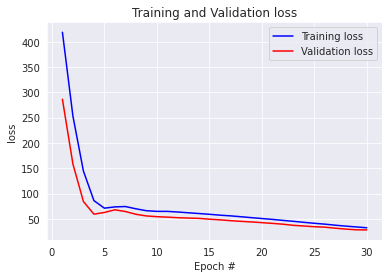

2/2 [==============================] - 0s 21ms/step - loss: 25.5090 - root_mean_squared_error: 4.7816
Model: 356
2/2 [==============================] - 0s 10ms/step - loss: 41.0693 - root_mean_squared_error: 6.3066
MODEL EVALUATION:  [41.06926345825195, 6.306612968444824]


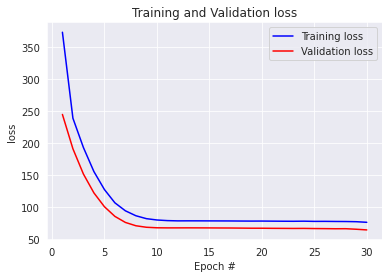

2/2 [==============================] - 0s 8ms/step - loss: 41.0693 - root_mean_squared_error: 6.3066
Model: 357
2/2 [==============================] - 0s 8ms/step - loss: 43.0341 - root_mean_squared_error: 6.5000
MODEL EVALUATION:  [43.03413391113281, 6.500024795532227]


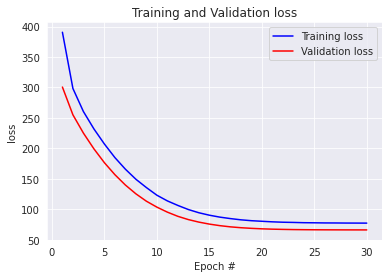

2/2 [==============================] - 0s 6ms/step - loss: 43.0341 - root_mean_squared_error: 6.5000
Model: 358
2/2 [==============================] - 0s 15ms/step - loss: 17.2571 - root_mean_squared_error: 4.0457
MODEL EVALUATION:  [17.257144927978516, 4.045723915100098]


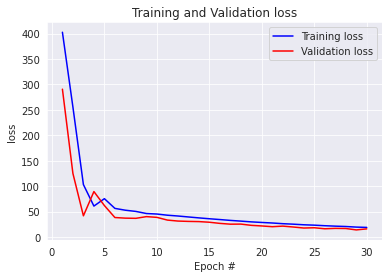

2/2 [==============================] - 0s 4ms/step - loss: 17.2571 - root_mean_squared_error: 4.0457
Model: 359
2/2 [==============================] - 0s 14ms/step - loss: 5.6986 - root_mean_squared_error: 2.1483
MODEL EVALUATION:  [5.698556423187256, 2.1483006477355957]


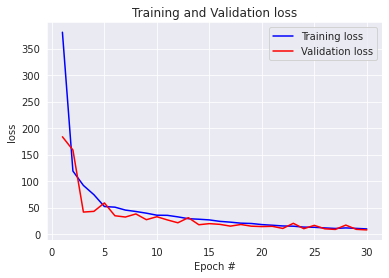

2/2 [==============================] - 0s 5ms/step - loss: 5.6986 - root_mean_squared_error: 2.1483
Model: 360
2/2 [==============================] - 0s 9ms/step - loss: 3.2159 - root_mean_squared_error: 1.4930
MODEL EVALUATION:  [3.2159414291381836, 1.493021845817566]


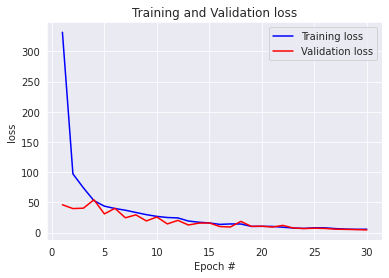

2/2 [==============================] - 0s 8ms/step - loss: 3.2159 - root_mean_squared_error: 1.4930
Model: 361
2/2 [==============================] - 0s 8ms/step - loss: 12.7364 - root_mean_squared_error: 2.7421
MODEL EVALUATION:  [12.736366271972656, 2.74212908744812]


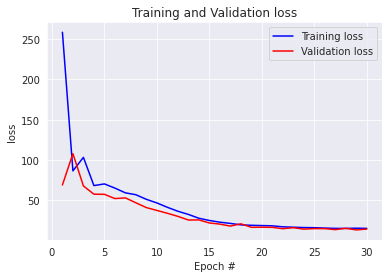

2/2 [==============================] - 0s 9ms/step - loss: 12.7364 - root_mean_squared_error: 2.7421
Model: 362
2/2 [==============================] - 0s 12ms/step - loss: 10.3213 - root_mean_squared_error: 2.0581
MODEL EVALUATION:  [10.321322441101074, 2.058074474334717]


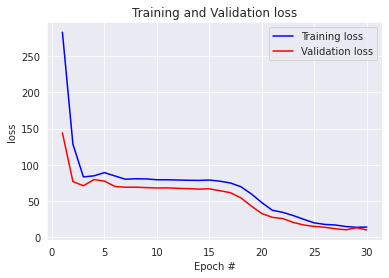

2/2 [==============================] - 0s 8ms/step - loss: 10.3213 - root_mean_squared_error: 2.0581
Model: 363
2/2 [==============================] - 0s 16ms/step - loss: 44.2486 - root_mean_squared_error: 6.6147
MODEL EVALUATION:  [44.24864959716797, 6.614674091339111]


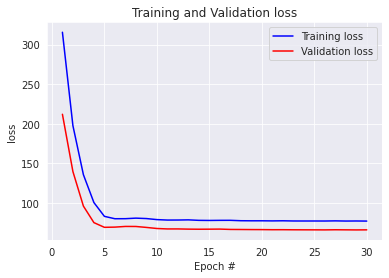

2/2 [==============================] - 0s 8ms/step - loss: 44.2486 - root_mean_squared_error: 6.6147
Model: 364
2/2 [==============================] - 0s 7ms/step - loss: 8.0706 - root_mean_squared_error: 2.6079
MODEL EVALUATION:  [8.070582389831543, 2.6078693866729736]


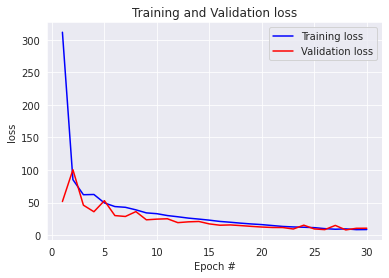

2/2 [==============================] - 0s 8ms/step - loss: 8.0706 - root_mean_squared_error: 2.6079
Model: 365
2/2 [==============================] - 0s 14ms/step - loss: 4.6422 - root_mean_squared_error: 1.9151
MODEL EVALUATION:  [4.642220973968506, 1.915066123008728]


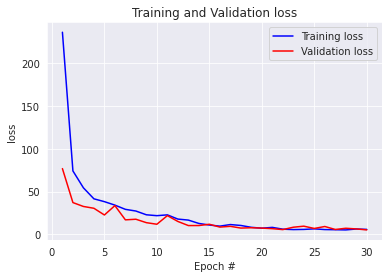

2/2 [==============================] - 0s 12ms/step - loss: 4.6422 - root_mean_squared_error: 1.9151
Model: 366
2/2 [==============================] - 0s 8ms/step - loss: 3.1192 - root_mean_squared_error: 1.4544
MODEL EVALUATION:  [3.1191697120666504, 1.4543743133544922]


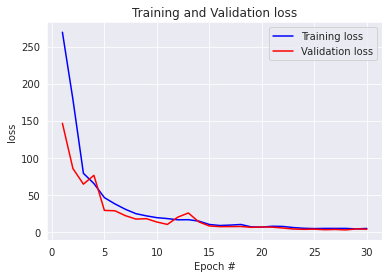

2/2 [==============================] - 0s 5ms/step - loss: 3.1192 - root_mean_squared_error: 1.4544
Model: 367
2/2 [==============================] - 0s 18ms/step - loss: 56.1441 - root_mean_squared_error: 7.4522
MODEL EVALUATION:  [56.14411544799805, 7.452165126800537]


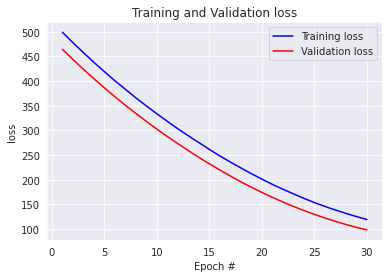

2/2 [==============================] - 0s 10ms/step - loss: 56.1441 - root_mean_squared_error: 7.4522
Model: 368
2/2 [==============================] - 0s 5ms/step - loss: 50.5097 - root_mean_squared_error: 7.0025
MODEL EVALUATION:  [50.509735107421875, 7.002532958984375]


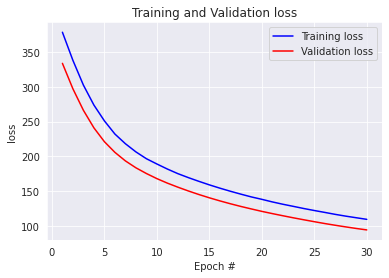

2/2 [==============================] - 0s 8ms/step - loss: 50.5097 - root_mean_squared_error: 7.0025
Model: 369
2/2 [==============================] - 0s 7ms/step - loss: 173.3984 - root_mean_squared_error: 13.1017
MODEL EVALUATION:  [173.39837646484375, 13.101716995239258]


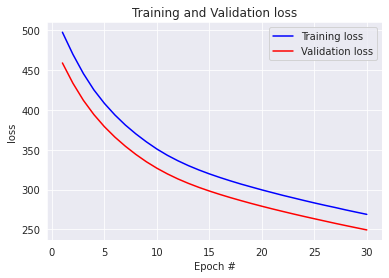

2/2 [==============================] - 0s 7ms/step - loss: 173.3984 - root_mean_squared_error: 13.1017
Model: 370
2/2 [==============================] - 0s 14ms/step - loss: 37.3675 - root_mean_squared_error: 6.0753
MODEL EVALUATION:  [37.36750411987305, 6.075324058532715]


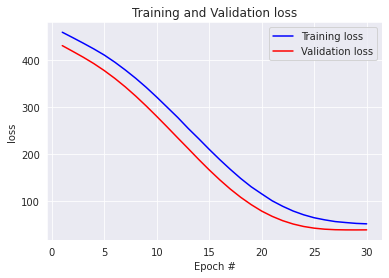

2/2 [==============================] - 0s 8ms/step - loss: 37.3675 - root_mean_squared_error: 6.0753
Model: 371
2/2 [==============================] - 0s 8ms/step - loss: 34.4239 - root_mean_squared_error: 5.7850
MODEL EVALUATION:  [34.4239387512207, 5.784965515136719]


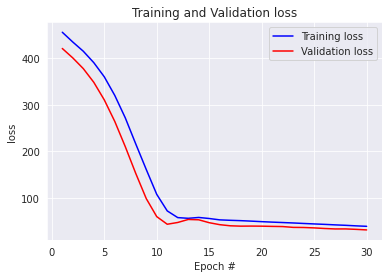

2/2 [==============================] - 0s 5ms/step - loss: 34.4239 - root_mean_squared_error: 5.7850
Model: 372
2/2 [==============================] - 0s 9ms/step - loss: 30.5957 - root_mean_squared_error: 5.4377
MODEL EVALUATION:  [30.595712661743164, 5.437707424163818]


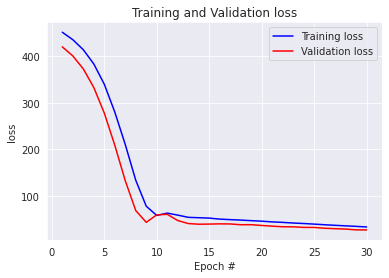

2/2 [==============================] - 0s 13ms/step - loss: 30.5957 - root_mean_squared_error: 5.4377
Model: 373
2/2 [==============================] - 0s 8ms/step - loss: 263.2996 - root_mean_squared_error: 16.2185
MODEL EVALUATION:  [263.2995910644531, 16.218477249145508]


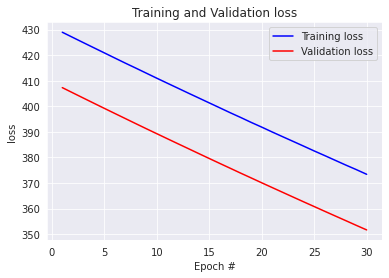

2/2 [==============================] - 0s 9ms/step - loss: 263.2996 - root_mean_squared_error: 16.2185
Model: 374
2/2 [==============================] - 0s 9ms/step - loss: 265.3723 - root_mean_squared_error: 16.2556
MODEL EVALUATION:  [265.372314453125, 16.25559425354004]


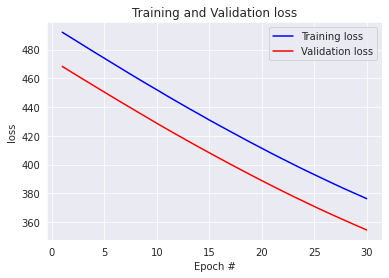

2/2 [==============================] - 0s 9ms/step - loss: 265.3723 - root_mean_squared_error: 16.2556
Model: 375
2/2 [==============================] - 0s 11ms/step - loss: 265.6264 - root_mean_squared_error: 16.2502
MODEL EVALUATION:  [265.6264343261719, 16.250219345092773]


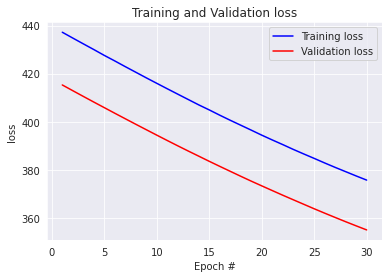

2/2 [==============================] - 0s 4ms/step - loss: 265.6264 - root_mean_squared_error: 16.2502
Model: 376
2/2 [==============================] - 0s 20ms/step - loss: 299.4084 - root_mean_squared_error: 17.2966
MODEL EVALUATION:  [299.408447265625, 17.29656982421875]


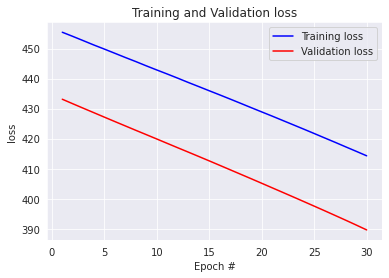

2/2 [==============================] - 0s 9ms/step - loss: 299.4084 - root_mean_squared_error: 17.2966
Model: 377
2/2 [==============================] - 0s 14ms/step - loss: 278.4391 - root_mean_squared_error: 16.6567
MODEL EVALUATION:  [278.4391174316406, 16.656734466552734]


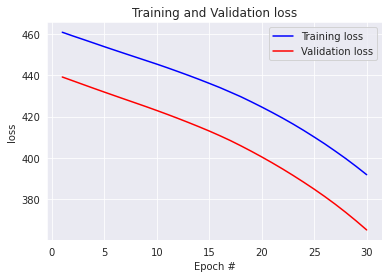

2/2 [==============================] - 0s 8ms/step - loss: 278.4391 - root_mean_squared_error: 16.6567
Model: 378
2/2 [==============================] - 0s 8ms/step - loss: 266.2910 - root_mean_squared_error: 16.2760
MODEL EVALUATION:  [266.2910461425781, 16.27599334716797]


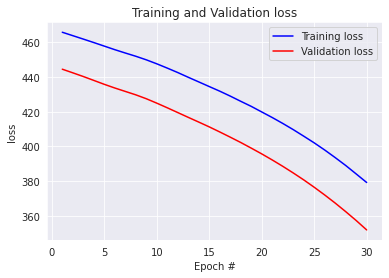

2/2 [==============================] - 0s 6ms/step - loss: 266.2910 - root_mean_squared_error: 16.2760
Model: 379
2/2 [==============================] - 0s 6ms/step - loss: 309.1464 - root_mean_squared_error: 17.5752
MODEL EVALUATION:  [309.1463623046875, 17.57516098022461]


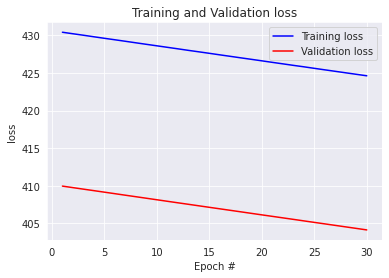

2/2 [==============================] - 0s 8ms/step - loss: 309.1464 - root_mean_squared_error: 17.5752
Model: 380
2/2 [==============================] - 0s 9ms/step - loss: 309.2209 - root_mean_squared_error: 17.5534
MODEL EVALUATION:  [309.220947265625, 17.553396224975586]


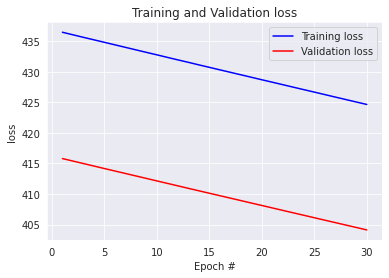

2/2 [==============================] - 0s 9ms/step - loss: 309.2209 - root_mean_squared_error: 17.5534
Model: 381
2/2 [==============================] - 0s 10ms/step - loss: 388.3987 - root_mean_squared_error: 19.6690
MODEL EVALUATION:  [388.3986511230469, 19.668973922729492]


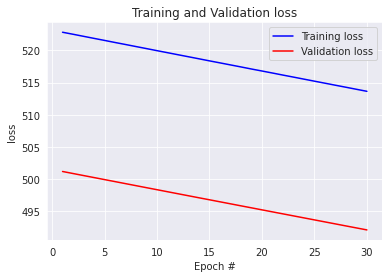

2/2 [==============================] - 0s 5ms/step - loss: 388.3987 - root_mean_squared_error: 19.6690
Model: 382
2/2 [==============================] - 0s 11ms/step - loss: 329.4785 - root_mean_squared_error: 18.1447
MODEL EVALUATION:  [329.478515625, 18.144697189331055]


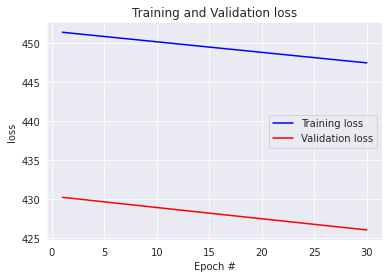

2/2 [==============================] - 0s 9ms/step - loss: 329.4785 - root_mean_squared_error: 18.1447
Model: 383
2/2 [==============================] - 0s 19ms/step - loss: 333.0590 - root_mean_squared_error: 18.2202
MODEL EVALUATION:  [333.0589904785156, 18.220232009887695]


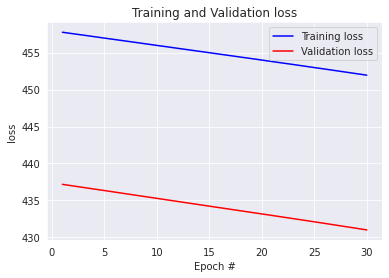

2/2 [==============================] - 0s 13ms/step - loss: 333.0590 - root_mean_squared_error: 18.2202
Model: 384
2/2 [==============================] - 0s 6ms/step - loss: 341.2187 - root_mean_squared_error: 18.4311
MODEL EVALUATION:  [341.2186584472656, 18.43108367919922]


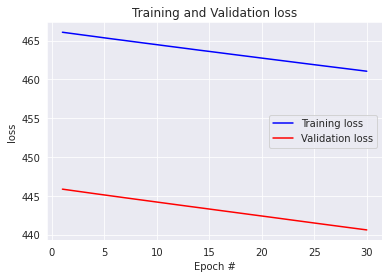

2/2 [==============================] - 0s 8ms/step - loss: 341.2187 - root_mean_squared_error: 18.4311
Model: 385
2/2 [==============================] - 0s 8ms/step - loss: 4.9463 - root_mean_squared_error: 2.2240
MODEL EVALUATION:  [4.946314811706543, 2.2240312099456787]


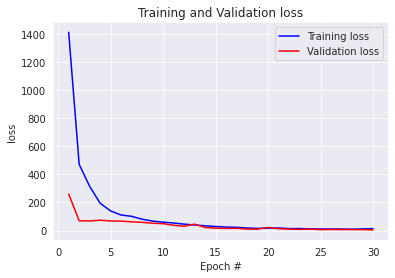

2/2 [==============================] - 0s 8ms/step - loss: 4.9463 - root_mean_squared_error: 2.2240
Model: 386
2/2 [==============================] - 0s 4ms/step - loss: 64.3346 - root_mean_squared_error: 8.0209
MODEL EVALUATION:  [64.33456420898438, 8.020882606506348]


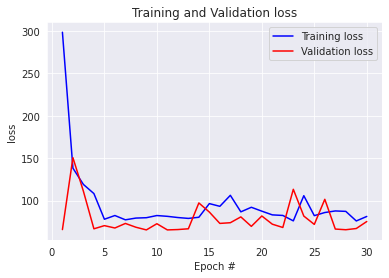

2/2 [==============================] - 0s 5ms/step - loss: 64.3346 - root_mean_squared_error: 8.0209
Model: 387
2/2 [==============================] - 0s 9ms/step - loss: 39.3738 - root_mean_squared_error: 6.2749
MODEL EVALUATION:  [39.37383270263672, 6.274857044219971]


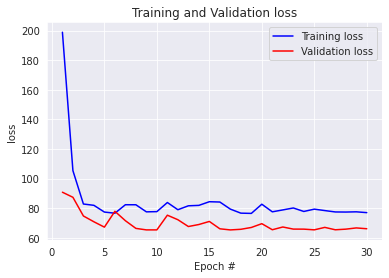

2/2 [==============================] - 0s 9ms/step - loss: 39.3738 - root_mean_squared_error: 6.2749
Model: 388
2/2 [==============================] - 0s 11ms/step - loss: 1.3881 - root_mean_squared_error: 1.1782
MODEL EVALUATION:  [1.388051986694336, 1.1781561374664307]


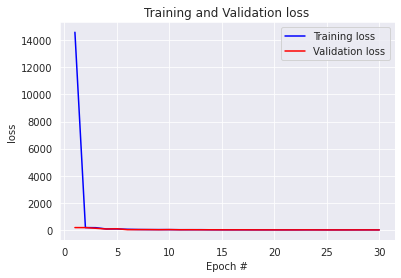

2/2 [==============================] - 0s 5ms/step - loss: 1.3881 - root_mean_squared_error: 1.1782
Model: 389
2/2 [==============================] - 0s 8ms/step - loss: 55.9573 - root_mean_squared_error: 7.4805
MODEL EVALUATION:  [55.95728302001953, 7.480460166931152]


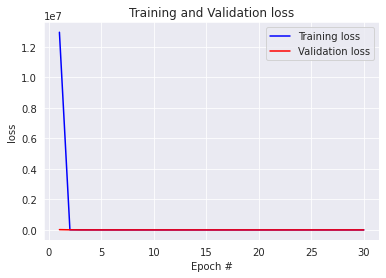

2/2 [==============================] - 0s 9ms/step - loss: 55.9573 - root_mean_squared_error: 7.4805
Model: 390
2/2 [==============================] - 0s 9ms/step - loss: 483.8844 - root_mean_squared_error: 21.9974
MODEL EVALUATION:  [483.8843994140625, 21.997371673583984]


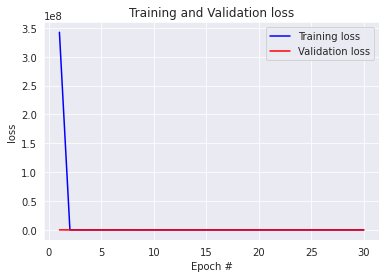

2/2 [==============================] - 0s 6ms/step - loss: 483.8844 - root_mean_squared_error: 21.9974
Model: 391
2/2 [==============================] - 0s 10ms/step - loss: 1.6625 - root_mean_squared_error: 1.2894
MODEL EVALUATION:  [1.6625432968139648, 1.2893965244293213]


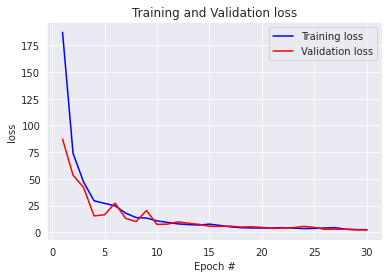

2/2 [==============================] - 0s 8ms/step - loss: 1.6625 - root_mean_squared_error: 1.2894
Model: 392
2/2 [==============================] - 0s 18ms/step - loss: 48.3239 - root_mean_squared_error: 6.9515
MODEL EVALUATION:  [48.323883056640625, 6.9515380859375]


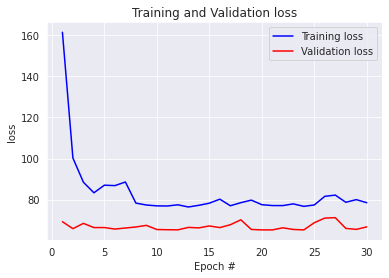

2/2 [==============================] - 0s 7ms/step - loss: 48.3239 - root_mean_squared_error: 6.9515
Model: 393
2/2 [==============================] - 0s 19ms/step - loss: 40.1634 - root_mean_squared_error: 6.3375
MODEL EVALUATION:  [40.16337203979492, 6.337457656860352]


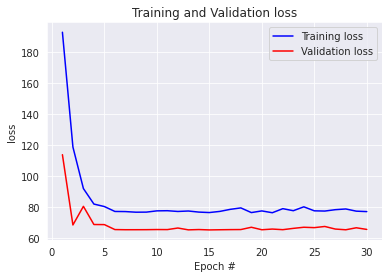

2/2 [==============================] - 0s 11ms/step - loss: 40.1634 - root_mean_squared_error: 6.3375
Model: 394
2/2 [==============================] - 0s 8ms/step - loss: 1.1448 - root_mean_squared_error: 1.0699
MODEL EVALUATION:  [1.1447899341583252, 1.0699485540390015]


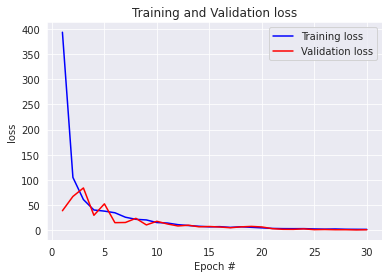

2/2 [==============================] - 0s 8ms/step - loss: 1.1448 - root_mean_squared_error: 1.0699
Model: 395
2/2 [==============================] - 0s 8ms/step - loss: 1.8347 - root_mean_squared_error: 1.3545
MODEL EVALUATION:  [1.8346776962280273, 1.3545026779174805]


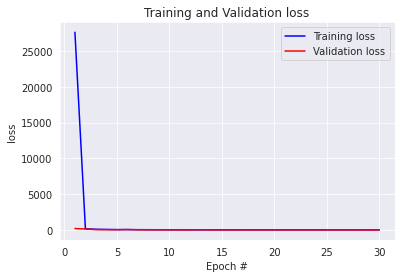

2/2 [==============================] - 0s 7ms/step - loss: 1.8347 - root_mean_squared_error: 1.3545
Model: 396
2/2 [==============================] - 0s 13ms/step - loss: 43.1240 - root_mean_squared_error: 6.5669
MODEL EVALUATION:  [43.123992919921875, 6.566885948181152]


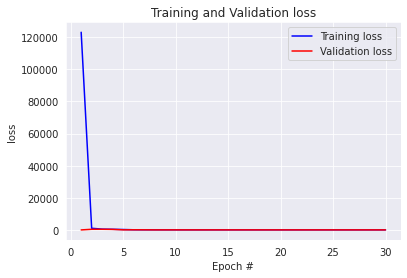

2/2 [==============================] - 0s 9ms/step - loss: 43.1240 - root_mean_squared_error: 6.5669
Model: 397
2/2 [==============================] - 0s 9ms/step - loss: 2.3713 - root_mean_squared_error: 1.5399
MODEL EVALUATION:  [2.3713295459747314, 1.539912223815918]


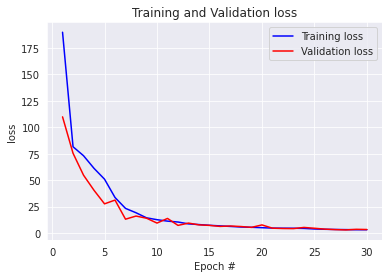

2/2 [==============================] - 0s 7ms/step - loss: 2.3713 - root_mean_squared_error: 1.5399
Model: 398
2/2 [==============================] - 0s 9ms/step - loss: 44.6321 - root_mean_squared_error: 6.6807
MODEL EVALUATION:  [44.63211441040039, 6.680727005004883]


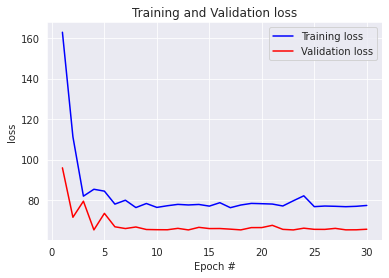

2/2 [==============================] - 0s 8ms/step - loss: 44.6321 - root_mean_squared_error: 6.6807
Model: 399
2/2 [==============================] - 0s 25ms/step - loss: 41.2793 - root_mean_squared_error: 6.4249
MODEL EVALUATION:  [41.27926254272461, 6.424893856048584]


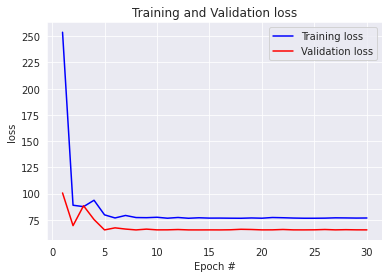

2/2 [==============================] - 0s 8ms/step - loss: 41.2793 - root_mean_squared_error: 6.4249
Model: 400
2/2 [==============================] - 0s 20ms/step - loss: 6.9344 - root_mean_squared_error: 2.6333
MODEL EVALUATION:  [6.934383869171143, 2.633321762084961]


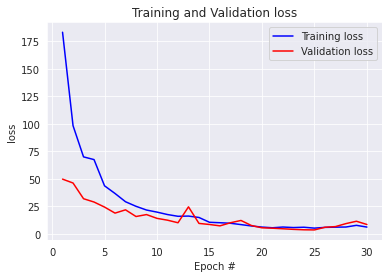

2/2 [==============================] - 0s 10ms/step - loss: 6.9344 - root_mean_squared_error: 2.6333
Model: 401
2/2 [==============================] - 0s 12ms/step - loss: 3.6815 - root_mean_squared_error: 1.9187
MODEL EVALUATION:  [3.6814827919006348, 1.9187190532684326]


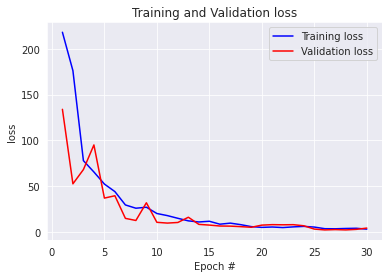

2/2 [==============================] - 0s 6ms/step - loss: 3.6815 - root_mean_squared_error: 1.9187
Model: 402
2/2 [==============================] - 0s 10ms/step - loss: 4.7736 - root_mean_squared_error: 2.1848
MODEL EVALUATION:  [4.773569583892822, 2.184849977493286]


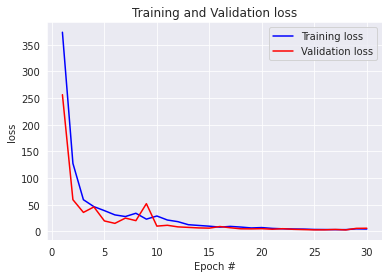

2/2 [==============================] - 0s 10ms/step - loss: 4.7736 - root_mean_squared_error: 2.1848
Model: 403
2/2 [==============================] - 0s 10ms/step - loss: 20.4523 - root_mean_squared_error: 4.5224
MODEL EVALUATION:  [20.45232391357422, 4.522424697875977]


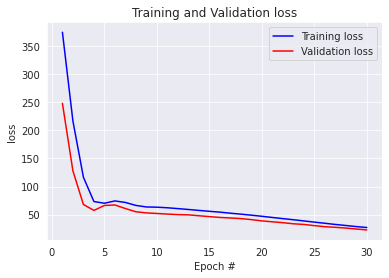

2/2 [==============================] - 0s 8ms/step - loss: 20.4523 - root_mean_squared_error: 4.5224
Model: 404
2/2 [==============================] - 0s 16ms/step - loss: 43.1155 - root_mean_squared_error: 6.5662
MODEL EVALUATION:  [43.115455627441406, 6.5662360191345215]


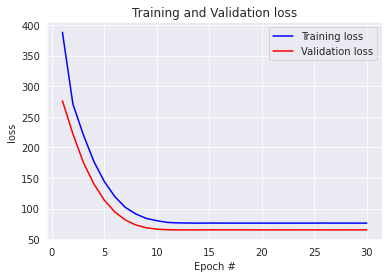

2/2 [==============================] - 0s 8ms/step - loss: 43.1155 - root_mean_squared_error: 6.5662
Model: 405
2/2 [==============================] - 0s 9ms/step - loss: 42.9052 - root_mean_squared_error: 6.5502
MODEL EVALUATION:  [42.905189514160156, 6.550205230712891]


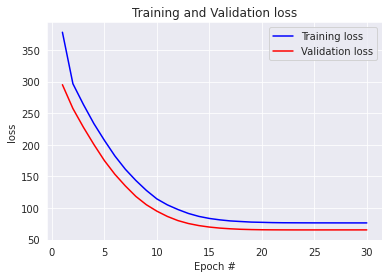

2/2 [==============================] - 0s 13ms/step - loss: 42.9052 - root_mean_squared_error: 6.5502
Model: 406
2/2 [==============================] - 0s 16ms/step - loss: 19.3520 - root_mean_squared_error: 4.3991
MODEL EVALUATION:  [19.35195541381836, 4.399085521697998]


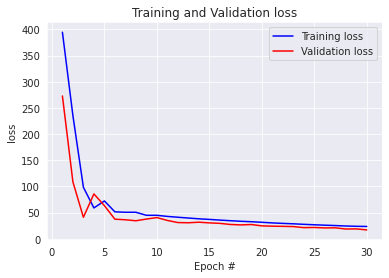

2/2 [==============================] - 0s 6ms/step - loss: 19.3520 - root_mean_squared_error: 4.3991
Model: 407
2/2 [==============================] - 0s 18ms/step - loss: 7.2036 - root_mean_squared_error: 2.6839
MODEL EVALUATION:  [7.203566074371338, 2.683945894241333]


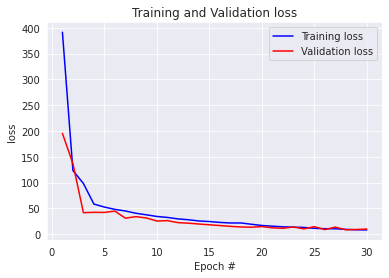

2/2 [==============================] - 0s 7ms/step - loss: 7.2036 - root_mean_squared_error: 2.6839
Model: 408
2/2 [==============================] - 0s 19ms/step - loss: 3.5858 - root_mean_squared_error: 1.8936
MODEL EVALUATION:  [3.585817813873291, 1.8936256170272827]


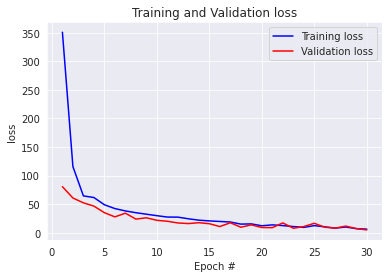

2/2 [==============================] - 0s 8ms/step - loss: 3.5858 - root_mean_squared_error: 1.8936
Model: 409
2/2 [==============================] - 0s 17ms/step - loss: 6.8171 - root_mean_squared_error: 2.6110
MODEL EVALUATION:  [6.8171000480651855, 2.610957622528076]


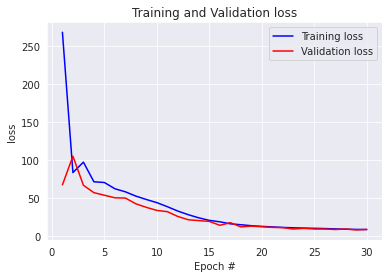

2/2 [==============================] - 0s 7ms/step - loss: 6.8171 - root_mean_squared_error: 2.6110
Model: 410
2/2 [==============================] - 0s 9ms/step - loss: 42.7718 - root_mean_squared_error: 6.5400
MODEL EVALUATION:  [42.77180099487305, 6.54001522064209]


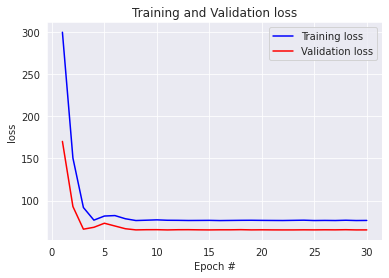

2/2 [==============================] - 0s 7ms/step - loss: 42.7718 - root_mean_squared_error: 6.5400
Model: 411
2/2 [==============================] - 0s 20ms/step - loss: 44.2809 - root_mean_squared_error: 6.6544
MODEL EVALUATION:  [44.2808952331543, 6.654388904571533]


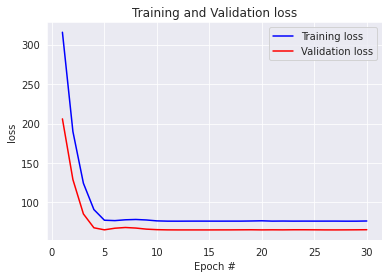

2/2 [==============================] - 0s 8ms/step - loss: 44.2809 - root_mean_squared_error: 6.6544
Model: 412
2/2 [==============================] - 0s 6ms/step - loss: 9.0836 - root_mean_squared_error: 3.0139
MODEL EVALUATION:  [9.083627700805664, 3.0139057636260986]


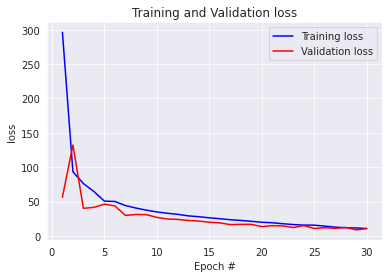

2/2 [==============================] - 0s 8ms/step - loss: 9.0836 - root_mean_squared_error: 3.0139
Model: 413
2/2 [==============================] - 0s 8ms/step - loss: 1.5247 - root_mean_squared_error: 1.2348
MODEL EVALUATION:  [1.5246777534484863, 1.2347784042358398]


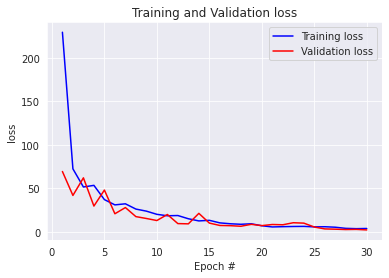

2/2 [==============================] - 0s 8ms/step - loss: 1.5247 - root_mean_squared_error: 1.2348
Model: 414
2/2 [==============================] - 0s 8ms/step - loss: 2.3089 - root_mean_squared_error: 1.5195
MODEL EVALUATION:  [2.308931589126587, 1.519516944885254]


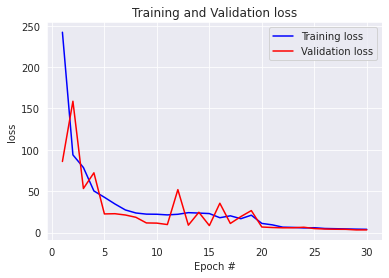

2/2 [==============================] - 0s 6ms/step - loss: 2.3089 - root_mean_squared_error: 1.5195
Model: 415
2/2 [==============================] - 0s 11ms/step - loss: 62.1901 - root_mean_squared_error: 7.8861
MODEL EVALUATION:  [62.19009017944336, 7.886069297790527]


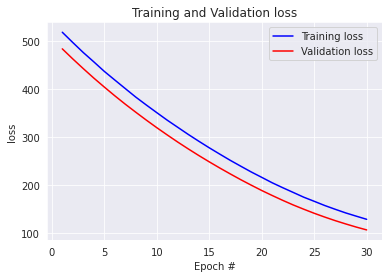

2/2 [==============================] - 0s 9ms/step - loss: 62.1901 - root_mean_squared_error: 7.8861
Model: 416
2/2 [==============================] - 0s 19ms/step - loss: 71.2216 - root_mean_squared_error: 8.4393
MODEL EVALUATION:  [71.2215805053711, 8.439288139343262]


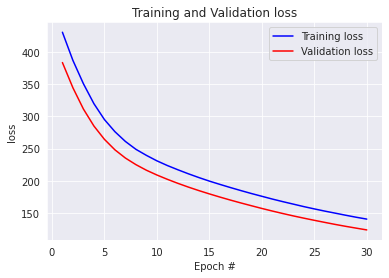

2/2 [==============================] - 0s 11ms/step - loss: 71.2216 - root_mean_squared_error: 8.4393
Model: 417
2/2 [==============================] - 0s 9ms/step - loss: 166.6634 - root_mean_squared_error: 12.9098
MODEL EVALUATION:  [166.66336059570312, 12.909815788269043]


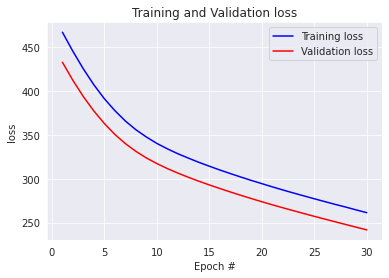

2/2 [==============================] - 0s 10ms/step - loss: 166.6634 - root_mean_squared_error: 12.9098
Model: 418
2/2 [==============================] - 0s 4ms/step - loss: 37.0260 - root_mean_squared_error: 6.0849
MODEL EVALUATION:  [37.02603530883789, 6.084902286529541]


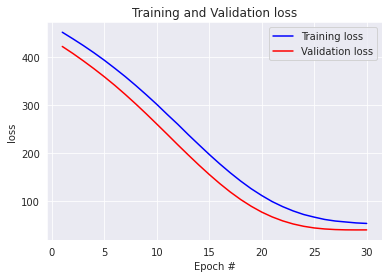

2/2 [==============================] - 0s 9ms/step - loss: 37.0260 - root_mean_squared_error: 6.0849
Model: 419
2/2 [==============================] - 0s 8ms/step - loss: 30.1098 - root_mean_squared_error: 5.4872
MODEL EVALUATION:  [30.10981559753418, 5.487241268157959]


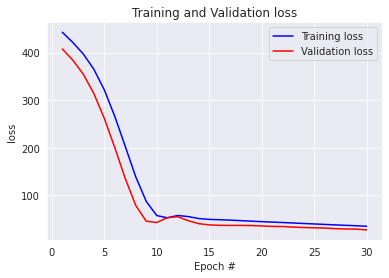

2/2 [==============================] - 0s 8ms/step - loss: 30.1098 - root_mean_squared_error: 5.4872
Model: 420
2/2 [==============================] - 0s 14ms/step - loss: 27.6997 - root_mean_squared_error: 5.2630
MODEL EVALUATION:  [27.699655532836914, 5.2630462646484375]


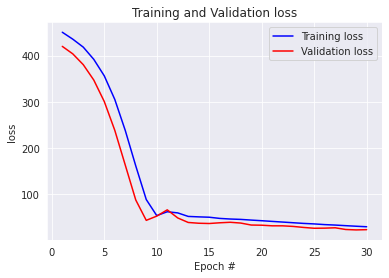

2/2 [==============================] - 0s 9ms/step - loss: 27.6997 - root_mean_squared_error: 5.2630
Model: 421
2/2 [==============================] - 0s 12ms/step - loss: 272.8058 - root_mean_squared_error: 16.5168
MODEL EVALUATION:  [272.8057556152344, 16.51683235168457]


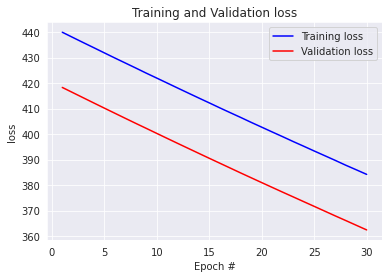

2/2 [==============================] - 0s 9ms/step - loss: 272.8058 - root_mean_squared_error: 16.5168
Model: 422
2/2 [==============================] - 0s 7ms/step - loss: 227.3647 - root_mean_squared_error: 15.0786
MODEL EVALUATION:  [227.36474609375, 15.078619003295898]


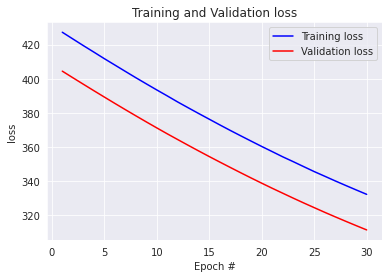

2/2 [==============================] - 0s 8ms/step - loss: 227.3647 - root_mean_squared_error: 15.0786
Model: 423
2/2 [==============================] - 0s 9ms/step - loss: 250.1146 - root_mean_squared_error: 15.8150
MODEL EVALUATION:  [250.1146240234375, 15.815011978149414]


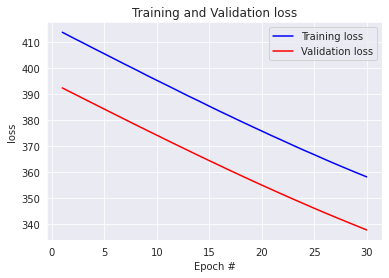

2/2 [==============================] - 0s 8ms/step - loss: 250.1146 - root_mean_squared_error: 15.8150
Model: 424
2/2 [==============================] - 0s 16ms/step - loss: 289.9059 - root_mean_squared_error: 17.0266
MODEL EVALUATION:  [289.90594482421875, 17.02662467956543]


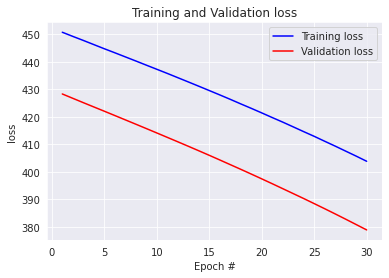

2/2 [==============================] - 0s 6ms/step - loss: 289.9059 - root_mean_squared_error: 17.0266
Model: 425
2/2 [==============================] - 0s 10ms/step - loss: 249.8259 - root_mean_squared_error: 15.8059
MODEL EVALUATION:  [249.82591247558594, 15.805882453918457]


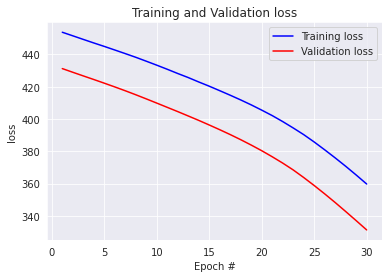

2/2 [==============================] - 0s 6ms/step - loss: 249.8259 - root_mean_squared_error: 15.8059
Model: 426
2/2 [==============================] - 0s 7ms/step - loss: 211.5344 - root_mean_squared_error: 14.5442
MODEL EVALUATION:  [211.53440856933594, 14.544222831726074]


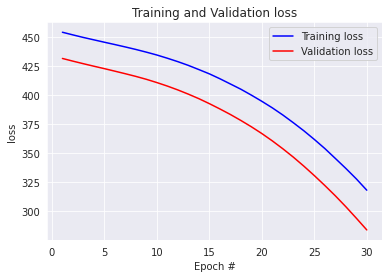

2/2 [==============================] - 0s 12ms/step - loss: 211.5344 - root_mean_squared_error: 14.5442
Model: 427
2/2 [==============================] - 0s 9ms/step - loss: 326.7489 - root_mean_squared_error: 18.0762
MODEL EVALUATION:  [326.7488708496094, 18.076196670532227]


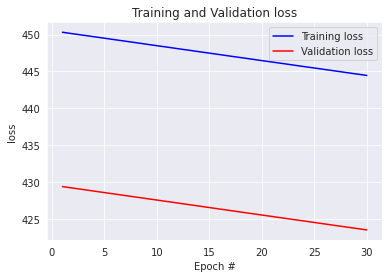

2/2 [==============================] - 0s 10ms/step - loss: 326.7489 - root_mean_squared_error: 18.0762
Model: 428
2/2 [==============================] - 0s 11ms/step - loss: 296.4731 - root_mean_squared_error: 17.2184
MODEL EVALUATION:  [296.4730529785156, 17.21839141845703]


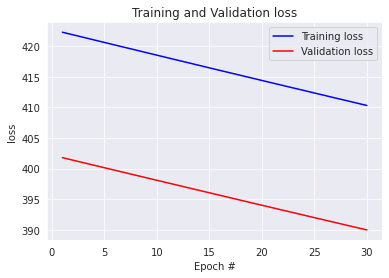

2/2 [==============================] - 0s 6ms/step - loss: 296.4731 - root_mean_squared_error: 17.2184
Model: 429
2/2 [==============================] - 0s 12ms/step - loss: 276.3138 - root_mean_squared_error: 16.6227
MODEL EVALUATION:  [276.31378173828125, 16.62268829345703]


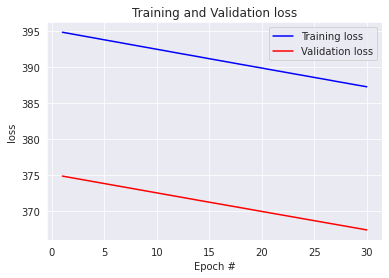

2/2 [==============================] - 0s 8ms/step - loss: 276.3138 - root_mean_squared_error: 16.6227
Model: 430
2/2 [==============================] - 0s 10ms/step - loss: 335.9070 - root_mean_squared_error: 18.3278
MODEL EVALUATION:  [335.9070129394531, 18.32776641845703]


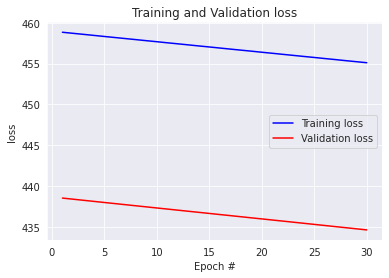

2/2 [==============================] - 0s 8ms/step - loss: 335.9070 - root_mean_squared_error: 18.3278
Model: 431
2/2 [==============================] - 0s 16ms/step - loss: 331.3896 - root_mean_squared_error: 18.2041
MODEL EVALUATION:  [331.3895568847656, 18.2041072845459]


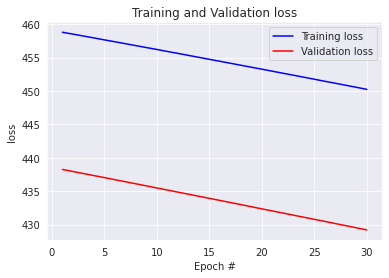

2/2 [==============================] - 0s 8ms/step - loss: 331.3896 - root_mean_squared_error: 18.2041
Model: 432
2/2 [==============================] - 0s 7ms/step - loss: 327.3534 - root_mean_squared_error: 18.0929
MODEL EVALUATION:  [327.3533630371094, 18.09290885925293]


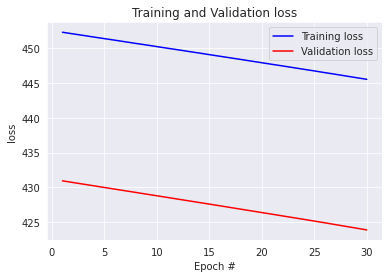

2/2 [==============================] - 0s 6ms/step - loss: 327.3534 - root_mean_squared_error: 18.0929
Model: 433
2/2 [==============================] - 0s 15ms/step - loss: 10.4415 - root_mean_squared_error: 2.8253
MODEL EVALUATION:  [10.441466331481934, 2.8252618312835693]


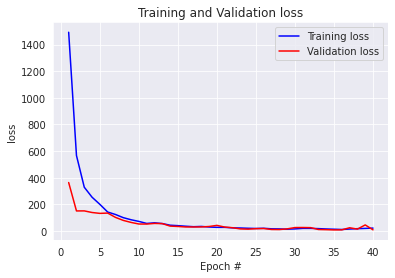

2/2 [==============================] - 0s 6ms/step - loss: 10.4415 - root_mean_squared_error: 2.8253
Model: 434
2/2 [==============================] - 0s 6ms/step - loss: 178.5480 - root_mean_squared_error: 6.2054
MODEL EVALUATION:  [178.5480499267578, 6.205357551574707]


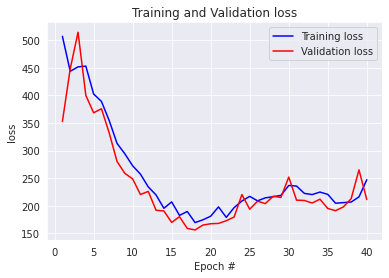

2/2 [==============================] - 0s 7ms/step - loss: 178.5480 - root_mean_squared_error: 6.2054
Model: 435
2/2 [==============================] - 0s 15ms/step - loss: 64.7547 - root_mean_squared_error: 6.4682
MODEL EVALUATION:  [64.75465393066406, 6.468203544616699]


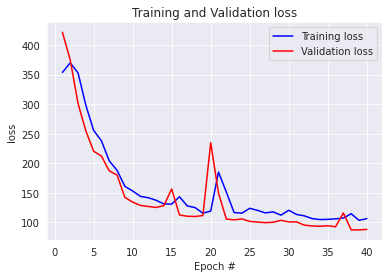

2/2 [==============================] - 0s 7ms/step - loss: 64.7547 - root_mean_squared_error: 6.4682
Model: 436
2/2 [==============================] - 0s 9ms/step - loss: 86.7787 - root_mean_squared_error: 6.5953
MODEL EVALUATION:  [86.77870178222656, 6.5952582359313965]


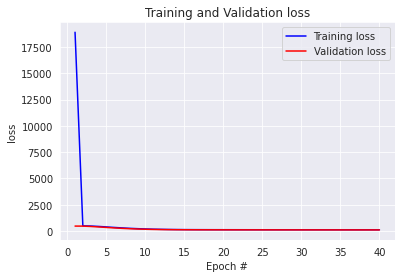

2/2 [==============================] - 0s 8ms/step - loss: 86.7787 - root_mean_squared_error: 6.5953
Model: 437
2/2 [==============================] - 0s 19ms/step - loss: 299.7661 - root_mean_squared_error: 6.0654
MODEL EVALUATION:  [299.7661437988281, 6.0654377937316895]


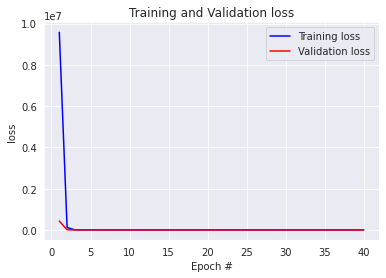

2/2 [==============================] - 0s 5ms/step - loss: 299.7661 - root_mean_squared_error: 6.0654
Model: 438
2/2 [==============================] - 0s 8ms/step - loss: 726.0029 - root_mean_squared_error: 20.1319
MODEL EVALUATION:  [726.0028686523438, 20.131935119628906]


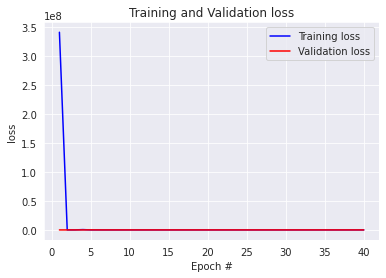

2/2 [==============================] - 0s 8ms/step - loss: 726.0029 - root_mean_squared_error: 20.1319
Model: 439
2/2 [==============================] - 0s 9ms/step - loss: 21.9991 - root_mean_squared_error: 4.3056
MODEL EVALUATION:  [21.999094009399414, 4.305615425109863]


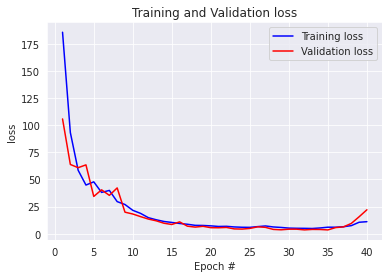

2/2 [==============================] - 0s 5ms/step - loss: 21.9991 - root_mean_squared_error: 4.3056
Model: 440
2/2 [==============================] - 0s 11ms/step - loss: 10.8049 - root_mean_squared_error: 1.5242
MODEL EVALUATION:  [10.804939270019531, 1.5242246389389038]


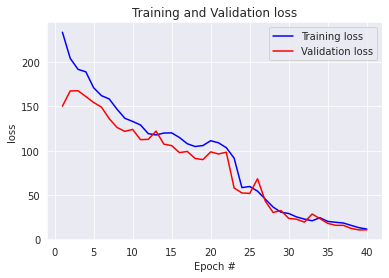

2/2 [==============================] - 0s 5ms/step - loss: 10.8049 - root_mean_squared_error: 1.5242
Model: 441
2/2 [==============================] - 0s 15ms/step - loss: 49.0544 - root_mean_squared_error: 6.6073
MODEL EVALUATION:  [49.05442810058594, 6.607306003570557]


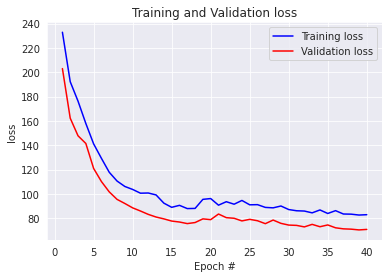

2/2 [==============================] - 0s 10ms/step - loss: 49.0544 - root_mean_squared_error: 6.6073
Model: 442
2/2 [==============================] - 0s 20ms/step - loss: 3.1175 - root_mean_squared_error: 0.9249
MODEL EVALUATION:  [3.117544412612915, 0.9249269366264343]


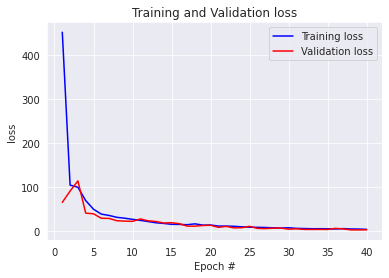

2/2 [==============================] - 0s 4ms/step - loss: 3.1175 - root_mean_squared_error: 0.9249
Model: 443
2/2 [==============================] - 0s 8ms/step - loss: 47.2122 - root_mean_squared_error: 1.6835
MODEL EVALUATION:  [47.212249755859375, 1.6834644079208374]


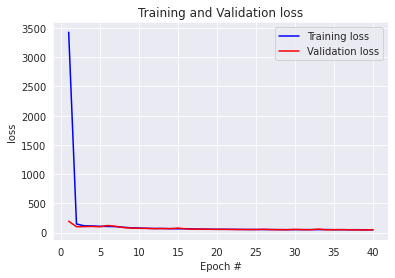

2/2 [==============================] - 0s 8ms/step - loss: 47.2122 - root_mean_squared_error: 1.6835
Model: 444
2/2 [==============================] - 0s 14ms/step - loss: 120.4766 - root_mean_squared_error: 5.9172
MODEL EVALUATION:  [120.47663879394531, 5.91715669631958]


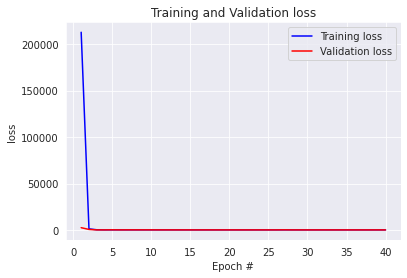

2/2 [==============================] - 0s 8ms/step - loss: 120.4766 - root_mean_squared_error: 5.9172
Model: 445
2/2 [==============================] - 0s 16ms/step - loss: 4.4131 - root_mean_squared_error: 1.0340
MODEL EVALUATION:  [4.413066387176514, 1.0339980125427246]


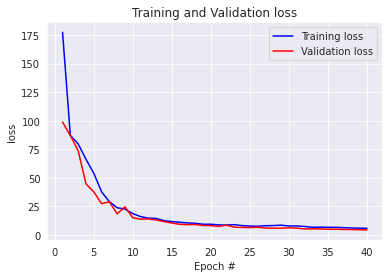

2/2 [==============================] - 0s 9ms/step - loss: 4.4131 - root_mean_squared_error: 1.0340
Model: 446
2/2 [==============================] - 0s 8ms/step - loss: 7.0758 - root_mean_squared_error: 1.2604
MODEL EVALUATION:  [7.075814723968506, 1.2603778839111328]


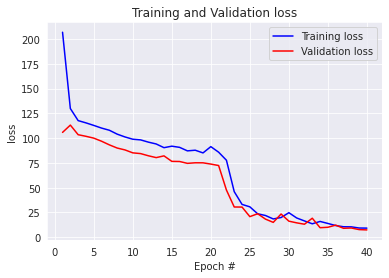

2/2 [==============================] - 0s 8ms/step - loss: 7.0758 - root_mean_squared_error: 1.2604
Model: 447
2/2 [==============================] - 0s 16ms/step - loss: 47.1882 - root_mean_squared_error: 6.5673
MODEL EVALUATION:  [47.18819808959961, 6.567278861999512]


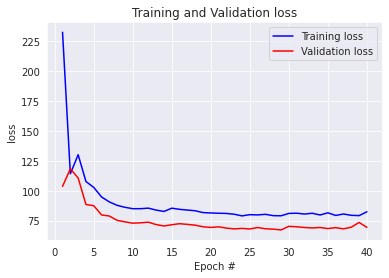

2/2 [==============================] - 0s 12ms/step - loss: 47.1882 - root_mean_squared_error: 6.5673
Model: 448
2/2 [==============================] - 0s 6ms/step - loss: 1.7722 - root_mean_squared_error: 0.6642
MODEL EVALUATION:  [1.7722396850585938, 0.6642441749572754]


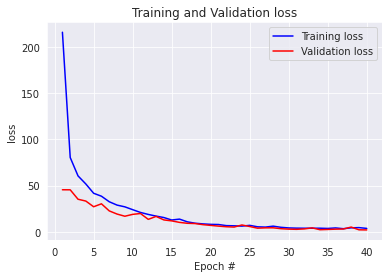

2/2 [==============================] - 0s 6ms/step - loss: 1.7722 - root_mean_squared_error: 0.6642
Model: 449
2/2 [==============================] - 0s 15ms/step - loss: 4.3490 - root_mean_squared_error: 0.9444
MODEL EVALUATION:  [4.348965644836426, 0.9444143772125244]


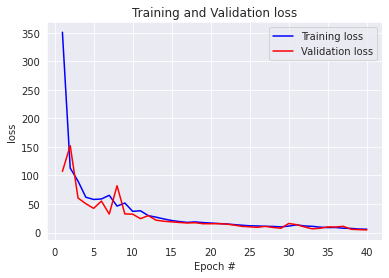

2/2 [==============================] - 0s 8ms/step - loss: 4.3490 - root_mean_squared_error: 0.9444
Model: 450
2/2 [==============================] - 0s 9ms/step - loss: 9.6123 - root_mean_squared_error: 0.8578
MODEL EVALUATION:  [9.612322807312012, 0.8577863574028015]


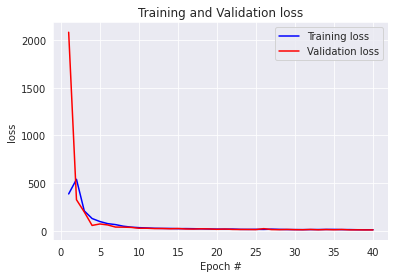

2/2 [==============================] - 0s 8ms/step - loss: 9.6123 - root_mean_squared_error: 0.8578
Model: 451
2/2 [==============================] - 0s 15ms/step - loss: 20.5780 - root_mean_squared_error: 3.8760
MODEL EVALUATION:  [20.5779972076416, 3.875964641571045]


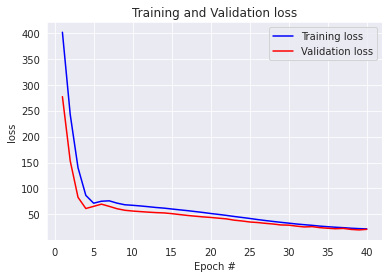

2/2 [==============================] - 0s 5ms/step - loss: 20.5780 - root_mean_squared_error: 3.8760
Model: 452
2/2 [==============================] - 0s 9ms/step - loss: 14.7942 - root_mean_squared_error: 2.2680
MODEL EVALUATION:  [14.794232368469238, 2.2680487632751465]


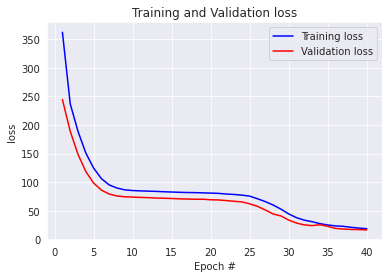

2/2 [==============================] - 0s 7ms/step - loss: 14.7942 - root_mean_squared_error: 2.2680
Model: 453
2/2 [==============================] - 0s 8ms/step - loss: 46.3820 - root_mean_squared_error: 6.6276
MODEL EVALUATION:  [46.382015228271484, 6.627621650695801]


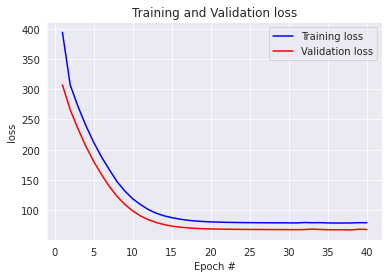

2/2 [==============================] - 0s 5ms/step - loss: 46.3820 - root_mean_squared_error: 6.6276
Model: 454
2/2 [==============================] - 0s 8ms/step - loss: 10.9297 - root_mean_squared_error: 2.9474
MODEL EVALUATION:  [10.929731369018555, 2.947362184524536]


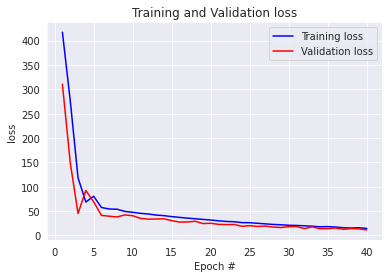

2/2 [==============================] - 0s 8ms/step - loss: 10.9297 - root_mean_squared_error: 2.9474
Model: 455
2/2 [==============================] - 0s 22ms/step - loss: 6.2355 - root_mean_squared_error: 1.4431
MODEL EVALUATION:  [6.235492706298828, 1.4430714845657349]


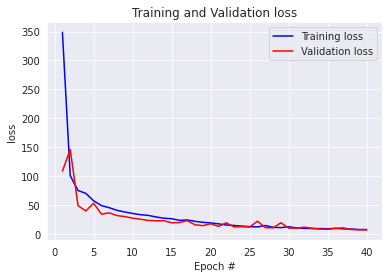

2/2 [==============================] - 0s 8ms/step - loss: 6.2355 - root_mean_squared_error: 1.4431
Model: 456
2/2 [==============================] - 0s 9ms/step - loss: 4.7437 - root_mean_squared_error: 1.1955
MODEL EVALUATION:  [4.7436933517456055, 1.195475697517395]


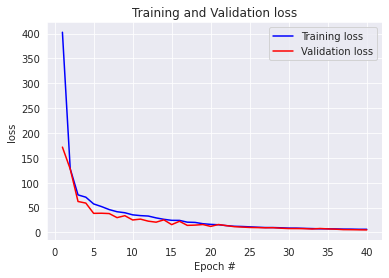

2/2 [==============================] - 0s 5ms/step - loss: 4.7437 - root_mean_squared_error: 1.1955
Model: 457
2/2 [==============================] - 0s 8ms/step - loss: 7.9624 - root_mean_squared_error: 1.8201
MODEL EVALUATION:  [7.962405681610107, 1.8201316595077515]


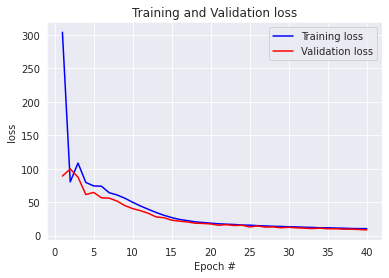

2/2 [==============================] - 0s 7ms/step - loss: 7.9624 - root_mean_squared_error: 1.8201
Model: 458
2/2 [==============================] - 0s 8ms/step - loss: 10.2426 - root_mean_squared_error: 1.4870
MODEL EVALUATION:  [10.242584228515625, 1.4869862794876099]


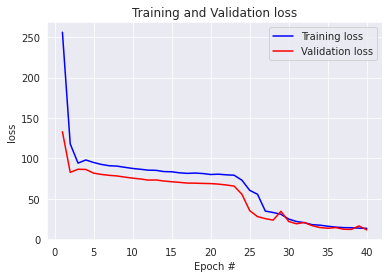

2/2 [==============================] - 0s 7ms/step - loss: 10.2426 - root_mean_squared_error: 1.4870
Model: 459
2/2 [==============================] - 0s 10ms/step - loss: 46.1412 - root_mean_squared_error: 6.6704
MODEL EVALUATION:  [46.141231536865234, 6.6704182624816895]


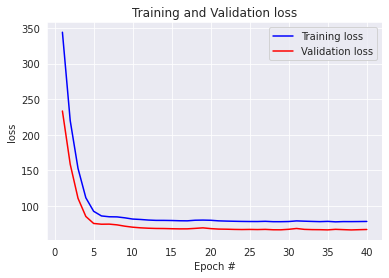

2/2 [==============================] - 0s 8ms/step - loss: 46.1412 - root_mean_squared_error: 6.6704
Model: 460
2/2 [==============================] - 0s 20ms/step - loss: 4.5636 - root_mean_squared_error: 1.5909
MODEL EVALUATION:  [4.563645362854004, 1.5909327268600464]


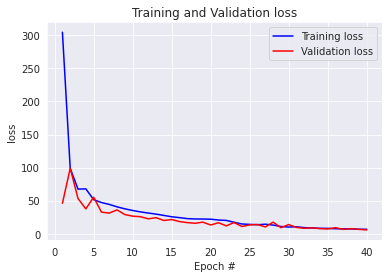

2/2 [==============================] - 0s 8ms/step - loss: 4.5636 - root_mean_squared_error: 1.5909
Model: 461
2/2 [==============================] - 0s 12ms/step - loss: 4.6293 - root_mean_squared_error: 1.2907
MODEL EVALUATION:  [4.629337787628174, 1.2906901836395264]


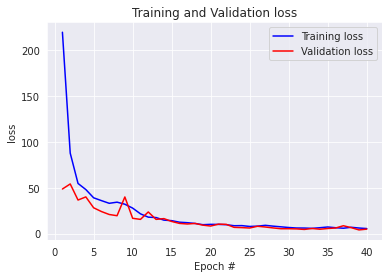

2/2 [==============================] - 0s 8ms/step - loss: 4.6293 - root_mean_squared_error: 1.2907
Model: 462
2/2 [==============================] - 0s 10ms/step - loss: 3.7264 - root_mean_squared_error: 0.9015
MODEL EVALUATION:  [3.7264275550842285, 0.9014887809753418]


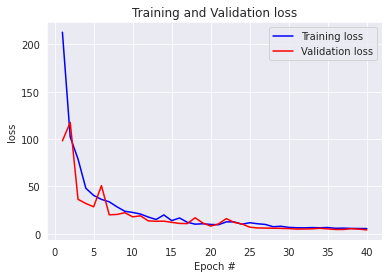

2/2 [==============================] - 0s 6ms/step - loss: 3.7264 - root_mean_squared_error: 0.9015
Model: 463
2/2 [==============================] - 0s 12ms/step - loss: 37.9044 - root_mean_squared_error: 5.9113
MODEL EVALUATION:  [37.90437316894531, 5.911332130432129]


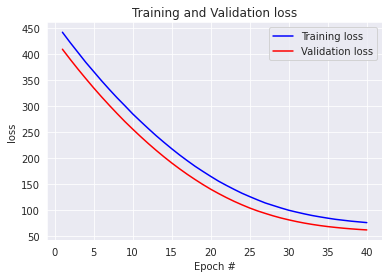

2/2 [==============================] - 0s 7ms/step - loss: 37.9044 - root_mean_squared_error: 5.9113
Model: 464
2/2 [==============================] - 0s 14ms/step - loss: 69.3237 - root_mean_squared_error: 7.7600
MODEL EVALUATION:  [69.32368469238281, 7.759953022003174]


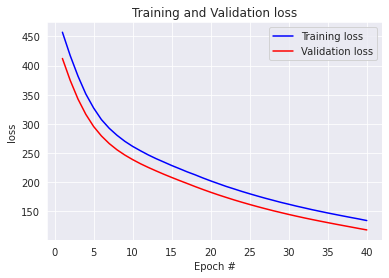

2/2 [==============================] - 0s 8ms/step - loss: 69.3237 - root_mean_squared_error: 7.7600
Model: 465
2/2 [==============================] - 0s 15ms/step - loss: 143.5886 - root_mean_squared_error: 11.6485
MODEL EVALUATION:  [143.58856201171875, 11.6484956741333]


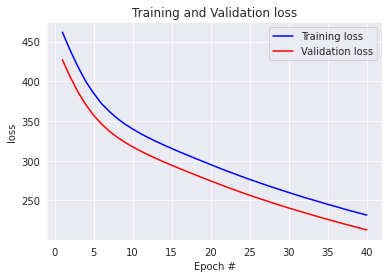

2/2 [==============================] - 0s 10ms/step - loss: 143.5886 - root_mean_squared_error: 11.6485
Model: 466
2/2 [==============================] - 0s 7ms/step - loss: 39.4632 - root_mean_squared_error: 6.1181
MODEL EVALUATION:  [39.46315383911133, 6.118090629577637]


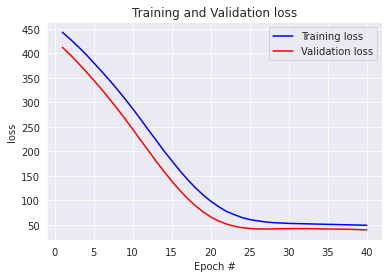

2/2 [==============================] - 0s 8ms/step - loss: 39.4632 - root_mean_squared_error: 6.1181
Model: 467
2/2 [==============================] - 0s 8ms/step - loss: 29.0467 - root_mean_squared_error: 4.8346
MODEL EVALUATION:  [29.046707153320312, 4.834636688232422]


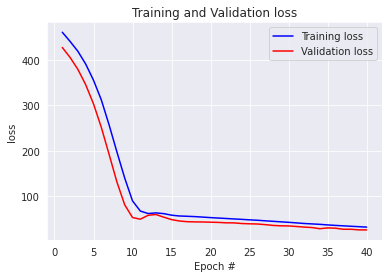

2/2 [==============================] - 0s 8ms/step - loss: 29.0467 - root_mean_squared_error: 4.8346
Model: 468
2/2 [==============================] - 0s 18ms/step - loss: 26.8536 - root_mean_squared_error: 4.5606
MODEL EVALUATION:  [26.85357666015625, 4.560554027557373]


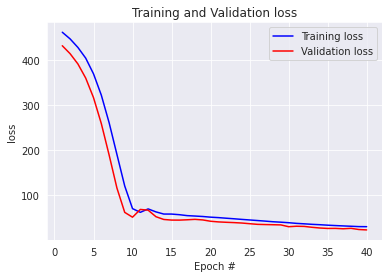

2/2 [==============================] - 0s 6ms/step - loss: 26.8536 - root_mean_squared_error: 4.5606
Model: 469
2/2 [==============================] - 0s 12ms/step - loss: 300.1848 - root_mean_squared_error: 17.2735
MODEL EVALUATION:  [300.1848449707031, 17.27347755432129]


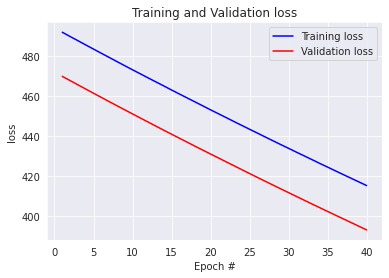

2/2 [==============================] - 0s 5ms/step - loss: 300.1848 - root_mean_squared_error: 17.2735
Model: 470
2/2 [==============================] - 0s 15ms/step - loss: 254.2094 - root_mean_squared_error: 15.6577
MODEL EVALUATION:  [254.20944213867188, 15.657742500305176]


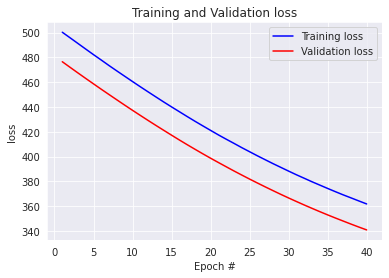

2/2 [==============================] - 0s 5ms/step - loss: 254.2094 - root_mean_squared_error: 15.6577
Model: 471
2/2 [==============================] - 0s 6ms/step - loss: 271.5331 - root_mean_squared_error: 16.1230
MODEL EVALUATION:  [271.53314208984375, 16.123022079467773]


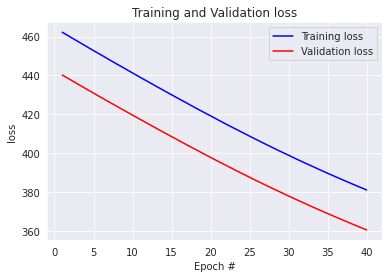

2/2 [==============================] - 0s 8ms/step - loss: 271.5331 - root_mean_squared_error: 16.1230
Model: 472
2/2 [==============================] - 0s 10ms/step - loss: 291.9767 - root_mean_squared_error: 17.0351
MODEL EVALUATION:  [291.9767150878906, 17.03509521484375]


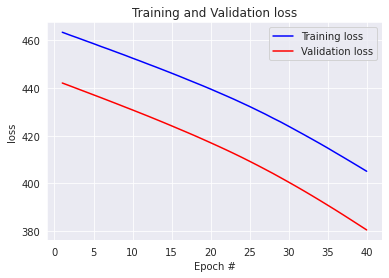

2/2 [==============================] - 0s 5ms/step - loss: 291.9767 - root_mean_squared_error: 17.0351
Model: 473
2/2 [==============================] - 0s 8ms/step - loss: 221.5079 - root_mean_squared_error: 14.6072
MODEL EVALUATION:  [221.5079345703125, 14.607234001159668]


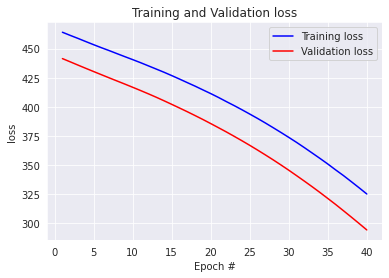

2/2 [==============================] - 0s 9ms/step - loss: 221.5079 - root_mean_squared_error: 14.6072
Model: 474
2/2 [==============================] - 0s 5ms/step - loss: 230.1959 - root_mean_squared_error: 14.8267
MODEL EVALUATION:  [230.1959228515625, 14.826655387878418]


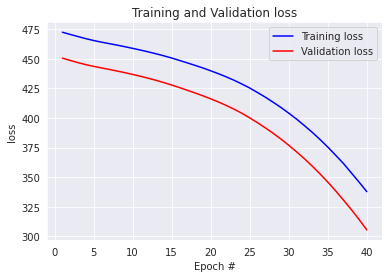

2/2 [==============================] - 0s 9ms/step - loss: 230.1959 - root_mean_squared_error: 14.8267
Model: 475
2/2 [==============================] - 0s 11ms/step - loss: 305.8585 - root_mean_squared_error: 17.4365
MODEL EVALUATION:  [305.8584899902344, 17.436548233032227]


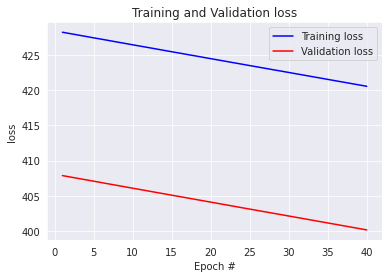

2/2 [==============================] - 0s 5ms/step - loss: 305.8585 - root_mean_squared_error: 17.4365
Model: 476
2/2 [==============================] - 0s 15ms/step - loss: 326.8022 - root_mean_squared_error: 17.8241
MODEL EVALUATION:  [326.80224609375, 17.824052810668945]


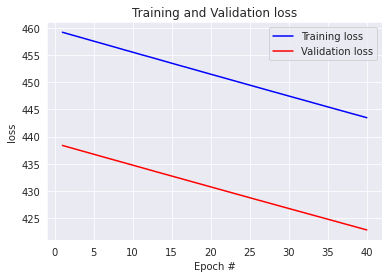

2/2 [==============================] - 0s 5ms/step - loss: 326.8022 - root_mean_squared_error: 17.8241
Model: 477
2/2 [==============================] - 0s 16ms/step - loss: 334.6195 - root_mean_squared_error: 17.9753
MODEL EVALUATION:  [334.6194763183594, 17.975317001342773]


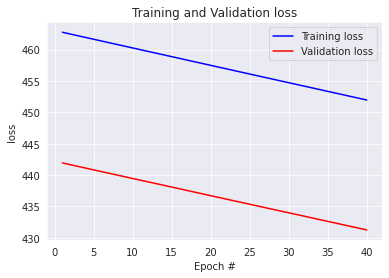

2/2 [==============================] - 0s 13ms/step - loss: 334.6195 - root_mean_squared_error: 17.9753
Model: 478
2/2 [==============================] - 0s 16ms/step - loss: 310.1959 - root_mean_squared_error: 17.5590
MODEL EVALUATION:  [310.1958923339844, 17.5589656829834]


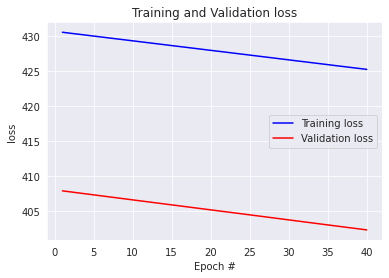

2/2 [==============================] - 0s 12ms/step - loss: 310.1959 - root_mean_squared_error: 17.5590
Model: 479
2/2 [==============================] - 0s 13ms/step - loss: 339.7830 - root_mean_squared_error: 18.1878
MODEL EVALUATION:  [339.782958984375, 18.18779945373535]


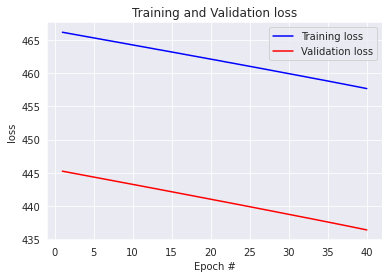

2/2 [==============================] - 0s 8ms/step - loss: 339.7830 - root_mean_squared_error: 18.1878
Model: 480
2/2 [==============================] - 0s 9ms/step - loss: 333.1212 - root_mean_squared_error: 17.9358
MODEL EVALUATION:  [333.1211853027344, 17.93575668334961]


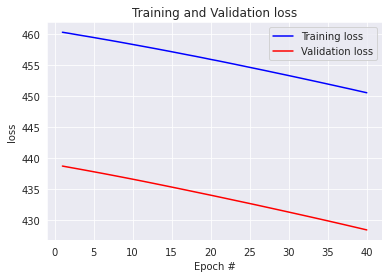

2/2 [==============================] - 0s 9ms/step - loss: 333.1212 - root_mean_squared_error: 17.9358
Model: 481
2/2 [==============================] - 0s 8ms/step - loss: 4.4580 - root_mean_squared_error: 0.9199
MODEL EVALUATION:  [4.458042144775391, 0.919926106929779]


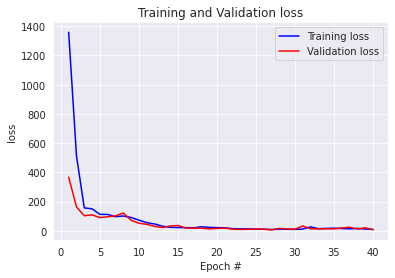

2/2 [==============================] - 0s 8ms/step - loss: 4.4580 - root_mean_squared_error: 0.9199
Model: 482
2/2 [==============================] - 0s 9ms/step - loss: 64.3469 - root_mean_squared_error: 6.1861
MODEL EVALUATION:  [64.3469009399414, 6.186093330383301]


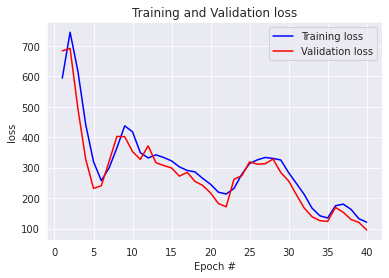

2/2 [==============================] - 0s 8ms/step - loss: 64.3469 - root_mean_squared_error: 6.1861
Model: 483
2/2 [==============================] - 0s 7ms/step - loss: 43.5332 - root_mean_squared_error: 6.3285
MODEL EVALUATION:  [43.53318786621094, 6.328524112701416]


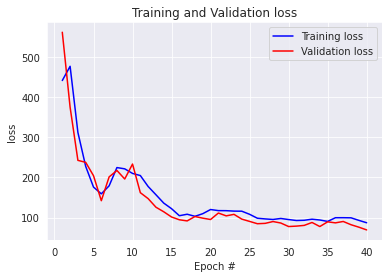

2/2 [==============================] - 0s 6ms/step - loss: 43.5332 - root_mean_squared_error: 6.3285
Model: 484
2/2 [==============================] - 0s 9ms/step - loss: 80.0455 - root_mean_squared_error: 2.0053
MODEL EVALUATION:  [80.04554748535156, 2.005302667617798]


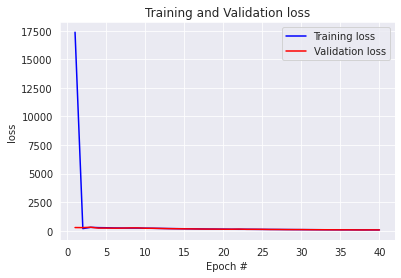

2/2 [==============================] - 0s 8ms/step - loss: 80.0455 - root_mean_squared_error: 2.0053
Model: 485
2/2 [==============================] - 0s 17ms/step - loss: 1413.9626 - root_mean_squared_error: 16.3305
MODEL EVALUATION:  [1413.962646484375, 16.33053207397461]


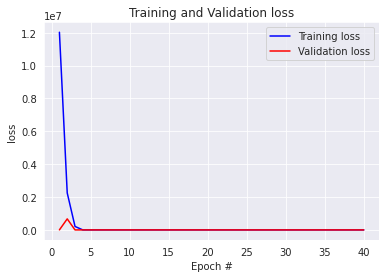

2/2 [==============================] - 0s 6ms/step - loss: 1413.9626 - root_mean_squared_error: 16.3305
Model: 486
2/2 [==============================] - 0s 8ms/step - loss: 2013.1556 - root_mean_squared_error: 20.6100
MODEL EVALUATION:  [2013.1556396484375, 20.610048294067383]


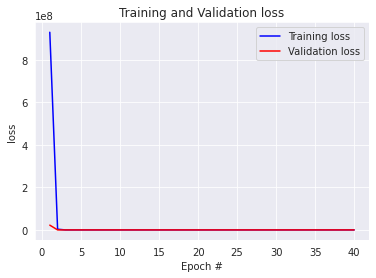

2/2 [==============================] - 0s 6ms/step - loss: 2013.1556 - root_mean_squared_error: 20.6100
Model: 487
2/2 [==============================] - 0s 8ms/step - loss: 4.7882 - root_mean_squared_error: 1.1641
MODEL EVALUATION:  [4.788214206695557, 1.1641440391540527]


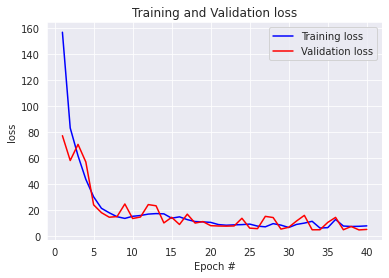

2/2 [==============================] - 0s 8ms/step - loss: 4.7882 - root_mean_squared_error: 1.1641
Model: 488
2/2 [==============================] - 0s 14ms/step - loss: 6.9851 - root_mean_squared_error: 1.7854
MODEL EVALUATION:  [6.985134124755859, 1.7854121923446655]


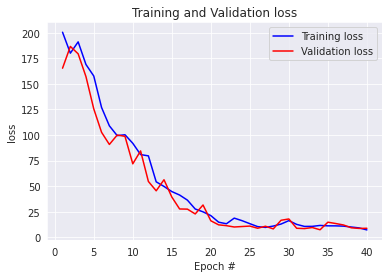

2/2 [==============================] - 0s 5ms/step - loss: 6.9851 - root_mean_squared_error: 1.7854
Model: 489
2/2 [==============================] - 0s 8ms/step - loss: 40.5586 - root_mean_squared_error: 6.3136
MODEL EVALUATION:  [40.558616638183594, 6.313597202301025]


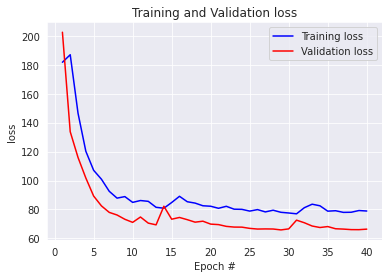

2/2 [==============================] - 0s 8ms/step - loss: 40.5586 - root_mean_squared_error: 6.3136
Model: 490
2/2 [==============================] - 0s 8ms/step - loss: 1.8604 - root_mean_squared_error: 0.6370
MODEL EVALUATION:  [1.8604075908660889, 0.6370131373405457]


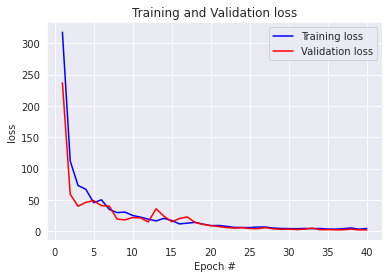

2/2 [==============================] - 0s 8ms/step - loss: 1.8604 - root_mean_squared_error: 0.6370
Model: 491
2/2 [==============================] - 0s 12ms/step - loss: 62.2140 - root_mean_squared_error: 1.5263
MODEL EVALUATION:  [62.214027404785156, 1.5262590646743774]


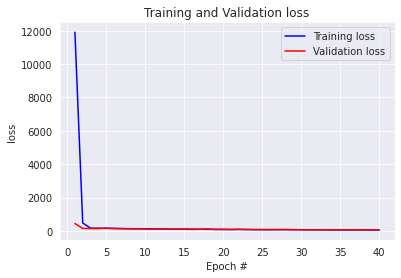

2/2 [==============================] - 0s 8ms/step - loss: 62.2140 - root_mean_squared_error: 1.5263
Model: 492
2/2 [==============================] - 0s 9ms/step - loss: 156.8019 - root_mean_squared_error: 5.6333
MODEL EVALUATION:  [156.80194091796875, 5.633309841156006]


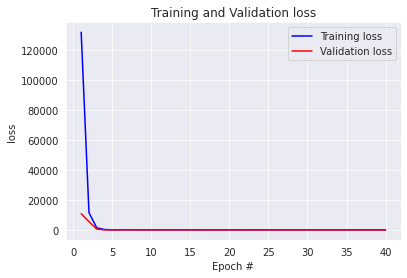

2/2 [==============================] - 0s 8ms/step - loss: 156.8019 - root_mean_squared_error: 5.6333
Model: 493
2/2 [==============================] - 0s 9ms/step - loss: 9.1542 - root_mean_squared_error: 2.0368
MODEL EVALUATION:  [9.154191017150879, 2.0367984771728516]


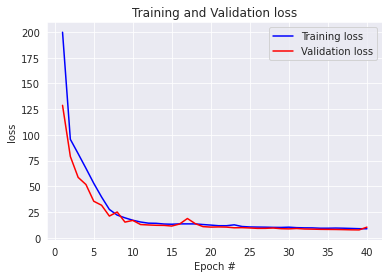

2/2 [==============================] - 0s 8ms/step - loss: 9.1542 - root_mean_squared_error: 2.0368
Model: 494
2/2 [==============================] - 0s 8ms/step - loss: 5.1398 - root_mean_squared_error: 1.0367
MODEL EVALUATION:  [5.139798641204834, 1.0366787910461426]


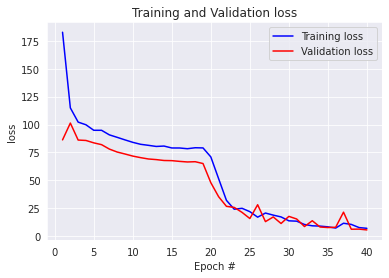

2/2 [==============================] - 0s 6ms/step - loss: 5.1398 - root_mean_squared_error: 1.0367
Model: 495
2/2 [==============================] - 0s 11ms/step - loss: 43.4362 - root_mean_squared_error: 6.4651
MODEL EVALUATION:  [43.43617248535156, 6.465050220489502]


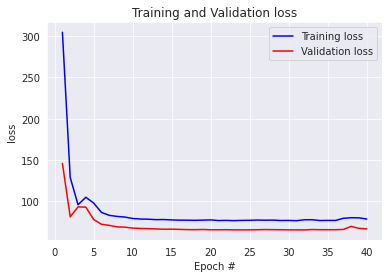

2/2 [==============================] - 0s 10ms/step - loss: 43.4362 - root_mean_squared_error: 6.4651
Model: 496
2/2 [==============================] - 0s 15ms/step - loss: 3.7856 - root_mean_squared_error: 1.5911
MODEL EVALUATION:  [3.7856292724609375, 1.5911362171173096]


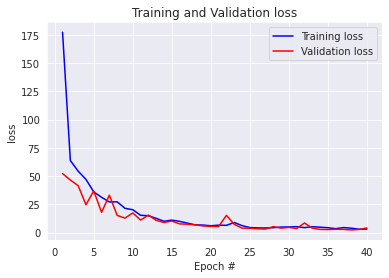

2/2 [==============================] - 0s 8ms/step - loss: 3.7856 - root_mean_squared_error: 1.5911
Model: 497
2/2 [==============================] - 0s 8ms/step - loss: 4.0208 - root_mean_squared_error: 1.5149
MODEL EVALUATION:  [4.020765781402588, 1.514938235282898]


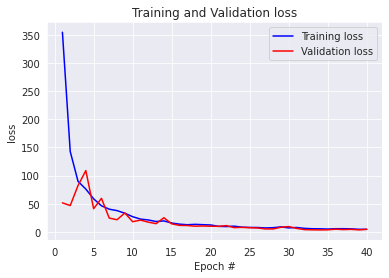

2/2 [==============================] - 0s 8ms/step - loss: 4.0208 - root_mean_squared_error: 1.5149
Model: 498
2/2 [==============================] - 0s 5ms/step - loss: 3.3718 - root_mean_squared_error: 1.3304
MODEL EVALUATION:  [3.3718154430389404, 1.3304344415664673]


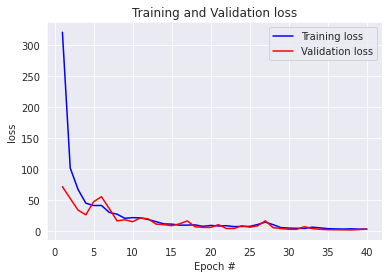

2/2 [==============================] - 0s 8ms/step - loss: 3.3718 - root_mean_squared_error: 1.3304
Model: 499
2/2 [==============================] - 0s 7ms/step - loss: 17.4376 - root_mean_squared_error: 3.6425
MODEL EVALUATION:  [17.437576293945312, 3.642460584640503]


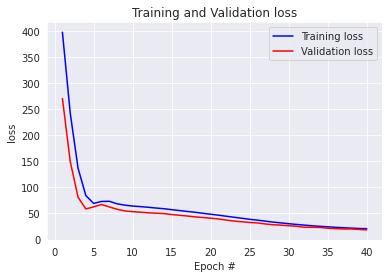

2/2 [==============================] - 0s 7ms/step - loss: 17.4376 - root_mean_squared_error: 3.6425
Model: 500
2/2 [==============================] - 0s 9ms/step - loss: 24.3713 - root_mean_squared_error: 4.4335
MODEL EVALUATION:  [24.371299743652344, 4.4335103034973145]


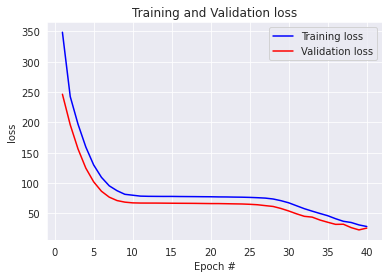

2/2 [==============================] - 0s 9ms/step - loss: 24.3713 - root_mean_squared_error: 4.4335
Model: 501
2/2 [==============================] - 0s 7ms/step - loss: 43.0713 - root_mean_squared_error: 6.5225
MODEL EVALUATION:  [43.0712890625, 6.522528648376465]


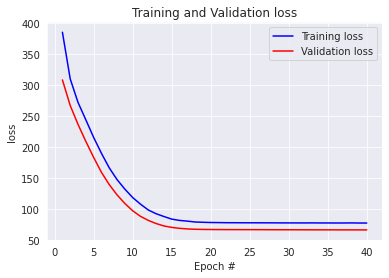

2/2 [==============================] - 0s 8ms/step - loss: 43.0713 - root_mean_squared_error: 6.5225
Model: 502
2/2 [==============================] - 0s 15ms/step - loss: 10.8690 - root_mean_squared_error: 3.1524
MODEL EVALUATION:  [10.8690185546875, 3.1524319648742676]


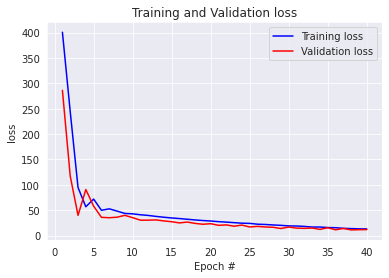

2/2 [==============================] - 0s 5ms/step - loss: 10.8690 - root_mean_squared_error: 3.1524
Model: 503
2/2 [==============================] - 0s 7ms/step - loss: 2.9012 - root_mean_squared_error: 1.3387
MODEL EVALUATION:  [2.9011588096618652, 1.3387422561645508]


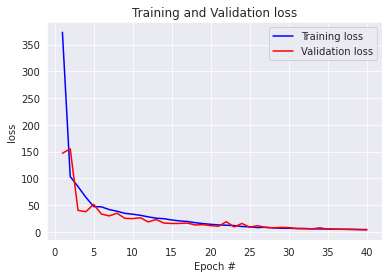

2/2 [==============================] - 0s 9ms/step - loss: 2.9012 - root_mean_squared_error: 1.3387
Model: 504
2/2 [==============================] - 0s 5ms/step - loss: 3.6053 - root_mean_squared_error: 1.6233
MODEL EVALUATION:  [3.6053454875946045, 1.6233196258544922]


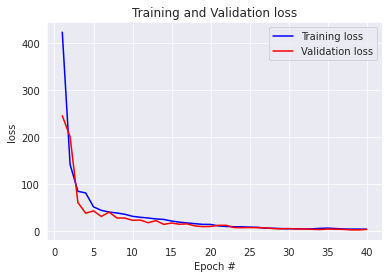

2/2 [==============================] - 0s 5ms/step - loss: 3.6053 - root_mean_squared_error: 1.6233
Model: 505
2/2 [==============================] - 0s 18ms/step - loss: 9.7981 - root_mean_squared_error: 2.1103
MODEL EVALUATION:  [9.798133850097656, 2.110278606414795]


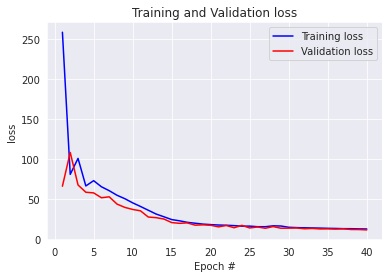

2/2 [==============================] - 0s 8ms/step - loss: 9.7981 - root_mean_squared_error: 2.1103
Model: 506
2/2 [==============================] - 0s 11ms/step - loss: 5.6948 - root_mean_squared_error: 1.1353
MODEL EVALUATION:  [5.694828033447266, 1.135286808013916]


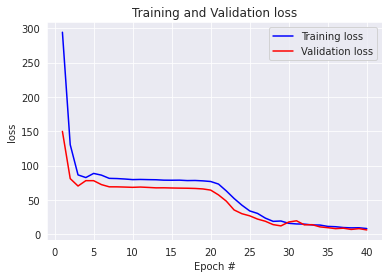

2/2 [==============================] - 0s 8ms/step - loss: 5.6948 - root_mean_squared_error: 1.1353
Model: 507
2/2 [==============================] - 0s 12ms/step - loss: 42.4150 - root_mean_squared_error: 6.4952
MODEL EVALUATION:  [42.414981842041016, 6.495177268981934]


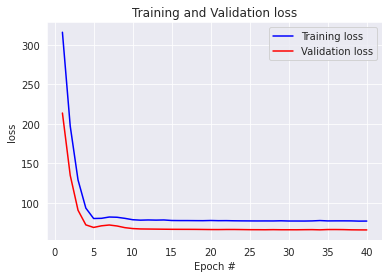

2/2 [==============================] - 0s 7ms/step - loss: 42.4150 - root_mean_squared_error: 6.4952
Model: 508
2/2 [==============================] - 0s 23ms/step - loss: 3.7260 - root_mean_squared_error: 1.5958
MODEL EVALUATION:  [3.7260494232177734, 1.5957629680633545]


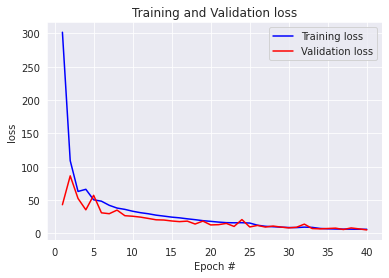

2/2 [==============================] - 0s 8ms/step - loss: 3.7260 - root_mean_squared_error: 1.5958
Model: 509
2/2 [==============================] - 0s 8ms/step - loss: 1.9218 - root_mean_squared_error: 0.9374
MODEL EVALUATION:  [1.9218019247055054, 0.9373811483383179]


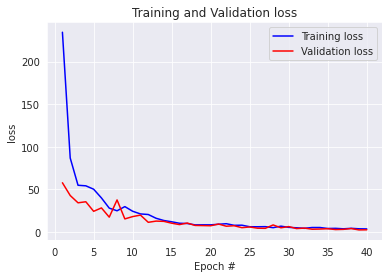

2/2 [==============================] - 0s 8ms/step - loss: 1.9218 - root_mean_squared_error: 0.9374
Model: 510
2/2 [==============================] - 0s 6ms/step - loss: 1.2147 - root_mean_squared_error: 0.6917
MODEL EVALUATION:  [1.2146830558776855, 0.6917433142662048]


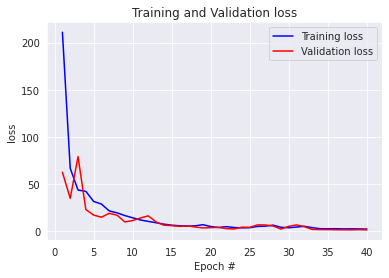

2/2 [==============================] - 0s 8ms/step - loss: 1.2147 - root_mean_squared_error: 0.6917
Model: 511
2/2 [==============================] - 0s 9ms/step - loss: 35.9626 - root_mean_squared_error: 5.9343
MODEL EVALUATION:  [35.96256637573242, 5.9342756271362305]


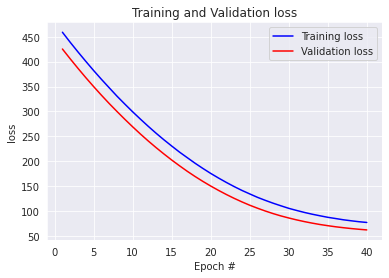

2/2 [==============================] - 0s 8ms/step - loss: 35.9626 - root_mean_squared_error: 5.9343
Model: 512
2/2 [==============================] - 0s 19ms/step - loss: 52.4950 - root_mean_squared_error: 7.1424
MODEL EVALUATION:  [52.495018005371094, 7.142403602600098]


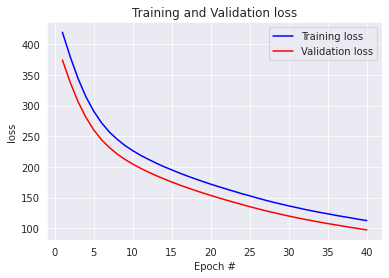

2/2 [==============================] - 0s 6ms/step - loss: 52.4950 - root_mean_squared_error: 7.1424
Model: 513
2/2 [==============================] - 0s 5ms/step - loss: 122.5923 - root_mean_squared_error: 10.9975
MODEL EVALUATION:  [122.59228515625, 10.997453689575195]


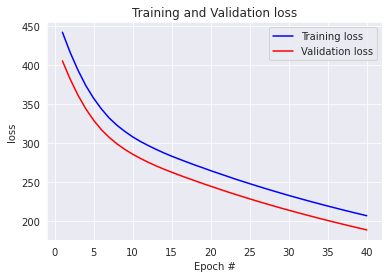

2/2 [==============================] - 0s 6ms/step - loss: 122.5923 - root_mean_squared_error: 10.9975
Model: 514
2/2 [==============================] - 0s 15ms/step - loss: 39.4153 - root_mean_squared_error: 6.2413
MODEL EVALUATION:  [39.41527557373047, 6.241335868835449]


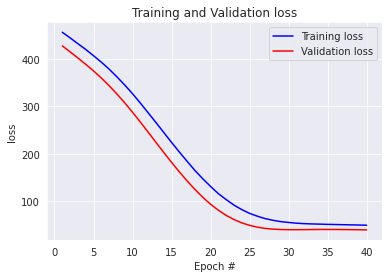

2/2 [==============================] - 0s 8ms/step - loss: 39.4153 - root_mean_squared_error: 6.2413
Model: 515
2/2 [==============================] - 0s 17ms/step - loss: 24.8890 - root_mean_squared_error: 4.8964
MODEL EVALUATION:  [24.888988494873047, 4.8964457511901855]


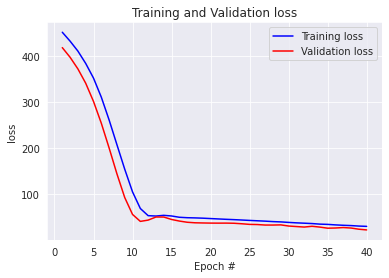

2/2 [==============================] - 0s 7ms/step - loss: 24.8890 - root_mean_squared_error: 4.8964
Model: 516
2/2 [==============================] - 0s 9ms/step - loss: 19.8110 - root_mean_squared_error: 4.3359
MODEL EVALUATION:  [19.811037063598633, 4.335878372192383]


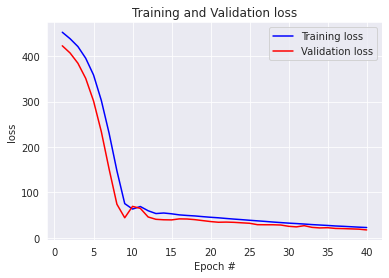

2/2 [==============================] - 0s 10ms/step - loss: 19.8110 - root_mean_squared_error: 4.3359
Model: 517
2/2 [==============================] - 0s 17ms/step - loss: 250.9198 - root_mean_squared_error: 15.8324
MODEL EVALUATION:  [250.9198455810547, 15.83238697052002]


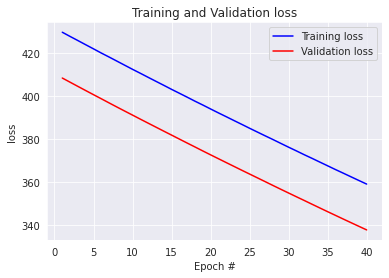

2/2 [==============================] - 0s 8ms/step - loss: 250.9198 - root_mean_squared_error: 15.8324
Model: 518
2/2 [==============================] - 0s 8ms/step - loss: 184.4840 - root_mean_squared_error: 13.5400
MODEL EVALUATION:  [184.48399353027344, 13.539979934692383]


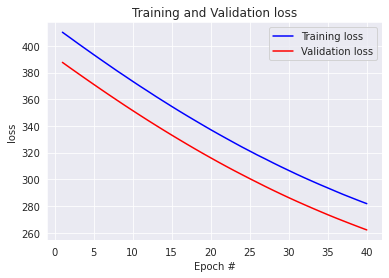

2/2 [==============================] - 0s 8ms/step - loss: 184.4840 - root_mean_squared_error: 13.5400
Model: 519
2/2 [==============================] - 0s 12ms/step - loss: 265.6642 - root_mean_squared_error: 16.2511
MODEL EVALUATION:  [265.6641845703125, 16.2510986328125]


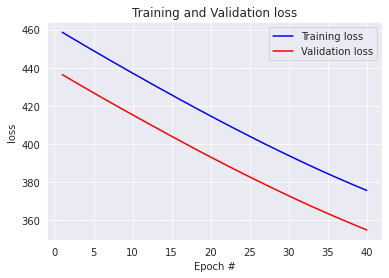

2/2 [==============================] - 0s 4ms/step - loss: 265.6642 - root_mean_squared_error: 16.2511
Model: 520
2/2 [==============================] - 0s 9ms/step - loss: 273.2927 - root_mean_squared_error: 16.5242
MODEL EVALUATION:  [273.2926940917969, 16.524242401123047]


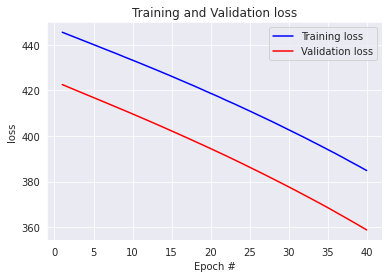

2/2 [==============================] - 0s 7ms/step - loss: 273.2927 - root_mean_squared_error: 16.5242
Model: 521
2/2 [==============================] - 0s 20ms/step - loss: 211.1393 - root_mean_squared_error: 14.4966
MODEL EVALUATION:  [211.13931274414062, 14.496646881103516]


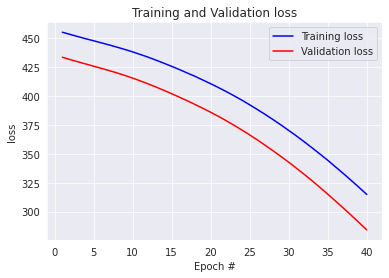

2/2 [==============================] - 0s 5ms/step - loss: 211.1393 - root_mean_squared_error: 14.4966
Model: 522
2/2 [==============================] - 0s 9ms/step - loss: 199.6687 - root_mean_squared_error: 14.0820
MODEL EVALUATION:  [199.6686553955078, 14.082002639770508]


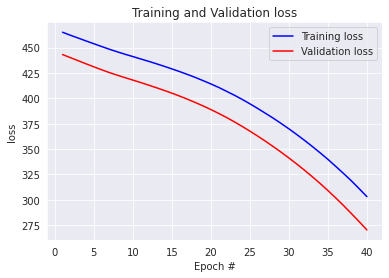

2/2 [==============================] - 0s 7ms/step - loss: 199.6687 - root_mean_squared_error: 14.0820
Model: 523
2/2 [==============================] - 0s 12ms/step - loss: 312.1166 - root_mean_squared_error: 17.6598
MODEL EVALUATION:  [312.1166076660156, 17.659774780273438]


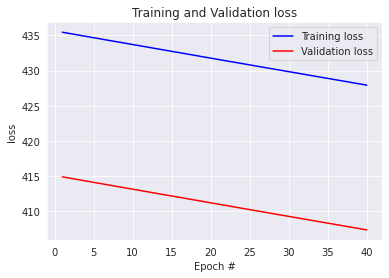

2/2 [==============================] - 0s 7ms/step - loss: 312.1166 - root_mean_squared_error: 17.6598
Model: 524
2/2 [==============================] - 0s 8ms/step - loss: 314.5854 - root_mean_squared_error: 17.7052
MODEL EVALUATION:  [314.5854187011719, 17.705181121826172]


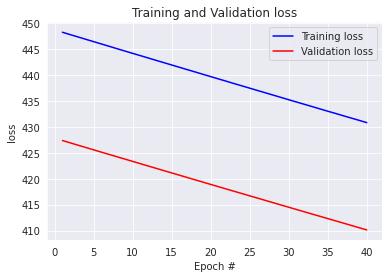

2/2 [==============================] - 0s 6ms/step - loss: 314.5854 - root_mean_squared_error: 17.7052
Model: 525
2/2 [==============================] - 0s 10ms/step - loss: 318.4442 - root_mean_squared_error: 17.8017
MODEL EVALUATION:  [318.4442138671875, 17.801742553710938]


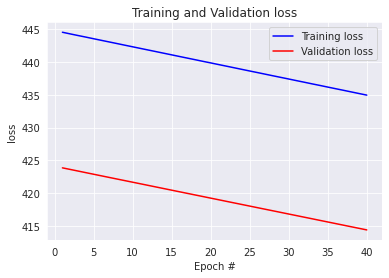

2/2 [==============================] - 0s 8ms/step - loss: 318.4442 - root_mean_squared_error: 17.8017
Model: 526
2/2 [==============================] - 0s 12ms/step - loss: 327.5377 - root_mean_squared_error: 18.0910
MODEL EVALUATION:  [327.5377197265625, 18.091007232666016]


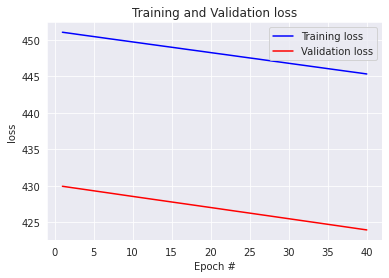

2/2 [==============================] - 0s 7ms/step - loss: 327.5377 - root_mean_squared_error: 18.0910
Model: 527
2/2 [==============================] - 0s 6ms/step - loss: 329.9911 - root_mean_squared_error: 18.1361
MODEL EVALUATION:  [329.9910583496094, 18.13613510131836]


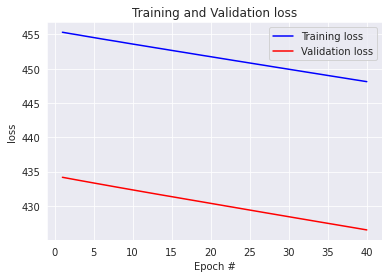

2/2 [==============================] - 0s 8ms/step - loss: 329.9911 - root_mean_squared_error: 18.1361
Model: 528
2/2 [==============================] - 0s 15ms/step - loss: 337.4149 - root_mean_squared_error: 18.3272
MODEL EVALUATION:  [337.4149475097656, 18.327157974243164]


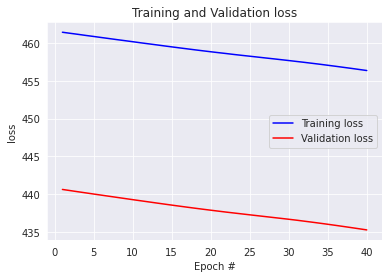

2/2 [==============================] - 0s 5ms/step - loss: 337.4149 - root_mean_squared_error: 18.3272
Model: 529
2/2 [==============================] - 0s 5ms/step - loss: 16.9003 - root_mean_squared_error: 4.1110
MODEL EVALUATION:  [16.900297164916992, 4.110997200012207]


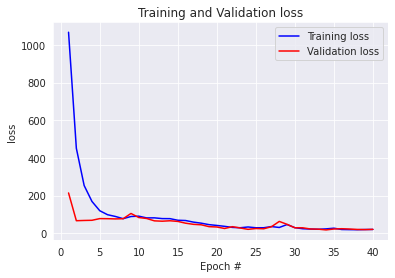

2/2 [==============================] - 0s 7ms/step - loss: 16.9003 - root_mean_squared_error: 4.1110
Model: 530
2/2 [==============================] - 0s 16ms/step - loss: 38.8719 - root_mean_squared_error: 6.2347
MODEL EVALUATION:  [38.87190628051758, 6.234733581542969]


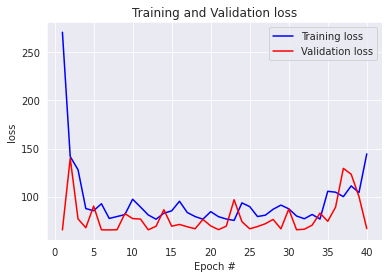

2/2 [==============================] - 0s 10ms/step - loss: 38.8719 - root_mean_squared_error: 6.2347
Model: 531
2/2 [==============================] - 0s 9ms/step - loss: 59.0896 - root_mean_squared_error: 7.6870
MODEL EVALUATION:  [59.08958053588867, 7.68697452545166]


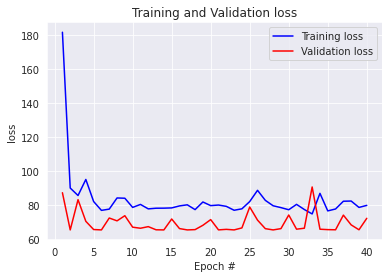

2/2 [==============================] - 0s 8ms/step - loss: 59.0896 - root_mean_squared_error: 7.6870
Model: 532
2/2 [==============================] - 0s 5ms/step - loss: 1.5312 - root_mean_squared_error: 1.2374
MODEL EVALUATION:  [1.531186580657959, 1.2374112606048584]


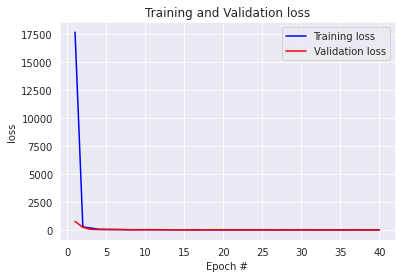

2/2 [==============================] - 0s 7ms/step - loss: 1.5312 - root_mean_squared_error: 1.2374
Model: 533
2/2 [==============================] - 0s 8ms/step - loss: 2.3976 - root_mean_squared_error: 1.5484
MODEL EVALUATION:  [2.397618293762207, 1.548424482345581]


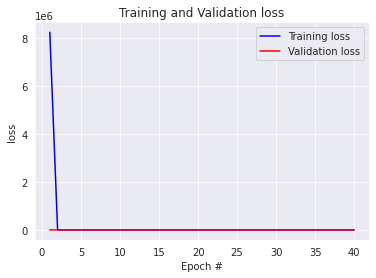

2/2 [==============================] - 0s 7ms/step - loss: 2.3976 - root_mean_squared_error: 1.5484
Model: 534
2/2 [==============================] - 0s 8ms/step - loss: 462.1862 - root_mean_squared_error: 21.4985
MODEL EVALUATION:  [462.1861572265625, 21.49851417541504]


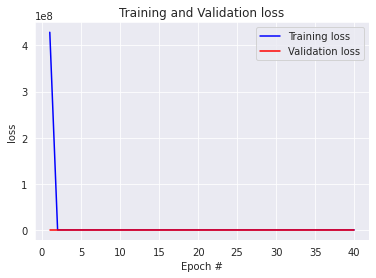

2/2 [==============================] - 0s 8ms/step - loss: 462.1862 - root_mean_squared_error: 21.4985
Model: 535
2/2 [==============================] - 0s 11ms/step - loss: 0.7269 - root_mean_squared_error: 0.8526
MODEL EVALUATION:  [0.7268576622009277, 0.8525594472885132]


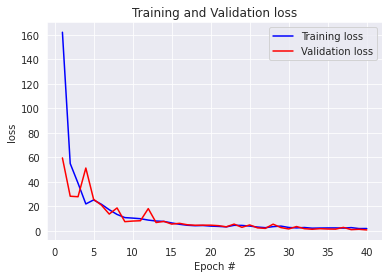

2/2 [==============================] - 0s 10ms/step - loss: 0.7269 - root_mean_squared_error: 0.8526
Model: 536
2/2 [==============================] - 0s 10ms/step - loss: 38.2654 - root_mean_squared_error: 6.1859
MODEL EVALUATION:  [38.26543045043945, 6.185905933380127]


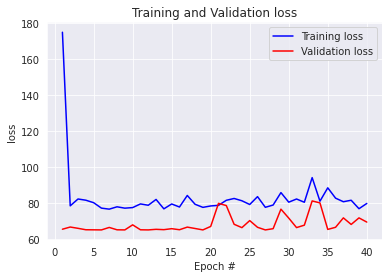

2/2 [==============================] - 0s 14ms/step - loss: 38.2654 - root_mean_squared_error: 6.1859
Model: 537
2/2 [==============================] - 0s 9ms/step - loss: 48.1967 - root_mean_squared_error: 6.9424
MODEL EVALUATION:  [48.196685791015625, 6.942383289337158]


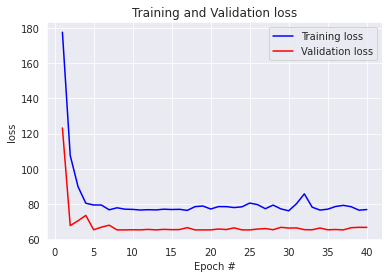

2/2 [==============================] - 0s 12ms/step - loss: 48.1967 - root_mean_squared_error: 6.9424
Model: 538
2/2 [==============================] - 0s 14ms/step - loss: 1.6771 - root_mean_squared_error: 1.2950
MODEL EVALUATION:  [1.6770753860473633, 1.2950193881988525]


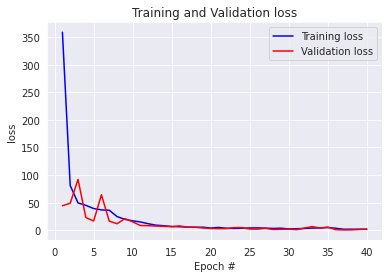

2/2 [==============================] - 0s 8ms/step - loss: 1.6771 - root_mean_squared_error: 1.2950
Model: 539
2/2 [==============================] - 0s 8ms/step - loss: 0.7859 - root_mean_squared_error: 0.8865
MODEL EVALUATION:  [0.7858730554580688, 0.8864948153495789]


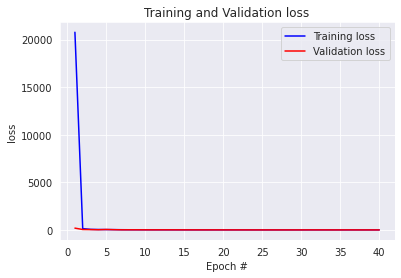

2/2 [==============================] - 0s 8ms/step - loss: 0.7859 - root_mean_squared_error: 0.8865
Model: 540
2/2 [==============================] - 0s 11ms/step - loss: 0.7821 - root_mean_squared_error: 0.8844
MODEL EVALUATION:  [0.7821134328842163, 0.8843717575073242]


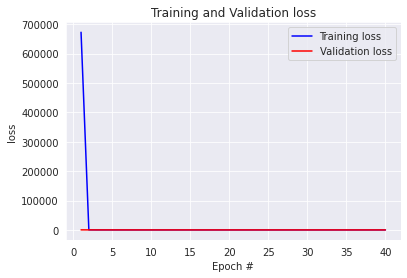

2/2 [==============================] - 0s 7ms/step - loss: 0.7821 - root_mean_squared_error: 0.8844
Model: 541
2/2 [==============================] - 0s 8ms/step - loss: 1.3307 - root_mean_squared_error: 1.1536
MODEL EVALUATION:  [1.3307099342346191, 1.1535639762878418]


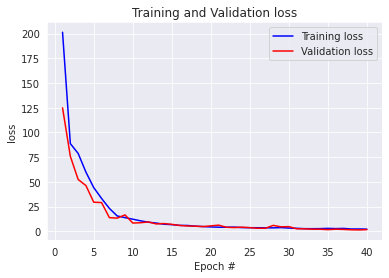

2/2 [==============================] - 0s 8ms/step - loss: 1.3307 - root_mean_squared_error: 1.1536
Model: 542
2/2 [==============================] - 0s 10ms/step - loss: 43.9995 - root_mean_squared_error: 6.6332
MODEL EVALUATION:  [43.99948501586914, 6.6332106590271]


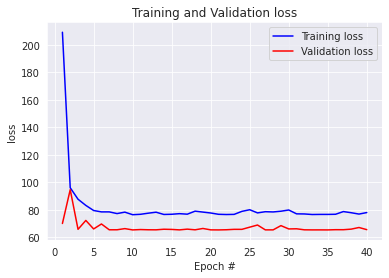

2/2 [==============================] - 0s 6ms/step - loss: 43.9995 - root_mean_squared_error: 6.6332
Model: 543
2/2 [==============================] - 0s 7ms/step - loss: 44.3371 - root_mean_squared_error: 6.6586
MODEL EVALUATION:  [44.337093353271484, 6.6586103439331055]


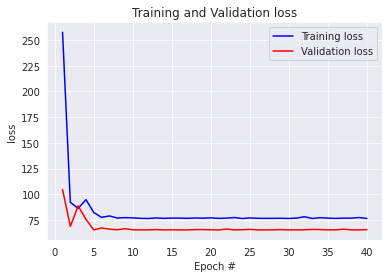

2/2 [==============================] - 0s 4ms/step - loss: 44.3371 - root_mean_squared_error: 6.6586
Model: 544
2/2 [==============================] - 0s 8ms/step - loss: 0.8916 - root_mean_squared_error: 0.9443
MODEL EVALUATION:  [0.891613781452179, 0.9442530274391174]


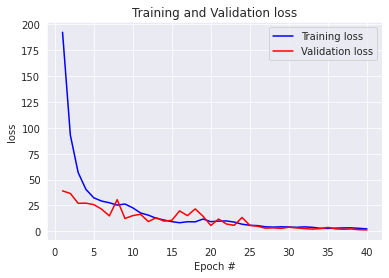

2/2 [==============================] - 0s 8ms/step - loss: 0.8916 - root_mean_squared_error: 0.9443
Model: 545
2/2 [==============================] - 0s 17ms/step - loss: 1.3314 - root_mean_squared_error: 1.1539
MODEL EVALUATION:  [1.3314024209976196, 1.1538641452789307]


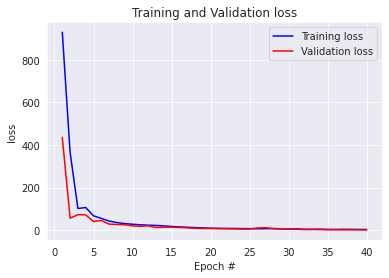

2/2 [==============================] - 0s 8ms/step - loss: 1.3314 - root_mean_squared_error: 1.1539
Model: 546
2/2 [==============================] - 0s 8ms/step - loss: 1.7302 - root_mean_squared_error: 1.3154
MODEL EVALUATION:  [1.7301832437515259, 1.3153642416000366]


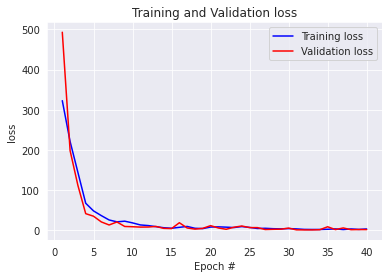

2/2 [==============================] - 0s 5ms/step - loss: 1.7302 - root_mean_squared_error: 1.3154
Model: 547
2/2 [==============================] - 0s 17ms/step - loss: 15.2480 - root_mean_squared_error: 3.9049
MODEL EVALUATION:  [15.247962951660156, 3.9048640727996826]


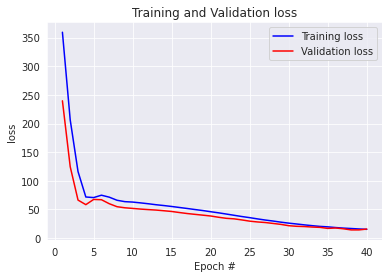

2/2 [==============================] - 0s 8ms/step - loss: 15.2480 - root_mean_squared_error: 3.9049
Model: 548
2/2 [==============================] - 0s 20ms/step - loss: 43.2458 - root_mean_squared_error: 6.5762
MODEL EVALUATION:  [43.24578094482422, 6.576152324676514]


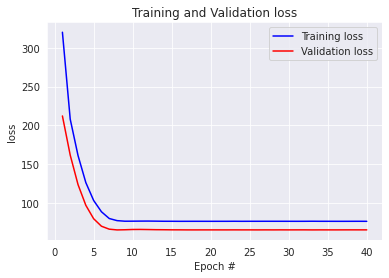

2/2 [==============================] - 0s 8ms/step - loss: 43.2458 - root_mean_squared_error: 6.5762
Model: 549
2/2 [==============================] - 0s 6ms/step - loss: 43.3165 - root_mean_squared_error: 6.5815
MODEL EVALUATION:  [43.31647872924805, 6.581525802612305]


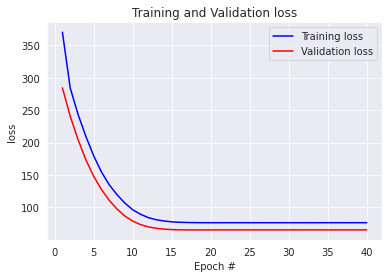

2/2 [==============================] - 0s 8ms/step - loss: 43.3165 - root_mean_squared_error: 6.5815
Model: 550
2/2 [==============================] - 0s 10ms/step - loss: 15.2999 - root_mean_squared_error: 3.9115
MODEL EVALUATION:  [15.299936294555664, 3.911513328552246]


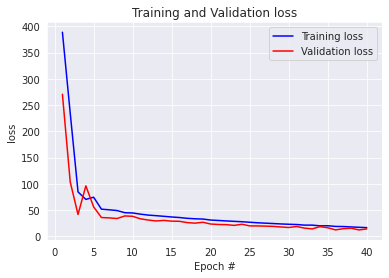

2/2 [==============================] - 0s 8ms/step - loss: 15.2999 - root_mean_squared_error: 3.9115
Model: 551
2/2 [==============================] - 0s 8ms/step - loss: 1.9067 - root_mean_squared_error: 1.3808
MODEL EVALUATION:  [1.9067023992538452, 1.3808339834213257]


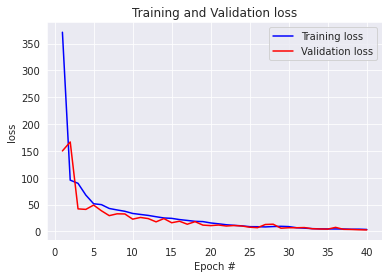

2/2 [==============================] - 0s 7ms/step - loss: 1.9067 - root_mean_squared_error: 1.3808
Model: 552
2/2 [==============================] - 0s 14ms/step - loss: 4.1403 - root_mean_squared_error: 2.0348
MODEL EVALUATION:  [4.140302658081055, 2.034773349761963]


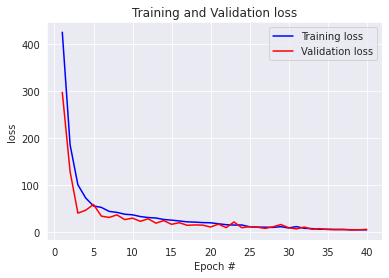

2/2 [==============================] - 0s 8ms/step - loss: 4.1403 - root_mean_squared_error: 2.0348
Model: 553
2/2 [==============================] - 0s 11ms/step - loss: 4.2783 - root_mean_squared_error: 2.0684
MODEL EVALUATION:  [4.278328895568848, 2.0684120655059814]


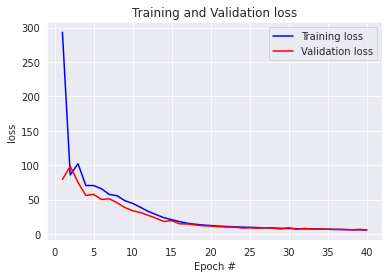

2/2 [==============================] - 0s 7ms/step - loss: 4.2783 - root_mean_squared_error: 2.0684
Model: 554
2/2 [==============================] - 0s 17ms/step - loss: 42.6399 - root_mean_squared_error: 6.5299
MODEL EVALUATION:  [42.63994216918945, 6.529926300048828]


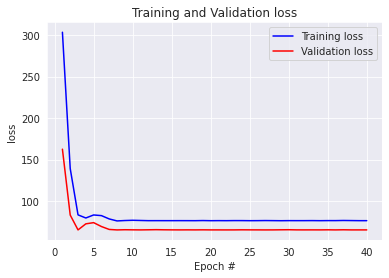

2/2 [==============================] - 0s 5ms/step - loss: 42.6399 - root_mean_squared_error: 6.5299
Model: 555
2/2 [==============================] - 0s 18ms/step - loss: 42.7580 - root_mean_squared_error: 6.5390
MODEL EVALUATION:  [42.75795364379883, 6.538956642150879]


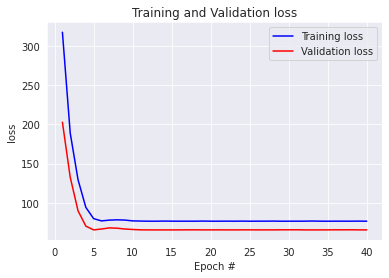

2/2 [==============================] - 0s 9ms/step - loss: 42.7580 - root_mean_squared_error: 6.5390
Model: 556
2/2 [==============================] - 0s 16ms/step - loss: 2.7574 - root_mean_squared_error: 1.6605
MODEL EVALUATION:  [2.7573909759521484, 1.6605392694473267]


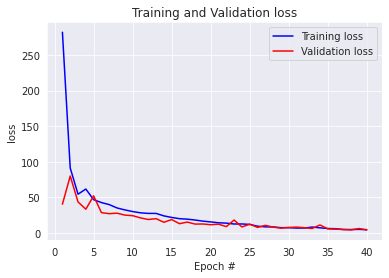

2/2 [==============================] - 0s 8ms/step - loss: 2.7574 - root_mean_squared_error: 1.6605
Model: 557
2/2 [==============================] - 0s 14ms/step - loss: 0.8505 - root_mean_squared_error: 0.9222
MODEL EVALUATION:  [0.8505035042762756, 0.9222275018692017]


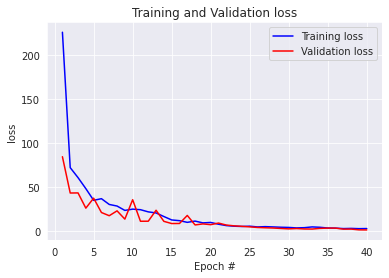

2/2 [==============================] - 0s 8ms/step - loss: 0.8505 - root_mean_squared_error: 0.9222
Model: 558
2/2 [==============================] - 0s 5ms/step - loss: 2.3260 - root_mean_squared_error: 1.5251
MODEL EVALUATION:  [2.3259658813476562, 1.5251117944717407]


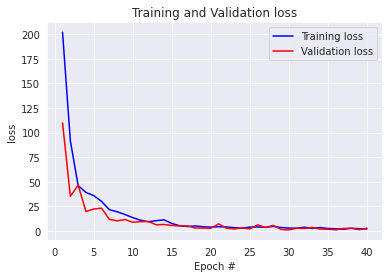

2/2 [==============================] - 0s 8ms/step - loss: 2.3260 - root_mean_squared_error: 1.5251
Model: 559
2/2 [==============================] - 0s 9ms/step - loss: 35.4495 - root_mean_squared_error: 5.9539
MODEL EVALUATION:  [35.449493408203125, 5.953948020935059]


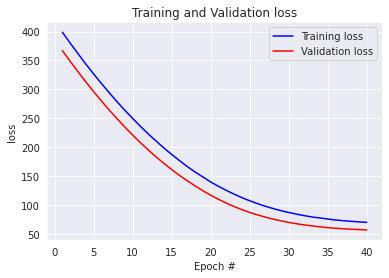

2/2 [==============================] - 0s 5ms/step - loss: 35.4495 - root_mean_squared_error: 5.9539
Model: 560
2/2 [==============================] - 0s 9ms/step - loss: 43.5973 - root_mean_squared_error: 6.6028
MODEL EVALUATION:  [43.59727478027344, 6.602823257446289]


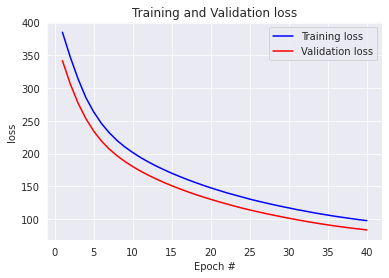

2/2 [==============================] - 0s 7ms/step - loss: 43.5973 - root_mean_squared_error: 6.6028
Model: 561
2/2 [==============================] - 0s 11ms/step - loss: 97.5379 - root_mean_squared_error: 9.8761
MODEL EVALUATION:  [97.53785705566406, 9.87612533569336]


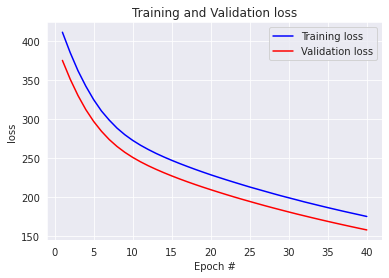

2/2 [==============================] - 0s 9ms/step - loss: 97.5379 - root_mean_squared_error: 9.8761
Model: 562
2/2 [==============================] - 0s 8ms/step - loss: 40.1853 - root_mean_squared_error: 6.3392
MODEL EVALUATION:  [40.185302734375, 6.3391876220703125]


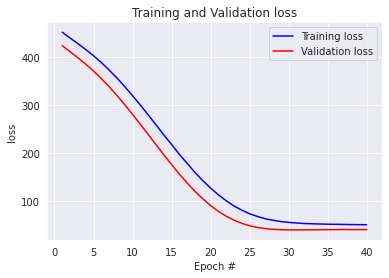

2/2 [==============================] - 0s 7ms/step - loss: 40.1853 - root_mean_squared_error: 6.3392
Model: 563
2/2 [==============================] - 0s 13ms/step - loss: 31.6781 - root_mean_squared_error: 5.6283
MODEL EVALUATION:  [31.678119659423828, 5.628331661224365]


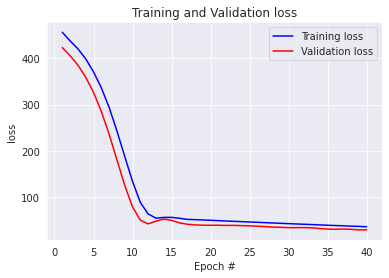

2/2 [==============================] - 0s 8ms/step - loss: 31.6781 - root_mean_squared_error: 5.6283
Model: 564
2/2 [==============================] - 0s 12ms/step - loss: 19.2656 - root_mean_squared_error: 4.3893
MODEL EVALUATION:  [19.26558494567871, 4.389257907867432]


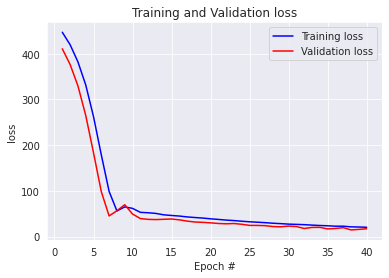

2/2 [==============================] - 0s 8ms/step - loss: 19.2656 - root_mean_squared_error: 4.3893
Model: 565
2/2 [==============================] - 0s 9ms/step - loss: 277.1681 - root_mean_squared_error: 16.6484
MODEL EVALUATION:  [277.1681213378906, 16.648366928100586]


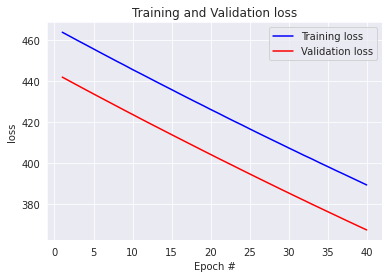

2/2 [==============================] - 0s 8ms/step - loss: 277.1681 - root_mean_squared_error: 16.6484
Model: 566
2/2 [==============================] - 0s 15ms/step - loss: 202.7161 - root_mean_squared_error: 14.2378
MODEL EVALUATION:  [202.7161407470703, 14.237841606140137]


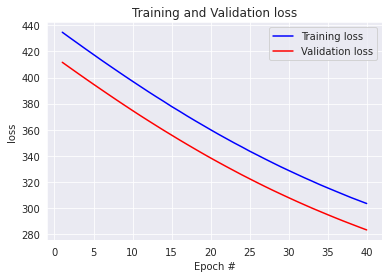

2/2 [==============================] - 0s 7ms/step - loss: 202.7161 - root_mean_squared_error: 14.2378
Model: 567
2/2 [==============================] - 0s 9ms/step - loss: 279.7439 - root_mean_squared_error: 16.7255
MODEL EVALUATION:  [279.743896484375, 16.72554588317871]


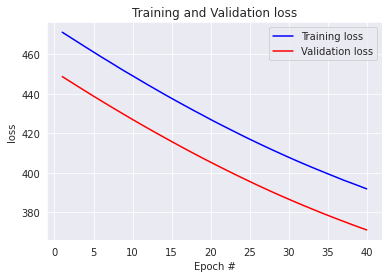

2/2 [==============================] - 0s 8ms/step - loss: 279.7439 - root_mean_squared_error: 16.7255
Model: 568
2/2 [==============================] - 0s 8ms/step - loss: 282.1007 - root_mean_squared_error: 16.7959
MODEL EVALUATION:  [282.1006774902344, 16.795852661132812]


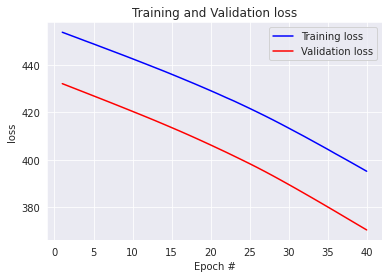

2/2 [==============================] - 0s 8ms/step - loss: 282.1007 - root_mean_squared_error: 16.7959
Model: 569
2/2 [==============================] - 0s 12ms/step - loss: 253.7092 - root_mean_squared_error: 15.9283
MODEL EVALUATION:  [253.70916748046875, 15.928250312805176]


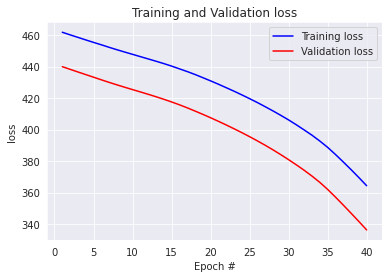

2/2 [==============================] - 0s 8ms/step - loss: 253.7092 - root_mean_squared_error: 15.9283
Model: 570
2/2 [==============================] - 0s 18ms/step - loss: 172.1249 - root_mean_squared_error: 13.1196
MODEL EVALUATION:  [172.12493896484375, 13.11963939666748]


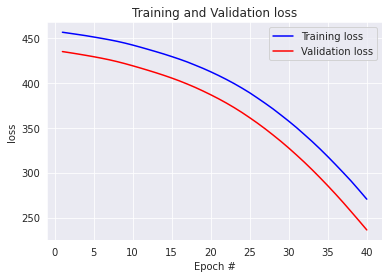

2/2 [==============================] - 0s 13ms/step - loss: 172.1249 - root_mean_squared_error: 13.1196
Model: 571
2/2 [==============================] - 0s 14ms/step - loss: 350.0233 - root_mean_squared_error: 18.7089
MODEL EVALUATION:  [350.0233154296875, 18.70890998840332]


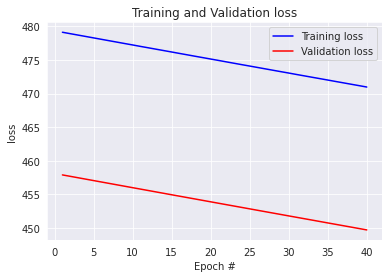

2/2 [==============================] - 0s 7ms/step - loss: 350.0233 - root_mean_squared_error: 18.7089
Model: 572
2/2 [==============================] - 0s 9ms/step - loss: 328.9336 - root_mean_squared_error: 18.1365
MODEL EVALUATION:  [328.9336242675781, 18.136526107788086]


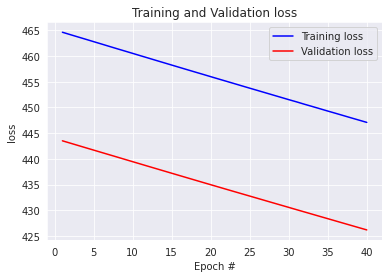

2/2 [==============================] - 0s 4ms/step - loss: 328.9336 - root_mean_squared_error: 18.1365
Model: 573
2/2 [==============================] - 0s 9ms/step - loss: 358.5062 - root_mean_squared_error: 18.9343
MODEL EVALUATION:  [358.5061950683594, 18.93425941467285]


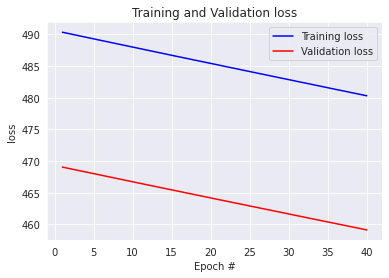

2/2 [==============================] - 0s 8ms/step - loss: 358.5062 - root_mean_squared_error: 18.9343
Model: 574
2/2 [==============================] - 0s 16ms/step - loss: 338.9359 - root_mean_squared_error: 18.4102
MODEL EVALUATION:  [338.9358825683594, 18.41021156311035]


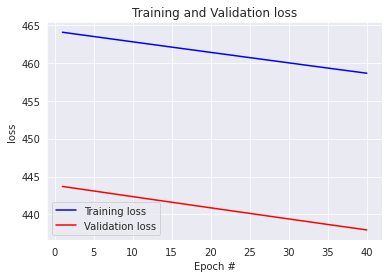

2/2 [==============================] - 0s 8ms/step - loss: 338.9359 - root_mean_squared_error: 18.4102
Model: 575
2/2 [==============================] - 0s 20ms/step - loss: 333.7209 - root_mean_squared_error: 18.2680
MODEL EVALUATION:  [333.72088623046875, 18.268028259277344]


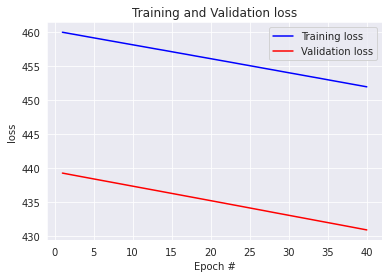

2/2 [==============================] - 0s 9ms/step - loss: 333.7209 - root_mean_squared_error: 18.2680
Model: 576
2/2 [==============================] - 0s 11ms/step - loss: 329.4962 - root_mean_squared_error: 18.1520
MODEL EVALUATION:  [329.4962158203125, 18.15203094482422]


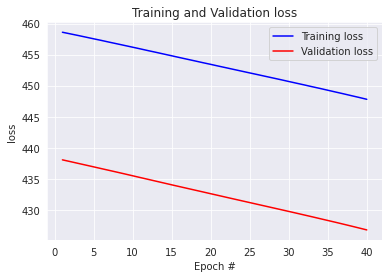

2/2 [==============================] - 0s 9ms/step - loss: 329.4962 - root_mean_squared_error: 18.1520


In [10]:
model_eval = []
for i in range (len(lst)):
  print(f'Model: {i+1}')
  eval = build_models(*lst[i])
  model_eval.append(eval)

#### Question-2: Visualize the training and validation loss against the epochs and comment on optimal hyperparameters.

In [11]:
arr = []
for i in range(0,576):
  arr.append(model_eval[i][1])

In [12]:
np.array(arr).argmin()

489

In [13]:
lst[466]

(40, 'l1', 0.001, 'relu', 2)